# Afriat

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

In [3]:
torch.cuda.is_available()

False

In [4]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [5]:
adata_file_path = os.path.join(tardis.config.io_directories["processed"], "biolord_afriat.h5ad")
assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
adata = ad.read_h5ad(adata_file_path)
adata

AnnData object with n_obs × n_vars = 19053 × 5000
    obs: 'mouse', 'experiment', 'time_int', 'time_cat', 'zone', 'status_control'

In [6]:
asdp_1 = adata.X.sum()

In [7]:
ratio_true=0.998

from tardis._utils.functions import create_random_mask
mask = create_random_mask(adata.shape[1], ratio_true=ratio_true, seed=2024)
adata.X[:, mask] = 0.0

In [8]:
asdp_2 = adata.X.sum()

In [9]:
mask.sum()/adata.shape[1],  1-asdp_2/asdp_1

(0.9982, 0.995778757147491)

In [10]:
model_level_metrics = [
    dict(
        metric_identifier = "metric_mi|status_control",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 256,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|zone",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|time_cat",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|mouse",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    )
]

In [11]:
warmup_epoch_range = [6, 48]
dtc_w1 = 100
dtc_w2 = 10

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = None,
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "status_control",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    ),
    dict(
        obs_key = "time_cat",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    ),
    dict(
        obs_key = "zone",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    )
]

In [12]:
n_epochs_kl_warmup = 600

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(24 + 8 * len(disentenglement_targets_configurations)),
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.25,
    deeply_inject_disentengled_latents = True,
    include_auxillary_loss = True,
    beta_kl_weight = 0.5,
)

train_params = dict(
    max_epochs=600,
    train_size=0.8,
    batch_size=128,
    check_val_every_n_epoch=10,
    limit_train_batches=1.0, 
    limit_val_batches=1.0,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=False,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=1e-4,
        weight_decay=1e-4,
        optimizer="AdamW",
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=None,
    disentenglement_targets_configurations=disentenglement_targets_configurations,
    model_level_metrics=model_level_metrics,
    model_level_metrics_helper_covariates=['zone', 'status_control', 'time_cat', 'mouse']
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

tardis.MyModel.setup_wandb(
    wandb_configurations=tardis.config.wandb,
    hyperparams=dict(
        model_params=model_params,
        train_params=train_params,
        dataset_params=dataset_params,
    )
)

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

dir_path = os.path.join(
    tardis.config.io_directories["models"],
    f"afriat_v2_4_ablation_{ratio_true}"
)

vae.save(
    dir_path,
    overwrite=True,
)

/home/icb/kemal.inecik/work/codes/tardis/tardis/_mymodel.py:81: UserWarning: This dataset has some empty cells, this might fail inference.Data should be filtered with `scanpy.pp.filter_cells()`
  library_log_means, library_log_vars = _init_library_size(self.adata_manager, n_batch)


W&B logger initialized with the following parameters: 
Entity: inecik-academic
Project: tardis_figures
ID: 1qnohdj7
Name: true-plasma-125
Tags: tardis, conference, figures, final
Notes: Final runs for Tardis before conference.
URL: https://wandb.ai/inecik-academic/tardis_figures/runs/1qnohdj7
Directory: /lustre/groups/ml01/workspace/kemal.inecik/wandb/run-20240503_120415-1qnohdj7/files



GPU available: False, used: False


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..


`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "
SLURM auto-requeueing enabled. Setting signal handlers.


Training:   0%|                                                                                                                                                                                                                                 | 0/600 [00:00<?, ?it/s]

Epoch 1/600:   0%|                                                                                                                                                                                                                              | 0/600 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `status_control` for `training` set. Number of elements in each group: 2551,3315,9377
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `time_cat` for `training` set. Number of elements in each group: 2551,2555,1665,3422,1662,3388
  possible_indices = CachedPossibleGroupDefinitionIndices.get(
/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `zone` for `training` set. Number of elements in each group: 4484,10759
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `status_control` for `validation` set. Number of elements in each group: 654,794,2362
  possible_indices = CachedPossibleGroupDefinitionIndices.get(
/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `time_cat` for `validation` set. Number of elements in each group: 654,647,443,868,387,811
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `zone` for `validation` set. Number of elements in each group: 1100,2710
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


Epoch 1/600:   0%|▎                                                                                                                                                                                                                   | 1/600 [00:13<2:13:11, 13.34s/it]

Epoch 1/600:   0%|▎                                                                                                                                                           | 1/600 [00:13<2:13:11, 13.34s/it, v_num=j7_1, total_loss_train=28.1, kl_local_train=27.2]

Epoch 2/600:   0%|▎                                                                                                                                                           | 1/600 [00:13<2:13:11, 13.34s/it, v_num=j7_1, total_loss_train=28.1, kl_local_train=27.2]

Epoch 2/600:   0%|▌                                                                                                                                                           | 2/600 [00:25<2:05:10, 12.56s/it, v_num=j7_1, total_loss_train=28.1, kl_local_train=27.2]

Epoch 2/600:   0%|▌                                                                                                                                                           | 2/600 [00:25<2:05:10, 12.56s/it, v_num=j7_1, total_loss_train=12.1, kl_local_train=37.8]

Epoch 3/600:   0%|▌                                                                                                                                                           | 2/600 [00:25<2:05:10, 12.56s/it, v_num=j7_1, total_loss_train=12.1, kl_local_train=37.8]

Epoch 3/600:   0%|▊                                                                                                                                                           | 3/600 [00:37<2:02:41, 12.33s/it, v_num=j7_1, total_loss_train=12.1, kl_local_train=37.8]

Epoch 3/600:   0%|▊                                                                                                                                                           | 3/600 [00:37<2:02:41, 12.33s/it, v_num=j7_1, total_loss_train=9.61, kl_local_train=33.1]

Epoch 4/600:   0%|▊                                                                                                                                                           | 3/600 [00:37<2:02:41, 12.33s/it, v_num=j7_1, total_loss_train=9.61, kl_local_train=33.1]

Epoch 4/600:   1%|█                                                                                                                                                           | 4/600 [00:49<2:01:52, 12.27s/it, v_num=j7_1, total_loss_train=9.61, kl_local_train=33.1]

Epoch 4/600:   1%|█                                                                                                                                                           | 4/600 [00:49<2:01:52, 12.27s/it, v_num=j7_1, total_loss_train=8.99, kl_local_train=23.8]

Epoch 5/600:   1%|█                                                                                                                                                           | 4/600 [00:49<2:01:52, 12.27s/it, v_num=j7_1, total_loss_train=8.99, kl_local_train=23.8]

Epoch 5/600:   1%|█▎                                                                                                                                                          | 5/600 [01:01<2:01:17, 12.23s/it, v_num=j7_1, total_loss_train=8.99, kl_local_train=23.8]

Epoch 5/600:   1%|█▎                                                                                                                                                          | 5/600 [01:01<2:01:17, 12.23s/it, v_num=j7_1, total_loss_train=8.66, kl_local_train=15.2]

Epoch 6/600:   1%|█▎                                                                                                                                                          | 5/600 [01:03<2:01:17, 12.23s/it, v_num=j7_1, total_loss_train=8.66, kl_local_train=15.2]

Epoch 6/600:   1%|█▌                                                                                                                                                          | 6/600 [01:14<2:03:17, 12.45s/it, v_num=j7_1, total_loss_train=8.66, kl_local_train=15.2]

Epoch 6/600:   1%|▎                        | 6/600 [01:14<2:03:17, 12.45s/it, v_num=j7_1, total_loss_train=8.32, kl_local_train=12.1, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.0104, metric_mi|time_cat_train=0.0148, metric_mi|mouse_train=0.0366]

Epoch 7/600:   1%|▎                        | 6/600 [01:14<2:03:17, 12.45s/it, v_num=j7_1, total_loss_train=8.32, kl_local_train=12.1, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.0104, metric_mi|time_cat_train=0.0148, metric_mi|mouse_train=0.0366]

Epoch 7/600:   1%|▎                        | 7/600 [01:26<2:00:23, 12.18s/it, v_num=j7_1, total_loss_train=8.32, kl_local_train=12.1, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.0104, metric_mi|time_cat_train=0.0148, metric_mi|mouse_train=0.0366]

Epoch 7/600:   1%|▎                        | 7/600 [01:26<2:00:23, 12.18s/it, v_num=j7_1, total_loss_train=8.11, kl_local_train=11.8, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.0104, metric_mi|time_cat_train=0.0148, metric_mi|mouse_train=0.0366]

Epoch 8/600:   1%|▎                        | 7/600 [01:26<2:00:23, 12.18s/it, v_num=j7_1, total_loss_train=8.11, kl_local_train=11.8, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.0104, metric_mi|time_cat_train=0.0148, metric_mi|mouse_train=0.0366]

Epoch 8/600:   1%|▎                        | 8/600 [01:37<1:58:19, 11.99s/it, v_num=j7_1, total_loss_train=8.11, kl_local_train=11.8, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.0104, metric_mi|time_cat_train=0.0148, metric_mi|mouse_train=0.0366]

Epoch 8/600:   1%|▎                          | 8/600 [01:37<1:58:19, 11.99s/it, v_num=j7_1, total_loss_train=15.8, kl_local_train=11, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.0104, metric_mi|time_cat_train=0.0148, metric_mi|mouse_train=0.0366]

Epoch 9/600:   1%|▎                          | 8/600 [01:37<1:58:19, 11.99s/it, v_num=j7_1, total_loss_train=15.8, kl_local_train=11, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.0104, metric_mi|time_cat_train=0.0148, metric_mi|mouse_train=0.0366]

Epoch 9/600:   2%|▍                          | 9/600 [01:49<1:56:53, 11.87s/it, v_num=j7_1, total_loss_train=15.8, kl_local_train=11, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.0104, metric_mi|time_cat_train=0.0148, metric_mi|mouse_train=0.0366]

Epoch 9/600:   2%|▍                        | 9/600 [01:49<1:56:53, 11.87s/it, v_num=j7_1, total_loss_train=22.2, kl_local_train=36.7, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.0104, metric_mi|time_cat_train=0.0148, metric_mi|mouse_train=0.0366]

Epoch 10/600:   2%|▎                       | 9/600 [01:49<1:56:53, 11.87s/it, v_num=j7_1, total_loss_train=22.2, kl_local_train=36.7, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.0104, metric_mi|time_cat_train=0.0148, metric_mi|mouse_train=0.0366]

Epoch 10/600:   2%|▍                      | 10/600 [02:01<1:56:15, 11.82s/it, v_num=j7_1, total_loss_train=22.2, kl_local_train=36.7, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.0104, metric_mi|time_cat_train=0.0148, metric_mi|mouse_train=0.0366]

Epoch 10/600:   2%|▍                      | 10/600 [02:01<1:56:15, 11.82s/it, v_num=j7_1, total_loss_train=25.7, kl_local_train=69.7, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.0104, metric_mi|time_cat_train=0.0148, metric_mi|mouse_train=0.0366]

Epoch 11/600:   2%|▍                      | 10/600 [02:02<1:56:15, 11.82s/it, v_num=j7_1, total_loss_train=25.7, kl_local_train=69.7, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.0104, metric_mi|time_cat_train=0.0148, metric_mi|mouse_train=0.0366]

Epoch 11/600:   2%|▍                      | 11/600 [02:14<1:59:15, 12.15s/it, v_num=j7_1, total_loss_train=25.7, kl_local_train=69.7, metric_mi|status_control_train=0.0209, metric_mi|zone_train=0.0104, metric_mi|time_cat_train=0.0148, metric_mi|mouse_train=0.0366]

Epoch 11/600:   2%|▍                         | 11/600 [02:14<1:59:15, 12.15s/it, v_num=j7_1, total_loss_train=30.3, kl_local_train=79.3, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.0581, metric_mi|mouse_train=0.064]

Epoch 12/600:   2%|▍                         | 11/600 [02:14<1:59:15, 12.15s/it, v_num=j7_1, total_loss_train=30.3, kl_local_train=79.3, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.0581, metric_mi|mouse_train=0.064]

Epoch 12/600:   2%|▌                         | 12/600 [02:25<1:57:31, 11.99s/it, v_num=j7_1, total_loss_train=30.3, kl_local_train=79.3, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.0581, metric_mi|mouse_train=0.064]

Epoch 12/600:   2%|▌                         | 12/600 [02:25<1:57:31, 11.99s/it, v_num=j7_1, total_loss_train=34.7, kl_local_train=83.9, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.0581, metric_mi|mouse_train=0.064]

Epoch 13/600:   2%|▌                         | 12/600 [02:25<1:57:31, 11.99s/it, v_num=j7_1, total_loss_train=34.7, kl_local_train=83.9, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.0581, metric_mi|mouse_train=0.064]

Epoch 13/600:   2%|▌                         | 13/600 [02:37<1:56:17, 11.89s/it, v_num=j7_1, total_loss_train=34.7, kl_local_train=83.9, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.0581, metric_mi|mouse_train=0.064]

Epoch 13/600:   2%|▌                          | 13/600 [02:37<1:56:17, 11.89s/it, v_num=j7_1, total_loss_train=37.8, kl_local_train=108, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.0581, metric_mi|mouse_train=0.064]

Epoch 14/600:   2%|▌                          | 13/600 [02:37<1:56:17, 11.89s/it, v_num=j7_1, total_loss_train=37.8, kl_local_train=108, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.0581, metric_mi|mouse_train=0.064]

Epoch 14/600:   2%|▋                          | 14/600 [02:48<1:55:23, 11.81s/it, v_num=j7_1, total_loss_train=37.8, kl_local_train=108, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.0581, metric_mi|mouse_train=0.064]

Epoch 14/600:   2%|▋                          | 14/600 [02:48<1:55:23, 11.81s/it, v_num=j7_1, total_loss_train=41.5, kl_local_train=120, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.0581, metric_mi|mouse_train=0.064]

Epoch 15/600:   2%|▋                          | 14/600 [02:48<1:55:23, 11.81s/it, v_num=j7_1, total_loss_train=41.5, kl_local_train=120, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.0581, metric_mi|mouse_train=0.064]

Epoch 15/600:   2%|▋                          | 15/600 [03:00<1:54:55, 11.79s/it, v_num=j7_1, total_loss_train=41.5, kl_local_train=120, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.0581, metric_mi|mouse_train=0.064]

Epoch 15/600:   2%|▋                          | 15/600 [03:00<1:54:55, 11.79s/it, v_num=j7_1, total_loss_train=45.6, kl_local_train=126, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.0581, metric_mi|mouse_train=0.064]

Epoch 16/600:   2%|▋                          | 15/600 [03:01<1:54:55, 11.79s/it, v_num=j7_1, total_loss_train=45.6, kl_local_train=126, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.0581, metric_mi|mouse_train=0.064]

Epoch 16/600:   3%|▋                          | 16/600 [03:13<1:57:52, 12.11s/it, v_num=j7_1, total_loss_train=45.6, kl_local_train=126, metric_mi|status_control_train=0.152, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.0581, metric_mi|mouse_train=0.064]

Epoch 16/600:   3%|▋                           | 16/600 [03:13<1:57:52, 12.11s/it, v_num=j7_1, total_loss_train=49.8, kl_local_train=130, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 17/600:   3%|▋                           | 16/600 [03:13<1:57:52, 12.11s/it, v_num=j7_1, total_loss_train=49.8, kl_local_train=130, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 17/600:   3%|▊                           | 17/600 [03:25<1:56:16, 11.97s/it, v_num=j7_1, total_loss_train=49.8, kl_local_train=130, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 17/600:   3%|▊                             | 17/600 [03:25<1:56:16, 11.97s/it, v_num=j7_1, total_loss_train=54, kl_local_train=133, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 18/600:   3%|▊                             | 17/600 [03:25<1:56:16, 11.97s/it, v_num=j7_1, total_loss_train=54, kl_local_train=133, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 18/600:   3%|▉                             | 18/600 [03:36<1:55:05, 11.87s/it, v_num=j7_1, total_loss_train=54, kl_local_train=133, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 18/600:   3%|▊                           | 18/600 [03:36<1:55:05, 11.87s/it, v_num=j7_1, total_loss_train=58.3, kl_local_train=136, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 19/600:   3%|▊                           | 18/600 [03:36<1:55:05, 11.87s/it, v_num=j7_1, total_loss_train=58.3, kl_local_train=136, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 19/600:   3%|▉                           | 19/600 [03:48<1:54:10, 11.79s/it, v_num=j7_1, total_loss_train=58.3, kl_local_train=136, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 19/600:   3%|▉                           | 19/600 [03:48<1:54:10, 11.79s/it, v_num=j7_1, total_loss_train=62.6, kl_local_train=137, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 20/600:   3%|▉                           | 19/600 [03:48<1:54:10, 11.79s/it, v_num=j7_1, total_loss_train=62.6, kl_local_train=137, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 20/600:   3%|▉                           | 20/600 [04:00<1:53:47, 11.77s/it, v_num=j7_1, total_loss_train=62.6, kl_local_train=137, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 20/600:   3%|▉                           | 20/600 [04:00<1:53:47, 11.77s/it, v_num=j7_1, total_loss_train=66.7, kl_local_train=135, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 21/600:   3%|▉                           | 20/600 [04:01<1:53:47, 11.77s/it, v_num=j7_1, total_loss_train=66.7, kl_local_train=135, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 21/600:   4%|▉                           | 21/600 [04:13<1:56:59, 12.12s/it, v_num=j7_1, total_loss_train=66.7, kl_local_train=135, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 21/600:   4%|█                             | 21/600 [04:13<1:56:59, 12.12s/it, v_num=j7_1, total_loss_train=71, kl_local_train=140, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 22/600:   4%|█                             | 21/600 [04:13<1:56:59, 12.12s/it, v_num=j7_1, total_loss_train=71, kl_local_train=140, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 22/600:   4%|█                             | 22/600 [04:24<1:55:36, 12.00s/it, v_num=j7_1, total_loss_train=71, kl_local_train=140, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 22/600:   4%|█                           | 22/600 [04:24<1:55:36, 12.00s/it, v_num=j7_1, total_loss_train=75.2, kl_local_train=140, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 23/600:   4%|█                           | 22/600 [04:24<1:55:36, 12.00s/it, v_num=j7_1, total_loss_train=75.2, kl_local_train=140, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 23/600:   4%|█                           | 23/600 [04:36<1:54:27, 11.90s/it, v_num=j7_1, total_loss_train=75.2, kl_local_train=140, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 23/600:   4%|█                           | 23/600 [04:36<1:54:27, 11.90s/it, v_num=j7_1, total_loss_train=79.5, kl_local_train=139, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 24/600:   4%|█                           | 23/600 [04:36<1:54:27, 11.90s/it, v_num=j7_1, total_loss_train=79.5, kl_local_train=139, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 24/600:   4%|█                           | 24/600 [04:48<1:53:40, 11.84s/it, v_num=j7_1, total_loss_train=79.5, kl_local_train=139, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 24/600:   4%|█                           | 24/600 [04:48<1:53:40, 11.84s/it, v_num=j7_1, total_loss_train=83.7, kl_local_train=138, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 25/600:   4%|█                           | 24/600 [04:48<1:53:40, 11.84s/it, v_num=j7_1, total_loss_train=83.7, kl_local_train=138, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 25/600:   4%|█▏                          | 25/600 [05:00<1:53:27, 11.84s/it, v_num=j7_1, total_loss_train=83.7, kl_local_train=138, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 25/600:   4%|█▎                            | 25/600 [05:00<1:53:27, 11.84s/it, v_num=j7_1, total_loss_train=88, kl_local_train=135, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 26/600:   4%|█▎                            | 25/600 [05:01<1:53:27, 11.84s/it, v_num=j7_1, total_loss_train=88, kl_local_train=135, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 26/600:   4%|█▎                            | 26/600 [05:13<1:57:15, 12.26s/it, v_num=j7_1, total_loss_train=88, kl_local_train=135, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 26/600:   4%|█▏                          | 26/600 [05:13<1:57:15, 12.26s/it, v_num=j7_1, total_loss_train=92.1, kl_local_train=138, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 27/600:   4%|█▏                          | 26/600 [05:13<1:57:15, 12.26s/it, v_num=j7_1, total_loss_train=92.1, kl_local_train=138, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 27/600:   4%|█▎                          | 27/600 [05:24<1:55:26, 12.09s/it, v_num=j7_1, total_loss_train=92.1, kl_local_train=138, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 27/600:   4%|█▎                          | 27/600 [05:24<1:55:26, 12.09s/it, v_num=j7_1, total_loss_train=96.5, kl_local_train=139, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 28/600:   4%|█▎                          | 27/600 [05:24<1:55:26, 12.09s/it, v_num=j7_1, total_loss_train=96.5, kl_local_train=139, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 28/600:   5%|█▎                          | 28/600 [05:36<1:53:59, 11.96s/it, v_num=j7_1, total_loss_train=96.5, kl_local_train=139, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 28/600:   5%|█▎                           | 28/600 [05:36<1:53:59, 11.96s/it, v_num=j7_1, total_loss_train=101, kl_local_train=138, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 29/600:   5%|█▎                           | 28/600 [05:36<1:53:59, 11.96s/it, v_num=j7_1, total_loss_train=101, kl_local_train=138, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 29/600:   5%|█▍                           | 29/600 [05:48<1:52:54, 11.86s/it, v_num=j7_1, total_loss_train=101, kl_local_train=138, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 29/600:   5%|█▍                           | 29/600 [05:48<1:52:54, 11.86s/it, v_num=j7_1, total_loss_train=105, kl_local_train=141, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 30/600:   5%|█▍                           | 29/600 [05:48<1:52:54, 11.86s/it, v_num=j7_1, total_loss_train=105, kl_local_train=141, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 30/600:   5%|█▍                           | 30/600 [05:59<1:52:18, 11.82s/it, v_num=j7_1, total_loss_train=105, kl_local_train=141, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 30/600:   5%|█▍                           | 30/600 [05:59<1:52:18, 11.82s/it, v_num=j7_1, total_loss_train=109, kl_local_train=140, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 31/600:   5%|█▍                           | 30/600 [06:01<1:52:18, 11.82s/it, v_num=j7_1, total_loss_train=109, kl_local_train=140, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 31/600:   5%|█▍                           | 31/600 [06:12<1:55:18, 12.16s/it, v_num=j7_1, total_loss_train=109, kl_local_train=140, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 31/600:   5%|█▌                            | 31/600 [06:12<1:55:18, 12.16s/it, v_num=j7_1, total_loss_train=113, kl_local_train=139, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 32/600:   5%|█▌                            | 31/600 [06:12<1:55:18, 12.16s/it, v_num=j7_1, total_loss_train=113, kl_local_train=139, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 32/600:   5%|█▌                            | 32/600 [06:24<1:53:49, 12.02s/it, v_num=j7_1, total_loss_train=113, kl_local_train=139, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 32/600:   5%|█▌                            | 32/600 [06:24<1:53:49, 12.02s/it, v_num=j7_1, total_loss_train=118, kl_local_train=141, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 33/600:   5%|█▌                            | 32/600 [06:24<1:53:49, 12.02s/it, v_num=j7_1, total_loss_train=118, kl_local_train=141, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 33/600:   6%|█▋                            | 33/600 [06:36<1:52:00, 11.85s/it, v_num=j7_1, total_loss_train=118, kl_local_train=141, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 33/600:   6%|█▋                            | 33/600 [06:36<1:52:00, 11.85s/it, v_num=j7_1, total_loss_train=122, kl_local_train=141, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 34/600:   6%|█▋                            | 33/600 [06:36<1:52:00, 11.85s/it, v_num=j7_1, total_loss_train=122, kl_local_train=141, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 34/600:   6%|█▋                            | 34/600 [06:47<1:50:15, 11.69s/it, v_num=j7_1, total_loss_train=122, kl_local_train=141, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 34/600:   6%|█▋                            | 34/600 [06:47<1:50:15, 11.69s/it, v_num=j7_1, total_loss_train=126, kl_local_train=142, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 35/600:   6%|█▋                            | 34/600 [06:47<1:50:15, 11.69s/it, v_num=j7_1, total_loss_train=126, kl_local_train=142, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 35/600:   6%|█▊                            | 35/600 [06:58<1:49:10, 11.59s/it, v_num=j7_1, total_loss_train=126, kl_local_train=142, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 35/600:   6%|█▊                            | 35/600 [06:58<1:49:10, 11.59s/it, v_num=j7_1, total_loss_train=131, kl_local_train=144, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 36/600:   6%|█▊                            | 35/600 [07:00<1:49:10, 11.59s/it, v_num=j7_1, total_loss_train=131, kl_local_train=144, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 36/600:   6%|█▊                            | 36/600 [07:11<1:52:06, 11.93s/it, v_num=j7_1, total_loss_train=131, kl_local_train=144, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 36/600:   6%|█▋                           | 36/600 [07:11<1:52:06, 11.93s/it, v_num=j7_1, total_loss_train=135, kl_local_train=145, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 37/600:   6%|█▋                           | 36/600 [07:11<1:52:06, 11.93s/it, v_num=j7_1, total_loss_train=135, kl_local_train=145, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 37/600:   6%|█▊                           | 37/600 [07:23<1:51:15, 11.86s/it, v_num=j7_1, total_loss_train=135, kl_local_train=145, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 37/600:   6%|█▊                           | 37/600 [07:23<1:51:15, 11.86s/it, v_num=j7_1, total_loss_train=139, kl_local_train=144, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 38/600:   6%|█▊                           | 37/600 [07:23<1:51:15, 11.86s/it, v_num=j7_1, total_loss_train=139, kl_local_train=144, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 38/600:   6%|█▊                           | 38/600 [07:34<1:50:40, 11.82s/it, v_num=j7_1, total_loss_train=139, kl_local_train=144, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 38/600:   6%|█▊                           | 38/600 [07:34<1:50:40, 11.82s/it, v_num=j7_1, total_loss_train=143, kl_local_train=144, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 39/600:   6%|█▊                           | 38/600 [07:34<1:50:40, 11.82s/it, v_num=j7_1, total_loss_train=143, kl_local_train=144, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 39/600:   6%|█▉                           | 39/600 [07:46<1:50:10, 11.78s/it, v_num=j7_1, total_loss_train=143, kl_local_train=144, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 39/600:   6%|█▉                           | 39/600 [07:46<1:50:10, 11.78s/it, v_num=j7_1, total_loss_train=148, kl_local_train=145, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 40/600:   6%|█▉                           | 39/600 [07:46<1:50:10, 11.78s/it, v_num=j7_1, total_loss_train=148, kl_local_train=145, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 40/600:   7%|█▉                           | 40/600 [07:58<1:50:03, 11.79s/it, v_num=j7_1, total_loss_train=148, kl_local_train=145, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 40/600:   7%|█▉                           | 40/600 [07:58<1:50:03, 11.79s/it, v_num=j7_1, total_loss_train=152, kl_local_train=146, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 41/600:   7%|█▉                           | 40/600 [07:59<1:50:03, 11.79s/it, v_num=j7_1, total_loss_train=152, kl_local_train=146, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 41/600:   7%|█▉                           | 41/600 [08:11<1:53:06, 12.14s/it, v_num=j7_1, total_loss_train=152, kl_local_train=146, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 41/600:   7%|██                            | 41/600 [08:11<1:53:06, 12.14s/it, v_num=j7_1, total_loss_train=156, kl_local_train=145, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 42/600:   7%|██                            | 41/600 [08:11<1:53:06, 12.14s/it, v_num=j7_1, total_loss_train=156, kl_local_train=145, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 42/600:   7%|██                            | 42/600 [08:23<1:51:45, 12.02s/it, v_num=j7_1, total_loss_train=156, kl_local_train=145, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 42/600:   7%|██                            | 42/600 [08:23<1:51:45, 12.02s/it, v_num=j7_1, total_loss_train=160, kl_local_train=145, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 43/600:   7%|██                            | 42/600 [08:23<1:51:45, 12.02s/it, v_num=j7_1, total_loss_train=160, kl_local_train=145, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 43/600:   7%|██▏                           | 43/600 [08:34<1:50:44, 11.93s/it, v_num=j7_1, total_loss_train=160, kl_local_train=145, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 43/600:   7%|██▏                           | 43/600 [08:34<1:50:44, 11.93s/it, v_num=j7_1, total_loss_train=165, kl_local_train=149, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 44/600:   7%|██▏                           | 43/600 [08:34<1:50:44, 11.93s/it, v_num=j7_1, total_loss_train=165, kl_local_train=149, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 44/600:   7%|██▏                           | 44/600 [08:46<1:49:59, 11.87s/it, v_num=j7_1, total_loss_train=165, kl_local_train=149, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 44/600:   7%|██▏                           | 44/600 [08:46<1:49:59, 11.87s/it, v_num=j7_1, total_loss_train=169, kl_local_train=151, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 45/600:   7%|██▏                           | 44/600 [08:46<1:49:59, 11.87s/it, v_num=j7_1, total_loss_train=169, kl_local_train=151, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 45/600:   8%|██▎                           | 45/600 [08:58<1:49:32, 11.84s/it, v_num=j7_1, total_loss_train=169, kl_local_train=151, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 45/600:   8%|██▎                           | 45/600 [08:58<1:49:32, 11.84s/it, v_num=j7_1, total_loss_train=173, kl_local_train=149, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 46/600:   8%|██▎                           | 45/600 [08:59<1:49:32, 11.84s/it, v_num=j7_1, total_loss_train=173, kl_local_train=149, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 46/600:   8%|██▎                           | 46/600 [09:11<1:52:35, 12.19s/it, v_num=j7_1, total_loss_train=173, kl_local_train=149, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 46/600:   8%|██▍                            | 46/600 [09:11<1:52:35, 12.19s/it, v_num=j7_1, total_loss_train=177, kl_local_train=145, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 47/600:   8%|██▍                            | 46/600 [09:11<1:52:35, 12.19s/it, v_num=j7_1, total_loss_train=177, kl_local_train=145, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 47/600:   8%|██▍                            | 47/600 [09:23<1:51:15, 12.07s/it, v_num=j7_1, total_loss_train=177, kl_local_train=145, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 47/600:   8%|██▍                            | 47/600 [09:23<1:51:15, 12.07s/it, v_num=j7_1, total_loss_train=182, kl_local_train=148, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 48/600:   8%|██▍                            | 47/600 [09:23<1:51:15, 12.07s/it, v_num=j7_1, total_loss_train=182, kl_local_train=148, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 48/600:   8%|██▍                            | 48/600 [09:34<1:50:12, 11.98s/it, v_num=j7_1, total_loss_train=182, kl_local_train=148, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 48/600:   8%|██▍                            | 48/600 [09:34<1:50:12, 11.98s/it, v_num=j7_1, total_loss_train=186, kl_local_train=147, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 49/600:   8%|██▍                            | 48/600 [09:34<1:50:12, 11.98s/it, v_num=j7_1, total_loss_train=186, kl_local_train=147, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 49/600:   8%|██▌                            | 49/600 [09:46<1:49:21, 11.91s/it, v_num=j7_1, total_loss_train=186, kl_local_train=147, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 49/600:   8%|██▌                            | 49/600 [09:46<1:49:21, 11.91s/it, v_num=j7_1, total_loss_train=190, kl_local_train=149, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 50/600:   8%|██▌                            | 49/600 [09:46<1:49:21, 11.91s/it, v_num=j7_1, total_loss_train=190, kl_local_train=149, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 50/600:   8%|██▌                            | 50/600 [09:58<1:48:52, 11.88s/it, v_num=j7_1, total_loss_train=190, kl_local_train=149, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 50/600:   8%|██▌                            | 50/600 [09:58<1:48:52, 11.88s/it, v_num=j7_1, total_loss_train=194, kl_local_train=152, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 51/600:   8%|██▌                            | 50/600 [09:59<1:48:52, 11.88s/it, v_num=j7_1, total_loss_train=194, kl_local_train=152, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 51/600:   8%|██▋                            | 51/600 [10:11<1:52:24, 12.29s/it, v_num=j7_1, total_loss_train=194, kl_local_train=152, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 51/600:   8%|██▌                           | 51/600 [10:11<1:52:24, 12.29s/it, v_num=j7_1, total_loss_train=195, kl_local_train=148, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 52/600:   8%|██▌                           | 51/600 [10:11<1:52:24, 12.29s/it, v_num=j7_1, total_loss_train=195, kl_local_train=148, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 52/600:   9%|██▌                           | 52/600 [10:23<1:50:37, 12.11s/it, v_num=j7_1, total_loss_train=195, kl_local_train=148, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 52/600:   9%|██▌                           | 52/600 [10:23<1:50:37, 12.11s/it, v_num=j7_1, total_loss_train=195, kl_local_train=149, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 53/600:   9%|██▌                           | 52/600 [10:23<1:50:37, 12.11s/it, v_num=j7_1, total_loss_train=195, kl_local_train=149, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 53/600:   9%|██▋                           | 53/600 [10:35<1:49:16, 11.99s/it, v_num=j7_1, total_loss_train=195, kl_local_train=149, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 53/600:   9%|██▋                           | 53/600 [10:35<1:49:16, 11.99s/it, v_num=j7_1, total_loss_train=195, kl_local_train=148, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 54/600:   9%|██▋                           | 53/600 [10:35<1:49:16, 11.99s/it, v_num=j7_1, total_loss_train=195, kl_local_train=148, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 54/600:   9%|██▋                           | 54/600 [10:46<1:48:17, 11.90s/it, v_num=j7_1, total_loss_train=195, kl_local_train=148, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 54/600:   9%|██▋                           | 54/600 [10:46<1:48:17, 11.90s/it, v_num=j7_1, total_loss_train=195, kl_local_train=147, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 55/600:   9%|██▋                           | 54/600 [10:46<1:48:17, 11.90s/it, v_num=j7_1, total_loss_train=195, kl_local_train=147, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 55/600:   9%|██▊                           | 55/600 [10:58<1:47:47, 11.87s/it, v_num=j7_1, total_loss_train=195, kl_local_train=147, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 55/600:   9%|██▊                           | 55/600 [10:58<1:47:47, 11.87s/it, v_num=j7_1, total_loss_train=195, kl_local_train=145, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 56/600:   9%|██▊                           | 55/600 [10:59<1:47:47, 11.87s/it, v_num=j7_1, total_loss_train=195, kl_local_train=145, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 56/600:   9%|██▊                           | 56/600 [11:11<1:50:45, 12.22s/it, v_num=j7_1, total_loss_train=195, kl_local_train=145, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 56/600:   9%|██▋                          | 56/600 [11:11<1:50:45, 12.22s/it, v_num=j7_1, total_loss_train=195, kl_local_train=143, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 57/600:   9%|██▋                          | 56/600 [11:11<1:50:45, 12.22s/it, v_num=j7_1, total_loss_train=195, kl_local_train=143, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 57/600:  10%|██▊                          | 57/600 [11:23<1:49:11, 12.07s/it, v_num=j7_1, total_loss_train=195, kl_local_train=143, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 57/600:  10%|██▊                          | 57/600 [11:23<1:49:11, 12.07s/it, v_num=j7_1, total_loss_train=195, kl_local_train=142, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 58/600:  10%|██▊                          | 57/600 [11:23<1:49:11, 12.07s/it, v_num=j7_1, total_loss_train=195, kl_local_train=142, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 58/600:  10%|██▊                          | 58/600 [11:35<1:48:01, 11.96s/it, v_num=j7_1, total_loss_train=195, kl_local_train=142, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 58/600:  10%|██▊                          | 58/600 [11:35<1:48:01, 11.96s/it, v_num=j7_1, total_loss_train=195, kl_local_train=141, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 59/600:  10%|██▊                          | 58/600 [11:35<1:48:01, 11.96s/it, v_num=j7_1, total_loss_train=195, kl_local_train=141, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 59/600:  10%|██▊                          | 59/600 [11:46<1:47:10, 11.89s/it, v_num=j7_1, total_loss_train=195, kl_local_train=141, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 59/600:  10%|██▊                          | 59/600 [11:46<1:47:10, 11.89s/it, v_num=j7_1, total_loss_train=196, kl_local_train=141, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 60/600:  10%|██▊                          | 59/600 [11:46<1:47:10, 11.89s/it, v_num=j7_1, total_loss_train=196, kl_local_train=141, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 60/600:  10%|██▉                          | 60/600 [11:58<1:46:43, 11.86s/it, v_num=j7_1, total_loss_train=196, kl_local_train=141, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 60/600:  10%|██▉                          | 60/600 [11:58<1:46:43, 11.86s/it, v_num=j7_1, total_loss_train=196, kl_local_train=141, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 61/600:  10%|██▉                          | 60/600 [11:59<1:46:43, 11.86s/it, v_num=j7_1, total_loss_train=196, kl_local_train=141, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 61/600:  10%|██▉                          | 61/600 [12:11<1:49:34, 12.20s/it, v_num=j7_1, total_loss_train=196, kl_local_train=141, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 61/600:  10%|██▉                          | 61/600 [12:11<1:49:34, 12.20s/it, v_num=j7_1, total_loss_train=196, kl_local_train=140, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 62/600:  10%|██▉                          | 61/600 [12:11<1:49:34, 12.20s/it, v_num=j7_1, total_loss_train=196, kl_local_train=140, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 62/600:  10%|██▉                          | 62/600 [12:23<1:48:02, 12.05s/it, v_num=j7_1, total_loss_train=196, kl_local_train=140, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 62/600:  10%|██▉                          | 62/600 [12:23<1:48:02, 12.05s/it, v_num=j7_1, total_loss_train=196, kl_local_train=137, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 63/600:  10%|██▉                          | 62/600 [12:23<1:48:02, 12.05s/it, v_num=j7_1, total_loss_train=196, kl_local_train=137, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 63/600:  10%|███                          | 63/600 [12:34<1:46:55, 11.95s/it, v_num=j7_1, total_loss_train=196, kl_local_train=137, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 63/600:  10%|███                          | 63/600 [12:34<1:46:55, 11.95s/it, v_num=j7_1, total_loss_train=196, kl_local_train=137, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 64/600:  10%|███                          | 63/600 [12:34<1:46:55, 11.95s/it, v_num=j7_1, total_loss_train=196, kl_local_train=137, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 64/600:  11%|███                          | 64/600 [12:46<1:46:06, 11.88s/it, v_num=j7_1, total_loss_train=196, kl_local_train=137, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 64/600:  11%|███                          | 64/600 [12:46<1:46:06, 11.88s/it, v_num=j7_1, total_loss_train=196, kl_local_train=136, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 65/600:  11%|███                          | 64/600 [12:46<1:46:06, 11.88s/it, v_num=j7_1, total_loss_train=196, kl_local_train=136, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 65/600:  11%|███▏                         | 65/600 [12:58<1:45:29, 11.83s/it, v_num=j7_1, total_loss_train=196, kl_local_train=136, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 65/600:  11%|███▏                         | 65/600 [12:58<1:45:29, 11.83s/it, v_num=j7_1, total_loss_train=196, kl_local_train=135, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 66/600:  11%|███▏                         | 65/600 [12:59<1:45:29, 11.83s/it, v_num=j7_1, total_loss_train=196, kl_local_train=135, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 66/600:  11%|███▏                         | 66/600 [13:11<1:48:19, 12.17s/it, v_num=j7_1, total_loss_train=196, kl_local_train=135, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 66/600:  11%|███▌                            | 66/600 [13:11<1:48:19, 12.17s/it, v_num=j7_1, total_loss_train=196, kl_local_train=132, metric_mi|status_control_train=0.254, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.148]

Epoch 67/600:  11%|███▌                            | 66/600 [13:11<1:48:19, 12.17s/it, v_num=j7_1, total_loss_train=196, kl_local_train=132, metric_mi|status_control_train=0.254, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.148]

Epoch 67/600:  11%|███▌                            | 67/600 [13:23<1:46:50, 12.03s/it, v_num=j7_1, total_loss_train=196, kl_local_train=132, metric_mi|status_control_train=0.254, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.148]

Epoch 67/600:  11%|███▌                            | 67/600 [13:23<1:46:50, 12.03s/it, v_num=j7_1, total_loss_train=196, kl_local_train=133, metric_mi|status_control_train=0.254, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.148]

Epoch 68/600:  11%|███▌                            | 67/600 [13:23<1:46:50, 12.03s/it, v_num=j7_1, total_loss_train=196, kl_local_train=133, metric_mi|status_control_train=0.254, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.148]

Epoch 68/600:  11%|███▋                            | 68/600 [13:34<1:45:43, 11.92s/it, v_num=j7_1, total_loss_train=196, kl_local_train=133, metric_mi|status_control_train=0.254, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.148]

Epoch 68/600:  11%|███▋                            | 68/600 [13:34<1:45:43, 11.92s/it, v_num=j7_1, total_loss_train=197, kl_local_train=133, metric_mi|status_control_train=0.254, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.148]

Epoch 69/600:  11%|███▋                            | 68/600 [13:34<1:45:43, 11.92s/it, v_num=j7_1, total_loss_train=197, kl_local_train=133, metric_mi|status_control_train=0.254, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.148]

Epoch 69/600:  12%|███▋                            | 69/600 [13:46<1:45:00, 11.87s/it, v_num=j7_1, total_loss_train=197, kl_local_train=133, metric_mi|status_control_train=0.254, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.148]

Epoch 69/600:  12%|███▋                            | 69/600 [13:46<1:45:00, 11.87s/it, v_num=j7_1, total_loss_train=197, kl_local_train=133, metric_mi|status_control_train=0.254, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.148]

Epoch 70/600:  12%|███▋                            | 69/600 [13:46<1:45:00, 11.87s/it, v_num=j7_1, total_loss_train=197, kl_local_train=133, metric_mi|status_control_train=0.254, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.148]

Epoch 70/600:  12%|███▋                            | 70/600 [13:58<1:44:36, 11.84s/it, v_num=j7_1, total_loss_train=197, kl_local_train=133, metric_mi|status_control_train=0.254, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.148]

Epoch 70/600:  12%|███▋                            | 70/600 [13:58<1:44:36, 11.84s/it, v_num=j7_1, total_loss_train=197, kl_local_train=133, metric_mi|status_control_train=0.254, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.148]

Epoch 71/600:  12%|███▋                            | 70/600 [13:59<1:44:36, 11.84s/it, v_num=j7_1, total_loss_train=197, kl_local_train=133, metric_mi|status_control_train=0.254, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.148]

Epoch 71/600:  12%|███▊                            | 71/600 [14:11<1:47:28, 12.19s/it, v_num=j7_1, total_loss_train=197, kl_local_train=133, metric_mi|status_control_train=0.254, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.148]

Epoch 71/600:  12%|███▌                          | 71/600 [14:11<1:47:28, 12.19s/it, v_num=j7_1, total_loss_train=197, kl_local_train=132, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 72/600:  12%|███▌                          | 71/600 [14:11<1:47:28, 12.19s/it, v_num=j7_1, total_loss_train=197, kl_local_train=132, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 72/600:  12%|███▌                          | 72/600 [14:22<1:46:11, 12.07s/it, v_num=j7_1, total_loss_train=197, kl_local_train=132, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 72/600:  12%|███▌                          | 72/600 [14:23<1:46:11, 12.07s/it, v_num=j7_1, total_loss_train=197, kl_local_train=130, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 73/600:  12%|███▌                          | 72/600 [14:23<1:46:11, 12.07s/it, v_num=j7_1, total_loss_train=197, kl_local_train=130, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 73/600:  12%|███▋                          | 73/600 [14:34<1:44:24, 11.89s/it, v_num=j7_1, total_loss_train=197, kl_local_train=130, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 73/600:  12%|███▋                          | 73/600 [14:34<1:44:24, 11.89s/it, v_num=j7_1, total_loss_train=197, kl_local_train=129, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 74/600:  12%|███▋                          | 73/600 [14:34<1:44:24, 11.89s/it, v_num=j7_1, total_loss_train=197, kl_local_train=129, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 74/600:  12%|███▋                          | 74/600 [14:45<1:42:45, 11.72s/it, v_num=j7_1, total_loss_train=197, kl_local_train=129, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 74/600:  12%|███▋                          | 74/600 [14:45<1:42:45, 11.72s/it, v_num=j7_1, total_loss_train=197, kl_local_train=129, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 75/600:  12%|███▋                          | 74/600 [14:45<1:42:45, 11.72s/it, v_num=j7_1, total_loss_train=197, kl_local_train=129, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 75/600:  12%|███▊                          | 75/600 [14:57<1:42:41, 11.74s/it, v_num=j7_1, total_loss_train=197, kl_local_train=129, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 75/600:  12%|███▊                          | 75/600 [14:57<1:42:41, 11.74s/it, v_num=j7_1, total_loss_train=197, kl_local_train=126, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 76/600:  12%|███▊                          | 75/600 [14:58<1:42:41, 11.74s/it, v_num=j7_1, total_loss_train=197, kl_local_train=126, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 76/600:  13%|███▊                          | 76/600 [15:10<1:45:50, 12.12s/it, v_num=j7_1, total_loss_train=197, kl_local_train=126, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 76/600:  13%|███▊                          | 76/600 [15:10<1:45:50, 12.12s/it, v_num=j7_1, total_loss_train=197, kl_local_train=124, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 77/600:  13%|███▊                          | 76/600 [15:10<1:45:50, 12.12s/it, v_num=j7_1, total_loss_train=197, kl_local_train=124, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 77/600:  13%|███▊                          | 77/600 [15:22<1:45:15, 12.07s/it, v_num=j7_1, total_loss_train=197, kl_local_train=124, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 77/600:  13%|███▊                          | 77/600 [15:22<1:45:15, 12.07s/it, v_num=j7_1, total_loss_train=198, kl_local_train=125, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 78/600:  13%|███▊                          | 77/600 [15:22<1:45:15, 12.07s/it, v_num=j7_1, total_loss_train=198, kl_local_train=125, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 78/600:  13%|███▉                          | 78/600 [15:34<1:44:12, 11.98s/it, v_num=j7_1, total_loss_train=198, kl_local_train=125, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 78/600:  13%|███▉                          | 78/600 [15:34<1:44:12, 11.98s/it, v_num=j7_1, total_loss_train=198, kl_local_train=125, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 79/600:  13%|███▉                          | 78/600 [15:34<1:44:12, 11.98s/it, v_num=j7_1, total_loss_train=198, kl_local_train=125, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 79/600:  13%|███▉                          | 79/600 [15:46<1:43:22, 11.90s/it, v_num=j7_1, total_loss_train=198, kl_local_train=125, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 79/600:  13%|███▉                          | 79/600 [15:46<1:43:22, 11.90s/it, v_num=j7_1, total_loss_train=198, kl_local_train=124, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 80/600:  13%|███▉                          | 79/600 [15:46<1:43:22, 11.90s/it, v_num=j7_1, total_loss_train=198, kl_local_train=124, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 80/600:  13%|████                          | 80/600 [15:57<1:42:39, 11.85s/it, v_num=j7_1, total_loss_train=198, kl_local_train=124, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 80/600:  13%|████                          | 80/600 [15:57<1:42:39, 11.85s/it, v_num=j7_1, total_loss_train=198, kl_local_train=124, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 81/600:  13%|████                          | 80/600 [15:59<1:42:39, 11.85s/it, v_num=j7_1, total_loss_train=198, kl_local_train=124, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 81/600:  14%|████                          | 81/600 [16:10<1:45:25, 12.19s/it, v_num=j7_1, total_loss_train=198, kl_local_train=124, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 81/600:  14%|███▉                         | 81/600 [16:10<1:45:25, 12.19s/it, v_num=j7_1, total_loss_train=198, kl_local_train=123, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 82/600:  14%|███▉                         | 81/600 [16:10<1:45:25, 12.19s/it, v_num=j7_1, total_loss_train=198, kl_local_train=123, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 82/600:  14%|███▉                         | 82/600 [16:22<1:44:02, 12.05s/it, v_num=j7_1, total_loss_train=198, kl_local_train=123, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 82/600:  14%|███▉                         | 82/600 [16:22<1:44:02, 12.05s/it, v_num=j7_1, total_loss_train=198, kl_local_train=122, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 83/600:  14%|███▉                         | 82/600 [16:22<1:44:02, 12.05s/it, v_num=j7_1, total_loss_train=198, kl_local_train=122, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 83/600:  14%|████                         | 83/600 [16:34<1:43:00, 11.95s/it, v_num=j7_1, total_loss_train=198, kl_local_train=122, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 83/600:  14%|████                         | 83/600 [16:34<1:43:00, 11.95s/it, v_num=j7_1, total_loss_train=198, kl_local_train=121, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 84/600:  14%|████                         | 83/600 [16:34<1:43:00, 11.95s/it, v_num=j7_1, total_loss_train=198, kl_local_train=121, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 84/600:  14%|████                         | 84/600 [16:45<1:42:14, 11.89s/it, v_num=j7_1, total_loss_train=198, kl_local_train=121, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 84/600:  14%|████                         | 84/600 [16:45<1:42:14, 11.89s/it, v_num=j7_1, total_loss_train=198, kl_local_train=121, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 85/600:  14%|████                         | 84/600 [16:45<1:42:14, 11.89s/it, v_num=j7_1, total_loss_train=198, kl_local_train=121, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 85/600:  14%|████                         | 85/600 [16:57<1:41:40, 11.85s/it, v_num=j7_1, total_loss_train=198, kl_local_train=121, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 85/600:  14%|████                         | 85/600 [16:57<1:41:40, 11.85s/it, v_num=j7_1, total_loss_train=199, kl_local_train=119, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 86/600:  14%|████                         | 85/600 [16:58<1:41:40, 11.85s/it, v_num=j7_1, total_loss_train=199, kl_local_train=119, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 86/600:  14%|████▏                        | 86/600 [17:10<1:44:25, 12.19s/it, v_num=j7_1, total_loss_train=199, kl_local_train=119, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 86/600:  14%|████▏                        | 86/600 [17:10<1:44:25, 12.19s/it, v_num=j7_1, total_loss_train=199, kl_local_train=119, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 87/600:  14%|████▏                        | 86/600 [17:10<1:44:25, 12.19s/it, v_num=j7_1, total_loss_train=199, kl_local_train=119, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 87/600:  14%|████▏                        | 87/600 [17:22<1:43:02, 12.05s/it, v_num=j7_1, total_loss_train=199, kl_local_train=119, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 87/600:  14%|████▏                        | 87/600 [17:22<1:43:02, 12.05s/it, v_num=j7_1, total_loss_train=199, kl_local_train=119, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 88/600:  14%|████▏                        | 87/600 [17:22<1:43:02, 12.05s/it, v_num=j7_1, total_loss_train=199, kl_local_train=119, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 88/600:  15%|████▎                        | 88/600 [17:34<1:41:59, 11.95s/it, v_num=j7_1, total_loss_train=199, kl_local_train=119, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 88/600:  15%|████▎                        | 88/600 [17:34<1:41:59, 11.95s/it, v_num=j7_1, total_loss_train=199, kl_local_train=118, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 89/600:  15%|████▎                        | 88/600 [17:34<1:41:59, 11.95s/it, v_num=j7_1, total_loss_train=199, kl_local_train=118, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 89/600:  15%|████▎                        | 89/600 [17:45<1:41:13, 11.89s/it, v_num=j7_1, total_loss_train=199, kl_local_train=118, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 89/600:  15%|████▎                        | 89/600 [17:45<1:41:13, 11.89s/it, v_num=j7_1, total_loss_train=199, kl_local_train=118, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 90/600:  15%|████▎                        | 89/600 [17:45<1:41:13, 11.89s/it, v_num=j7_1, total_loss_train=199, kl_local_train=118, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 90/600:  15%|████▎                        | 90/600 [17:57<1:40:55, 11.87s/it, v_num=j7_1, total_loss_train=199, kl_local_train=118, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 90/600:  15%|████▎                        | 90/600 [17:57<1:40:55, 11.87s/it, v_num=j7_1, total_loss_train=199, kl_local_train=117, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 91/600:  15%|████▎                        | 90/600 [17:58<1:40:55, 11.87s/it, v_num=j7_1, total_loss_train=199, kl_local_train=117, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 91/600:  15%|████▍                        | 91/600 [18:10<1:43:31, 12.20s/it, v_num=j7_1, total_loss_train=199, kl_local_train=117, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 91/600:  15%|████▍                        | 91/600 [18:10<1:43:31, 12.20s/it, v_num=j7_1, total_loss_train=199, kl_local_train=116, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.143]

Epoch 92/600:  15%|████▍                        | 91/600 [18:10<1:43:31, 12.20s/it, v_num=j7_1, total_loss_train=199, kl_local_train=116, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.143]

Epoch 92/600:  15%|████▍                        | 92/600 [18:22<1:42:08, 12.06s/it, v_num=j7_1, total_loss_train=199, kl_local_train=116, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.143]

Epoch 92/600:  15%|████▍                        | 92/600 [18:22<1:42:08, 12.06s/it, v_num=j7_1, total_loss_train=199, kl_local_train=115, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.143]

Epoch 93/600:  15%|████▍                        | 92/600 [18:22<1:42:08, 12.06s/it, v_num=j7_1, total_loss_train=199, kl_local_train=115, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.143]

Epoch 93/600:  16%|████▍                        | 93/600 [18:34<1:41:06, 11.96s/it, v_num=j7_1, total_loss_train=199, kl_local_train=115, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.143]

Epoch 93/600:  16%|████▍                        | 93/600 [18:34<1:41:06, 11.96s/it, v_num=j7_1, total_loss_train=200, kl_local_train=115, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.143]

Epoch 94/600:  16%|████▍                        | 93/600 [18:34<1:41:06, 11.96s/it, v_num=j7_1, total_loss_train=200, kl_local_train=115, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.143]

Epoch 94/600:  16%|████▌                        | 94/600 [18:45<1:40:21, 11.90s/it, v_num=j7_1, total_loss_train=200, kl_local_train=115, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.143]

Epoch 94/600:  16%|████▌                        | 94/600 [18:45<1:40:21, 11.90s/it, v_num=j7_1, total_loss_train=200, kl_local_train=114, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.143]

Epoch 95/600:  16%|████▌                        | 94/600 [18:45<1:40:21, 11.90s/it, v_num=j7_1, total_loss_train=200, kl_local_train=114, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.143]

Epoch 95/600:  16%|████▌                        | 95/600 [18:57<1:39:40, 11.84s/it, v_num=j7_1, total_loss_train=200, kl_local_train=114, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.143]

Epoch 95/600:  16%|████▌                        | 95/600 [18:57<1:39:40, 11.84s/it, v_num=j7_1, total_loss_train=200, kl_local_train=114, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.143]

Epoch 96/600:  16%|████▌                        | 95/600 [18:58<1:39:40, 11.84s/it, v_num=j7_1, total_loss_train=200, kl_local_train=114, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.143]

Epoch 96/600:  16%|████▋                        | 96/600 [19:10<1:42:19, 12.18s/it, v_num=j7_1, total_loss_train=200, kl_local_train=114, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.143]

Epoch 96/600:  16%|████▋                        | 96/600 [19:10<1:42:19, 12.18s/it, v_num=j7_1, total_loss_train=200, kl_local_train=112, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 97/600:  16%|████▋                        | 96/600 [19:10<1:42:19, 12.18s/it, v_num=j7_1, total_loss_train=200, kl_local_train=112, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 97/600:  16%|████▋                        | 97/600 [19:22<1:41:03, 12.05s/it, v_num=j7_1, total_loss_train=200, kl_local_train=112, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 97/600:  16%|████▋                        | 97/600 [19:22<1:41:03, 12.05s/it, v_num=j7_1, total_loss_train=200, kl_local_train=111, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 98/600:  16%|████▋                        | 97/600 [19:22<1:41:03, 12.05s/it, v_num=j7_1, total_loss_train=200, kl_local_train=111, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 98/600:  16%|████▋                        | 98/600 [19:34<1:40:06, 11.97s/it, v_num=j7_1, total_loss_train=200, kl_local_train=111, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 98/600:  16%|████▋                        | 98/600 [19:34<1:40:06, 11.97s/it, v_num=j7_1, total_loss_train=200, kl_local_train=113, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 99/600:  16%|████▋                        | 98/600 [19:34<1:40:06, 11.97s/it, v_num=j7_1, total_loss_train=200, kl_local_train=113, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 99/600:  16%|████▊                        | 99/600 [19:45<1:39:27, 11.91s/it, v_num=j7_1, total_loss_train=200, kl_local_train=113, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 99/600:  16%|████▊                        | 99/600 [19:45<1:39:27, 11.91s/it, v_num=j7_1, total_loss_train=200, kl_local_train=113, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 100/600:  16%|████▌                       | 99/600 [19:45<1:39:27, 11.91s/it, v_num=j7_1, total_loss_train=200, kl_local_train=113, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 100/600:  17%|████▌                      | 100/600 [19:57<1:38:47, 11.86s/it, v_num=j7_1, total_loss_train=200, kl_local_train=113, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 100/600:  17%|████▌                      | 100/600 [19:57<1:38:47, 11.86s/it, v_num=j7_1, total_loss_train=201, kl_local_train=112, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 101/600:  17%|████▌                      | 100/600 [19:58<1:38:47, 11.86s/it, v_num=j7_1, total_loss_train=201, kl_local_train=112, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 101/600:  17%|████▌                      | 101/600 [20:10<1:41:19, 12.18s/it, v_num=j7_1, total_loss_train=201, kl_local_train=112, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 101/600:  17%|████▌                      | 101/600 [20:10<1:41:19, 12.18s/it, v_num=j7_1, total_loss_train=201, kl_local_train=110, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 102/600:  17%|████▌                      | 101/600 [20:10<1:41:19, 12.18s/it, v_num=j7_1, total_loss_train=201, kl_local_train=110, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 102/600:  17%|████▌                      | 102/600 [20:22<1:40:22, 12.09s/it, v_num=j7_1, total_loss_train=201, kl_local_train=110, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 102/600:  17%|████▌                      | 102/600 [20:22<1:40:22, 12.09s/it, v_num=j7_1, total_loss_train=201, kl_local_train=111, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 103/600:  17%|████▌                      | 102/600 [20:22<1:40:22, 12.09s/it, v_num=j7_1, total_loss_train=201, kl_local_train=111, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 103/600:  17%|████▋                      | 103/600 [20:34<1:39:07, 11.97s/it, v_num=j7_1, total_loss_train=201, kl_local_train=111, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 103/600:  17%|████▋                      | 103/600 [20:34<1:39:07, 11.97s/it, v_num=j7_1, total_loss_train=201, kl_local_train=109, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 104/600:  17%|████▋                      | 103/600 [20:34<1:39:07, 11.97s/it, v_num=j7_1, total_loss_train=201, kl_local_train=109, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 104/600:  17%|████▋                      | 104/600 [20:45<1:38:19, 11.89s/it, v_num=j7_1, total_loss_train=201, kl_local_train=109, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 104/600:  17%|████▋                      | 104/600 [20:45<1:38:19, 11.89s/it, v_num=j7_1, total_loss_train=201, kl_local_train=109, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 105/600:  17%|████▋                      | 104/600 [20:45<1:38:19, 11.89s/it, v_num=j7_1, total_loss_train=201, kl_local_train=109, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 105/600:  18%|████▋                      | 105/600 [20:57<1:38:31, 11.94s/it, v_num=j7_1, total_loss_train=201, kl_local_train=109, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 105/600:  18%|████▋                      | 105/600 [20:57<1:38:31, 11.94s/it, v_num=j7_1, total_loss_train=201, kl_local_train=108, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 106/600:  18%|████▋                      | 105/600 [20:59<1:38:31, 11.94s/it, v_num=j7_1, total_loss_train=201, kl_local_train=108, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 106/600:  18%|████▊                      | 106/600 [21:10<1:40:50, 12.25s/it, v_num=j7_1, total_loss_train=201, kl_local_train=108, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 106/600:  18%|████▊                      | 106/600 [21:10<1:40:50, 12.25s/it, v_num=j7_1, total_loss_train=201, kl_local_train=108, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 107/600:  18%|████▊                      | 106/600 [21:10<1:40:50, 12.25s/it, v_num=j7_1, total_loss_train=201, kl_local_train=108, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 107/600:  18%|████▊                      | 107/600 [21:22<1:39:14, 12.08s/it, v_num=j7_1, total_loss_train=201, kl_local_train=108, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 107/600:  18%|████▊                      | 107/600 [21:22<1:39:14, 12.08s/it, v_num=j7_1, total_loss_train=201, kl_local_train=106, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 108/600:  18%|████▊                      | 107/600 [21:22<1:39:14, 12.08s/it, v_num=j7_1, total_loss_train=201, kl_local_train=106, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 108/600:  18%|████▊                      | 108/600 [21:34<1:38:05, 11.96s/it, v_num=j7_1, total_loss_train=201, kl_local_train=106, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 108/600:  18%|████▊                      | 108/600 [21:34<1:38:05, 11.96s/it, v_num=j7_1, total_loss_train=201, kl_local_train=107, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 109/600:  18%|████▊                      | 108/600 [21:34<1:38:05, 11.96s/it, v_num=j7_1, total_loss_train=201, kl_local_train=107, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 109/600:  18%|████▉                      | 109/600 [21:45<1:37:13, 11.88s/it, v_num=j7_1, total_loss_train=201, kl_local_train=107, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 109/600:  18%|████▉                      | 109/600 [21:45<1:37:13, 11.88s/it, v_num=j7_1, total_loss_train=202, kl_local_train=107, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 110/600:  18%|████▉                      | 109/600 [21:45<1:37:13, 11.88s/it, v_num=j7_1, total_loss_train=202, kl_local_train=107, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 110/600:  18%|████▉                      | 110/600 [21:57<1:36:27, 11.81s/it, v_num=j7_1, total_loss_train=202, kl_local_train=107, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 110/600:  18%|████▉                      | 110/600 [21:57<1:36:27, 11.81s/it, v_num=j7_1, total_loss_train=202, kl_local_train=106, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 111/600:  18%|████▉                      | 110/600 [21:58<1:36:27, 11.81s/it, v_num=j7_1, total_loss_train=202, kl_local_train=106, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 111/600:  18%|████▉                      | 111/600 [22:10<1:38:17, 12.06s/it, v_num=j7_1, total_loss_train=202, kl_local_train=106, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 111/600:  18%|█████▏                      | 111/600 [22:10<1:38:17, 12.06s/it, v_num=j7_1, total_loss_train=202, kl_local_train=105, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 112/600:  18%|█████▏                      | 111/600 [22:10<1:38:17, 12.06s/it, v_num=j7_1, total_loss_train=202, kl_local_train=105, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 112/600:  19%|█████▏                      | 112/600 [22:21<1:36:31, 11.87s/it, v_num=j7_1, total_loss_train=202, kl_local_train=105, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 112/600:  19%|█████▏                      | 112/600 [22:21<1:36:31, 11.87s/it, v_num=j7_1, total_loss_train=202, kl_local_train=105, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 113/600:  19%|█████▏                      | 112/600 [22:21<1:36:31, 11.87s/it, v_num=j7_1, total_loss_train=202, kl_local_train=105, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 113/600:  19%|█████▎                      | 113/600 [22:33<1:35:53, 11.81s/it, v_num=j7_1, total_loss_train=202, kl_local_train=105, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 113/600:  19%|█████▎                      | 113/600 [22:33<1:35:53, 11.81s/it, v_num=j7_1, total_loss_train=202, kl_local_train=104, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 114/600:  19%|█████▎                      | 113/600 [22:33<1:35:53, 11.81s/it, v_num=j7_1, total_loss_train=202, kl_local_train=104, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 114/600:  19%|█████▎                      | 114/600 [22:44<1:35:22, 11.77s/it, v_num=j7_1, total_loss_train=202, kl_local_train=104, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 114/600:  19%|█████▎                      | 114/600 [22:44<1:35:22, 11.77s/it, v_num=j7_1, total_loss_train=202, kl_local_train=104, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 115/600:  19%|█████▎                      | 114/600 [22:45<1:35:22, 11.77s/it, v_num=j7_1, total_loss_train=202, kl_local_train=104, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 115/600:  19%|█████▎                      | 115/600 [22:56<1:34:54, 11.74s/it, v_num=j7_1, total_loss_train=202, kl_local_train=104, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 115/600:  19%|█████▎                      | 115/600 [22:56<1:34:54, 11.74s/it, v_num=j7_1, total_loss_train=202, kl_local_train=103, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 116/600:  19%|█████▎                      | 115/600 [22:57<1:34:54, 11.74s/it, v_num=j7_1, total_loss_train=202, kl_local_train=103, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 116/600:  19%|█████▍                      | 116/600 [23:09<1:37:35, 12.10s/it, v_num=j7_1, total_loss_train=202, kl_local_train=103, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 116/600:  19%|█████▍                      | 116/600 [23:09<1:37:35, 12.10s/it, v_num=j7_1, total_loss_train=202, kl_local_train=104, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 117/600:  19%|█████▍                      | 116/600 [23:09<1:37:35, 12.10s/it, v_num=j7_1, total_loss_train=202, kl_local_train=104, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 117/600:  20%|█████▍                      | 117/600 [23:21<1:36:22, 11.97s/it, v_num=j7_1, total_loss_train=202, kl_local_train=104, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 117/600:  20%|█████▍                      | 117/600 [23:21<1:36:22, 11.97s/it, v_num=j7_1, total_loss_train=202, kl_local_train=103, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 118/600:  20%|█████▍                      | 117/600 [23:21<1:36:22, 11.97s/it, v_num=j7_1, total_loss_train=202, kl_local_train=103, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 118/600:  20%|█████▌                      | 118/600 [23:32<1:35:29, 11.89s/it, v_num=j7_1, total_loss_train=202, kl_local_train=103, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 118/600:  20%|█████▌                      | 118/600 [23:32<1:35:29, 11.89s/it, v_num=j7_1, total_loss_train=203, kl_local_train=103, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 119/600:  20%|█████▌                      | 118/600 [23:32<1:35:29, 11.89s/it, v_num=j7_1, total_loss_train=203, kl_local_train=103, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 119/600:  20%|█████▌                      | 119/600 [23:44<1:34:48, 11.83s/it, v_num=j7_1, total_loss_train=203, kl_local_train=103, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 119/600:  20%|█████▌                      | 119/600 [23:44<1:34:48, 11.83s/it, v_num=j7_1, total_loss_train=203, kl_local_train=102, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 120/600:  20%|█████▌                      | 119/600 [23:44<1:34:48, 11.83s/it, v_num=j7_1, total_loss_train=203, kl_local_train=102, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 120/600:  20%|█████▌                      | 120/600 [23:56<1:34:10, 11.77s/it, v_num=j7_1, total_loss_train=203, kl_local_train=102, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 120/600:  20%|█████▌                      | 120/600 [23:56<1:34:10, 11.77s/it, v_num=j7_1, total_loss_train=203, kl_local_train=102, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 121/600:  20%|█████▌                      | 120/600 [23:57<1:34:10, 11.77s/it, v_num=j7_1, total_loss_train=203, kl_local_train=102, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 121/600:  20%|█████▋                      | 121/600 [24:09<1:36:45, 12.12s/it, v_num=j7_1, total_loss_train=203, kl_local_train=102, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.137]

Epoch 121/600:  20%|█████▋                      | 121/600 [24:09<1:36:45, 12.12s/it, v_num=j7_1, total_loss_train=203, kl_local_train=102, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 122/600:  20%|█████▋                      | 121/600 [24:09<1:36:45, 12.12s/it, v_num=j7_1, total_loss_train=203, kl_local_train=102, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 122/600:  20%|█████▋                      | 122/600 [24:20<1:35:31, 11.99s/it, v_num=j7_1, total_loss_train=203, kl_local_train=102, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 122/600:  20%|█████▋                      | 122/600 [24:20<1:35:31, 11.99s/it, v_num=j7_1, total_loss_train=203, kl_local_train=100, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 123/600:  20%|█████▋                      | 122/600 [24:20<1:35:31, 11.99s/it, v_num=j7_1, total_loss_train=203, kl_local_train=100, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 123/600:  20%|█████▋                      | 123/600 [24:32<1:34:44, 11.92s/it, v_num=j7_1, total_loss_train=203, kl_local_train=100, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 123/600:  20%|█████▋                      | 123/600 [24:32<1:34:44, 11.92s/it, v_num=j7_1, total_loss_train=203, kl_local_train=100, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 124/600:  20%|█████▋                      | 123/600 [24:32<1:34:44, 11.92s/it, v_num=j7_1, total_loss_train=203, kl_local_train=100, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 124/600:  21%|█████▊                      | 124/600 [24:44<1:34:02, 11.85s/it, v_num=j7_1, total_loss_train=203, kl_local_train=100, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 124/600:  21%|█████▌                     | 124/600 [24:44<1:34:02, 11.85s/it, v_num=j7_1, total_loss_train=203, kl_local_train=99.9, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 125/600:  21%|█████▌                     | 124/600 [24:44<1:34:02, 11.85s/it, v_num=j7_1, total_loss_train=203, kl_local_train=99.9, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 125/600:  21%|█████▋                     | 125/600 [24:56<1:33:21, 11.79s/it, v_num=j7_1, total_loss_train=203, kl_local_train=99.9, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 125/600:  21%|█████▋                     | 125/600 [24:56<1:33:21, 11.79s/it, v_num=j7_1, total_loss_train=203, kl_local_train=99.3, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 126/600:  21%|█████▋                     | 125/600 [24:57<1:33:21, 11.79s/it, v_num=j7_1, total_loss_train=203, kl_local_train=99.3, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 126/600:  21%|█████▋                     | 126/600 [25:08<1:35:53, 12.14s/it, v_num=j7_1, total_loss_train=203, kl_local_train=99.3, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 126/600:  21%|█████▋                     | 126/600 [25:08<1:35:53, 12.14s/it, v_num=j7_1, total_loss_train=203, kl_local_train=98.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 127/600:  21%|█████▋                     | 126/600 [25:08<1:35:53, 12.14s/it, v_num=j7_1, total_loss_train=203, kl_local_train=98.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 127/600:  21%|█████▋                     | 127/600 [25:20<1:34:43, 12.02s/it, v_num=j7_1, total_loss_train=203, kl_local_train=98.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 127/600:  21%|██████▏                      | 127/600 [25:20<1:34:43, 12.02s/it, v_num=j7_1, total_loss_train=204, kl_local_train=99, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 128/600:  21%|██████▏                      | 127/600 [25:20<1:34:43, 12.02s/it, v_num=j7_1, total_loss_train=204, kl_local_train=99, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 128/600:  21%|██████▏                      | 128/600 [25:32<1:34:11, 11.97s/it, v_num=j7_1, total_loss_train=204, kl_local_train=99, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 128/600:  21%|█████▊                     | 128/600 [25:32<1:34:11, 11.97s/it, v_num=j7_1, total_loss_train=204, kl_local_train=99.2, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 129/600:  21%|█████▊                     | 128/600 [25:32<1:34:11, 11.97s/it, v_num=j7_1, total_loss_train=204, kl_local_train=99.2, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 129/600:  22%|█████▊                     | 129/600 [25:44<1:33:19, 11.89s/it, v_num=j7_1, total_loss_train=204, kl_local_train=99.2, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 129/600:  22%|█████▊                     | 129/600 [25:44<1:33:19, 11.89s/it, v_num=j7_1, total_loss_train=204, kl_local_train=98.5, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 130/600:  22%|█████▊                     | 129/600 [25:44<1:33:19, 11.89s/it, v_num=j7_1, total_loss_train=204, kl_local_train=98.5, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 130/600:  22%|█████▊                     | 130/600 [25:55<1:32:36, 11.82s/it, v_num=j7_1, total_loss_train=204, kl_local_train=98.5, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 130/600:  22%|█████▊                     | 130/600 [25:55<1:32:36, 11.82s/it, v_num=j7_1, total_loss_train=204, kl_local_train=97.3, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 131/600:  22%|█████▊                     | 130/600 [25:57<1:32:36, 11.82s/it, v_num=j7_1, total_loss_train=204, kl_local_train=97.3, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 131/600:  22%|█████▉                     | 131/600 [26:08<1:35:02, 12.16s/it, v_num=j7_1, total_loss_train=204, kl_local_train=97.3, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 131/600:  22%|█████▋                    | 131/600 [26:08<1:35:02, 12.16s/it, v_num=j7_1, total_loss_train=204, kl_local_train=96.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 132/600:  22%|█████▋                    | 131/600 [26:08<1:35:02, 12.16s/it, v_num=j7_1, total_loss_train=204, kl_local_train=96.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 132/600:  22%|█████▋                    | 132/600 [26:20<1:33:33, 12.00s/it, v_num=j7_1, total_loss_train=204, kl_local_train=96.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 132/600:  22%|█████▋                    | 132/600 [26:20<1:33:33, 12.00s/it, v_num=j7_1, total_loss_train=204, kl_local_train=96.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 133/600:  22%|█████▋                    | 132/600 [26:20<1:33:33, 12.00s/it, v_num=j7_1, total_loss_train=204, kl_local_train=96.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 133/600:  22%|█████▊                    | 133/600 [26:32<1:32:27, 11.88s/it, v_num=j7_1, total_loss_train=204, kl_local_train=96.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 133/600:  22%|█████▊                    | 133/600 [26:32<1:32:27, 11.88s/it, v_num=j7_1, total_loss_train=204, kl_local_train=95.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 134/600:  22%|█████▊                    | 133/600 [26:32<1:32:27, 11.88s/it, v_num=j7_1, total_loss_train=204, kl_local_train=95.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 134/600:  22%|█████▊                    | 134/600 [26:43<1:31:38, 11.80s/it, v_num=j7_1, total_loss_train=204, kl_local_train=95.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 134/600:  22%|█████▊                    | 134/600 [26:43<1:31:38, 11.80s/it, v_num=j7_1, total_loss_train=204, kl_local_train=96.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 135/600:  22%|█████▊                    | 134/600 [26:43<1:31:38, 11.80s/it, v_num=j7_1, total_loss_train=204, kl_local_train=96.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 135/600:  22%|█████▊                    | 135/600 [26:55<1:31:08, 11.76s/it, v_num=j7_1, total_loss_train=204, kl_local_train=96.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 135/600:  22%|█████▊                    | 135/600 [26:55<1:31:08, 11.76s/it, v_num=j7_1, total_loss_train=204, kl_local_train=96.2, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 136/600:  22%|█████▊                    | 135/600 [26:56<1:31:08, 11.76s/it, v_num=j7_1, total_loss_train=204, kl_local_train=96.2, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 136/600:  23%|█████▉                    | 136/600 [27:08<1:33:26, 12.08s/it, v_num=j7_1, total_loss_train=204, kl_local_train=96.2, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 136/600:  23%|██████▎                     | 136/600 [27:08<1:33:26, 12.08s/it, v_num=j7_1, total_loss_train=205, kl_local_train=95.9, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 137/600:  23%|██████▎                     | 136/600 [27:08<1:33:26, 12.08s/it, v_num=j7_1, total_loss_train=205, kl_local_train=95.9, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 137/600:  23%|██████▍                     | 137/600 [27:19<1:32:09, 11.94s/it, v_num=j7_1, total_loss_train=205, kl_local_train=95.9, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 137/600:  23%|██████▍                     | 137/600 [27:19<1:32:09, 11.94s/it, v_num=j7_1, total_loss_train=205, kl_local_train=94.9, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 138/600:  23%|██████▍                     | 137/600 [27:19<1:32:09, 11.94s/it, v_num=j7_1, total_loss_train=205, kl_local_train=94.9, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 138/600:  23%|██████▍                     | 138/600 [27:31<1:31:12, 11.85s/it, v_num=j7_1, total_loss_train=205, kl_local_train=94.9, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 138/600:  23%|██████▉                       | 138/600 [27:31<1:31:12, 11.85s/it, v_num=j7_1, total_loss_train=205, kl_local_train=95, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 139/600:  23%|██████▉                       | 138/600 [27:31<1:31:12, 11.85s/it, v_num=j7_1, total_loss_train=205, kl_local_train=95, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 139/600:  23%|██████▉                       | 139/600 [27:43<1:30:27, 11.77s/it, v_num=j7_1, total_loss_train=205, kl_local_train=95, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 139/600:  23%|██████▍                     | 139/600 [27:43<1:30:27, 11.77s/it, v_num=j7_1, total_loss_train=205, kl_local_train=94.5, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 140/600:  23%|██████▍                     | 139/600 [27:43<1:30:27, 11.77s/it, v_num=j7_1, total_loss_train=205, kl_local_train=94.5, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 140/600:  23%|██████▌                     | 140/600 [27:54<1:29:46, 11.71s/it, v_num=j7_1, total_loss_train=205, kl_local_train=94.5, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 140/600:  23%|██████▌                     | 140/600 [27:54<1:29:46, 11.71s/it, v_num=j7_1, total_loss_train=205, kl_local_train=93.9, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 141/600:  23%|██████▌                     | 140/600 [27:55<1:29:46, 11.71s/it, v_num=j7_1, total_loss_train=205, kl_local_train=93.9, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 141/600:  24%|██████▌                     | 141/600 [28:07<1:32:15, 12.06s/it, v_num=j7_1, total_loss_train=205, kl_local_train=93.9, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 141/600:  24%|██████▎                    | 141/600 [28:07<1:32:15, 12.06s/it, v_num=j7_1, total_loss_train=205, kl_local_train=93.8, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 142/600:  24%|██████▎                    | 141/600 [28:07<1:32:15, 12.06s/it, v_num=j7_1, total_loss_train=205, kl_local_train=93.8, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 142/600:  24%|██████▍                    | 142/600 [28:19<1:31:04, 11.93s/it, v_num=j7_1, total_loss_train=205, kl_local_train=93.8, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 142/600:  24%|██████▍                    | 142/600 [28:19<1:31:04, 11.93s/it, v_num=j7_1, total_loss_train=205, kl_local_train=93.7, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 143/600:  24%|██████▍                    | 142/600 [28:19<1:31:04, 11.93s/it, v_num=j7_1, total_loss_train=205, kl_local_train=93.7, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 143/600:  24%|██████▍                    | 143/600 [28:30<1:30:13, 11.85s/it, v_num=j7_1, total_loss_train=205, kl_local_train=93.7, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 143/600:  24%|██████▍                    | 143/600 [28:30<1:30:13, 11.85s/it, v_num=j7_1, total_loss_train=205, kl_local_train=93.3, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 144/600:  24%|██████▍                    | 143/600 [28:30<1:30:13, 11.85s/it, v_num=j7_1, total_loss_train=205, kl_local_train=93.3, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 144/600:  24%|██████▍                    | 144/600 [28:42<1:29:29, 11.77s/it, v_num=j7_1, total_loss_train=205, kl_local_train=93.3, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 144/600:  24%|██████▍                    | 144/600 [28:42<1:29:29, 11.77s/it, v_num=j7_1, total_loss_train=206, kl_local_train=93.2, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 145/600:  24%|██████▍                    | 144/600 [28:42<1:29:29, 11.77s/it, v_num=j7_1, total_loss_train=206, kl_local_train=93.2, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 145/600:  24%|██████▌                    | 145/600 [28:53<1:28:57, 11.73s/it, v_num=j7_1, total_loss_train=206, kl_local_train=93.2, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 145/600:  24%|██████▌                    | 145/600 [28:53<1:28:57, 11.73s/it, v_num=j7_1, total_loss_train=206, kl_local_train=92.3, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 146/600:  24%|██████▌                    | 145/600 [28:55<1:28:57, 11.73s/it, v_num=j7_1, total_loss_train=206, kl_local_train=92.3, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 146/600:  24%|██████▌                    | 146/600 [29:06<1:31:22, 12.08s/it, v_num=j7_1, total_loss_train=206, kl_local_train=92.3, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 146/600:  24%|██████▎                   | 146/600 [29:06<1:31:22, 12.08s/it, v_num=j7_1, total_loss_train=206, kl_local_train=92.8, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.135]

Epoch 147/600:  24%|██████▎                   | 146/600 [29:06<1:31:22, 12.08s/it, v_num=j7_1, total_loss_train=206, kl_local_train=92.8, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.135]

Epoch 147/600:  24%|██████▎                   | 147/600 [29:18<1:30:11, 11.94s/it, v_num=j7_1, total_loss_train=206, kl_local_train=92.8, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.135]

Epoch 147/600:  24%|██████▎                   | 147/600 [29:18<1:30:11, 11.94s/it, v_num=j7_1, total_loss_train=206, kl_local_train=92.9, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.135]

Epoch 148/600:  24%|██████▎                   | 147/600 [29:18<1:30:11, 11.94s/it, v_num=j7_1, total_loss_train=206, kl_local_train=92.9, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.135]

Epoch 148/600:  25%|██████▍                   | 148/600 [29:30<1:29:14, 11.85s/it, v_num=j7_1, total_loss_train=206, kl_local_train=92.9, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.135]

Epoch 148/600:  25%|██████▍                   | 148/600 [29:30<1:29:14, 11.85s/it, v_num=j7_1, total_loss_train=206, kl_local_train=91.5, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.135]

Epoch 149/600:  25%|██████▍                   | 148/600 [29:30<1:29:14, 11.85s/it, v_num=j7_1, total_loss_train=206, kl_local_train=91.5, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.135]

Epoch 149/600:  25%|██████▍                   | 149/600 [29:41<1:28:16, 11.74s/it, v_num=j7_1, total_loss_train=206, kl_local_train=91.5, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.135]

Epoch 149/600:  25%|██████▍                   | 149/600 [29:41<1:28:16, 11.74s/it, v_num=j7_1, total_loss_train=206, kl_local_train=91.4, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.135]

Epoch 150/600:  25%|██████▍                   | 149/600 [29:41<1:28:16, 11.74s/it, v_num=j7_1, total_loss_train=206, kl_local_train=91.4, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.135]

Epoch 150/600:  25%|██████▌                   | 150/600 [29:52<1:27:01, 11.60s/it, v_num=j7_1, total_loss_train=206, kl_local_train=91.4, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.135]

Epoch 150/600:  25%|██████▌                   | 150/600 [29:52<1:27:01, 11.60s/it, v_num=j7_1, total_loss_train=206, kl_local_train=91.5, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.135]

Epoch 151/600:  25%|██████▌                   | 150/600 [29:54<1:27:01, 11.60s/it, v_num=j7_1, total_loss_train=206, kl_local_train=91.5, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.135]

Epoch 151/600:  25%|██████▌                   | 151/600 [30:05<1:28:50, 11.87s/it, v_num=j7_1, total_loss_train=206, kl_local_train=91.5, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.135]

Epoch 151/600:  25%|██████▊                    | 151/600 [30:05<1:28:50, 11.87s/it, v_num=j7_1, total_loss_train=207, kl_local_train=91.4, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 152/600:  25%|██████▊                    | 151/600 [30:05<1:28:50, 11.87s/it, v_num=j7_1, total_loss_train=207, kl_local_train=91.4, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 152/600:  25%|██████▊                    | 152/600 [30:17<1:28:17, 11.82s/it, v_num=j7_1, total_loss_train=207, kl_local_train=91.4, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 152/600:  25%|███████▎                     | 152/600 [30:17<1:28:17, 11.82s/it, v_num=j7_1, total_loss_train=206, kl_local_train=91, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 153/600:  25%|███████▎                     | 152/600 [30:17<1:28:17, 11.82s/it, v_num=j7_1, total_loss_train=206, kl_local_train=91, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 153/600:  26%|███████▍                     | 153/600 [30:28<1:27:41, 11.77s/it, v_num=j7_1, total_loss_train=206, kl_local_train=91, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 153/600:  26%|██████▉                    | 153/600 [30:28<1:27:41, 11.77s/it, v_num=j7_1, total_loss_train=206, kl_local_train=89.9, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 154/600:  26%|██████▉                    | 153/600 [30:28<1:27:41, 11.77s/it, v_num=j7_1, total_loss_train=206, kl_local_train=89.9, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 154/600:  26%|██████▉                    | 154/600 [30:40<1:27:35, 11.78s/it, v_num=j7_1, total_loss_train=206, kl_local_train=89.9, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 154/600:  26%|███████▍                     | 154/600 [30:40<1:27:35, 11.78s/it, v_num=j7_1, total_loss_train=207, kl_local_train=89, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 155/600:  26%|███████▍                     | 154/600 [30:40<1:27:35, 11.78s/it, v_num=j7_1, total_loss_train=207, kl_local_train=89, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 155/600:  26%|███████▍                     | 155/600 [30:52<1:27:40, 11.82s/it, v_num=j7_1, total_loss_train=207, kl_local_train=89, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 155/600:  26%|██████▉                    | 155/600 [30:52<1:27:40, 11.82s/it, v_num=j7_1, total_loss_train=207, kl_local_train=89.1, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 156/600:  26%|██████▉                    | 155/600 [30:53<1:27:40, 11.82s/it, v_num=j7_1, total_loss_train=207, kl_local_train=89.1, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 156/600:  26%|███████                    | 156/600 [31:05<1:29:48, 12.14s/it, v_num=j7_1, total_loss_train=207, kl_local_train=89.1, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 156/600:  26%|███████                    | 156/600 [31:05<1:29:48, 12.14s/it, v_num=j7_1, total_loss_train=207, kl_local_train=89.4, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 157/600:  26%|███████                    | 156/600 [31:05<1:29:48, 12.14s/it, v_num=j7_1, total_loss_train=207, kl_local_train=89.4, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 157/600:  26%|███████                    | 157/600 [31:16<1:28:28, 11.98s/it, v_num=j7_1, total_loss_train=207, kl_local_train=89.4, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 157/600:  26%|███████                    | 157/600 [31:16<1:28:28, 11.98s/it, v_num=j7_1, total_loss_train=207, kl_local_train=89.1, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 158/600:  26%|███████                    | 157/600 [31:16<1:28:28, 11.98s/it, v_num=j7_1, total_loss_train=207, kl_local_train=89.1, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 158/600:  26%|███████                    | 158/600 [31:28<1:27:26, 11.87s/it, v_num=j7_1, total_loss_train=207, kl_local_train=89.1, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 158/600:  26%|███████                    | 158/600 [31:28<1:27:26, 11.87s/it, v_num=j7_1, total_loss_train=207, kl_local_train=88.5, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 159/600:  26%|███████                    | 158/600 [31:28<1:27:26, 11.87s/it, v_num=j7_1, total_loss_train=207, kl_local_train=88.5, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 159/600:  26%|███████▏                   | 159/600 [31:40<1:26:39, 11.79s/it, v_num=j7_1, total_loss_train=207, kl_local_train=88.5, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 159/600:  26%|███████▋                     | 159/600 [31:40<1:26:39, 11.79s/it, v_num=j7_1, total_loss_train=207, kl_local_train=88, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 160/600:  26%|███████▋                     | 159/600 [31:40<1:26:39, 11.79s/it, v_num=j7_1, total_loss_train=207, kl_local_train=88, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 160/600:  27%|███████▋                     | 160/600 [31:51<1:26:12, 11.75s/it, v_num=j7_1, total_loss_train=207, kl_local_train=88, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 160/600:  27%|███████▏                   | 160/600 [31:51<1:26:12, 11.75s/it, v_num=j7_1, total_loss_train=207, kl_local_train=87.1, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 161/600:  27%|███████▏                   | 160/600 [31:53<1:26:12, 11.75s/it, v_num=j7_1, total_loss_train=207, kl_local_train=87.1, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 161/600:  27%|███████▏                   | 161/600 [32:04<1:28:20, 12.07s/it, v_num=j7_1, total_loss_train=207, kl_local_train=87.1, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 161/600:  27%|██████▉                   | 161/600 [32:04<1:28:20, 12.07s/it, v_num=j7_1, total_loss_train=207, kl_local_train=87.5, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 162/600:  27%|██████▉                   | 161/600 [32:04<1:28:20, 12.07s/it, v_num=j7_1, total_loss_train=207, kl_local_train=87.5, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 162/600:  27%|███████                   | 162/600 [32:16<1:27:08, 11.94s/it, v_num=j7_1, total_loss_train=207, kl_local_train=87.5, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 162/600:  27%|███████                   | 162/600 [32:16<1:27:08, 11.94s/it, v_num=j7_1, total_loss_train=207, kl_local_train=87.1, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 163/600:  27%|███████                   | 162/600 [32:16<1:27:08, 11.94s/it, v_num=j7_1, total_loss_train=207, kl_local_train=87.1, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 163/600:  27%|███████                   | 163/600 [32:27<1:26:10, 11.83s/it, v_num=j7_1, total_loss_train=207, kl_local_train=87.1, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 163/600:  27%|███████                   | 163/600 [32:27<1:26:10, 11.83s/it, v_num=j7_1, total_loss_train=207, kl_local_train=86.7, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 164/600:  27%|███████                   | 163/600 [32:27<1:26:10, 11.83s/it, v_num=j7_1, total_loss_train=207, kl_local_train=86.7, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 164/600:  27%|███████                   | 164/600 [32:39<1:25:27, 11.76s/it, v_num=j7_1, total_loss_train=207, kl_local_train=86.7, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 164/600:  27%|███████▋                    | 164/600 [32:39<1:25:27, 11.76s/it, v_num=j7_1, total_loss_train=208, kl_local_train=87, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 165/600:  27%|███████▋                    | 164/600 [32:39<1:25:27, 11.76s/it, v_num=j7_1, total_loss_train=208, kl_local_train=87, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 165/600:  28%|███████▋                    | 165/600 [32:51<1:24:47, 11.70s/it, v_num=j7_1, total_loss_train=208, kl_local_train=87, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 165/600:  28%|███████▏                  | 165/600 [32:51<1:24:47, 11.70s/it, v_num=j7_1, total_loss_train=208, kl_local_train=86.7, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 166/600:  28%|███████▏                  | 165/600 [32:52<1:24:47, 11.70s/it, v_num=j7_1, total_loss_train=208, kl_local_train=86.7, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 166/600:  28%|███████▏                  | 166/600 [33:03<1:27:03, 12.03s/it, v_num=j7_1, total_loss_train=208, kl_local_train=86.7, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 166/600:  28%|███████▍                   | 166/600 [33:03<1:27:03, 12.03s/it, v_num=j7_1, total_loss_train=208, kl_local_train=86.1, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 167/600:  28%|███████▍                   | 166/600 [33:03<1:27:03, 12.03s/it, v_num=j7_1, total_loss_train=208, kl_local_train=86.1, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 167/600:  28%|███████▌                   | 167/600 [33:15<1:25:52, 11.90s/it, v_num=j7_1, total_loss_train=208, kl_local_train=86.1, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 167/600:  28%|███████▌                   | 167/600 [33:15<1:25:52, 11.90s/it, v_num=j7_1, total_loss_train=208, kl_local_train=85.8, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 168/600:  28%|███████▌                   | 167/600 [33:15<1:25:52, 11.90s/it, v_num=j7_1, total_loss_train=208, kl_local_train=85.8, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 168/600:  28%|███████▌                   | 168/600 [33:27<1:25:00, 11.81s/it, v_num=j7_1, total_loss_train=208, kl_local_train=85.8, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 168/600:  28%|███████▌                   | 168/600 [33:27<1:25:00, 11.81s/it, v_num=j7_1, total_loss_train=208, kl_local_train=85.7, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 169/600:  28%|███████▌                   | 168/600 [33:27<1:25:00, 11.81s/it, v_num=j7_1, total_loss_train=208, kl_local_train=85.7, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 169/600:  28%|███████▌                   | 169/600 [33:38<1:24:20, 11.74s/it, v_num=j7_1, total_loss_train=208, kl_local_train=85.7, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 169/600:  28%|███████▌                   | 169/600 [33:38<1:24:20, 11.74s/it, v_num=j7_1, total_loss_train=208, kl_local_train=85.3, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 170/600:  28%|███████▌                   | 169/600 [33:38<1:24:20, 11.74s/it, v_num=j7_1, total_loss_train=208, kl_local_train=85.3, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 170/600:  28%|███████▋                   | 170/600 [33:50<1:23:39, 11.67s/it, v_num=j7_1, total_loss_train=208, kl_local_train=85.3, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 170/600:  28%|███████▋                   | 170/600 [33:50<1:23:39, 11.67s/it, v_num=j7_1, total_loss_train=208, kl_local_train=85.3, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 171/600:  28%|███████▋                   | 170/600 [33:51<1:23:39, 11.67s/it, v_num=j7_1, total_loss_train=208, kl_local_train=85.3, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 171/600:  28%|███████▋                   | 171/600 [34:03<1:26:02, 12.03s/it, v_num=j7_1, total_loss_train=208, kl_local_train=85.3, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 171/600:  28%|███████▋                   | 171/600 [34:03<1:26:02, 12.03s/it, v_num=j7_1, total_loss_train=208, kl_local_train=84.7, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.134]

Epoch 172/600:  28%|███████▋                   | 171/600 [34:03<1:26:02, 12.03s/it, v_num=j7_1, total_loss_train=208, kl_local_train=84.7, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.134]

Epoch 172/600:  29%|███████▋                   | 172/600 [34:14<1:24:51, 11.90s/it, v_num=j7_1, total_loss_train=208, kl_local_train=84.7, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.134]

Epoch 172/600:  29%|███████▋                   | 172/600 [34:14<1:24:51, 11.90s/it, v_num=j7_1, total_loss_train=208, kl_local_train=83.9, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.134]

Epoch 173/600:  29%|███████▋                   | 172/600 [34:14<1:24:51, 11.90s/it, v_num=j7_1, total_loss_train=208, kl_local_train=83.9, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.134]

Epoch 173/600:  29%|███████▊                   | 173/600 [34:26<1:24:01, 11.81s/it, v_num=j7_1, total_loss_train=208, kl_local_train=83.9, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.134]

Epoch 173/600:  29%|███████▊                   | 173/600 [34:26<1:24:01, 11.81s/it, v_num=j7_1, total_loss_train=209, kl_local_train=84.4, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.134]

Epoch 174/600:  29%|███████▊                   | 173/600 [34:26<1:24:01, 11.81s/it, v_num=j7_1, total_loss_train=209, kl_local_train=84.4, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.134]

Epoch 174/600:  29%|███████▊                   | 174/600 [34:37<1:23:20, 11.74s/it, v_num=j7_1, total_loss_train=209, kl_local_train=84.4, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.134]

Epoch 174/600:  29%|███████▊                   | 174/600 [34:37<1:23:20, 11.74s/it, v_num=j7_1, total_loss_train=209, kl_local_train=84.2, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.134]

Epoch 175/600:  29%|███████▊                   | 174/600 [34:37<1:23:20, 11.74s/it, v_num=j7_1, total_loss_train=209, kl_local_train=84.2, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.134]

Epoch 175/600:  29%|███████▉                   | 175/600 [34:49<1:22:42, 11.68s/it, v_num=j7_1, total_loss_train=209, kl_local_train=84.2, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.134]

Epoch 175/600:  29%|███████▉                   | 175/600 [34:49<1:22:42, 11.68s/it, v_num=j7_1, total_loss_train=209, kl_local_train=84.3, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.134]

Epoch 176/600:  29%|███████▉                   | 175/600 [34:50<1:22:42, 11.68s/it, v_num=j7_1, total_loss_train=209, kl_local_train=84.3, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.134]

Epoch 176/600:  29%|███████▉                   | 176/600 [35:02<1:24:58, 12.02s/it, v_num=j7_1, total_loss_train=209, kl_local_train=84.3, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.134]

Epoch 176/600:  29%|███████▋                  | 176/600 [35:02<1:24:58, 12.02s/it, v_num=j7_1, total_loss_train=209, kl_local_train=83.8, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 177/600:  29%|███████▋                  | 176/600 [35:02<1:24:58, 12.02s/it, v_num=j7_1, total_loss_train=209, kl_local_train=83.8, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 177/600:  30%|███████▋                  | 177/600 [35:13<1:23:50, 11.89s/it, v_num=j7_1, total_loss_train=209, kl_local_train=83.8, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 177/600:  30%|███████▋                  | 177/600 [35:13<1:23:50, 11.89s/it, v_num=j7_1, total_loss_train=209, kl_local_train=83.5, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 178/600:  30%|███████▋                  | 177/600 [35:13<1:23:50, 11.89s/it, v_num=j7_1, total_loss_train=209, kl_local_train=83.5, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 178/600:  30%|███████▋                  | 178/600 [35:25<1:23:02, 11.81s/it, v_num=j7_1, total_loss_train=209, kl_local_train=83.5, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 178/600:  30%|███████▋                  | 178/600 [35:25<1:23:02, 11.81s/it, v_num=j7_1, total_loss_train=209, kl_local_train=83.5, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 179/600:  30%|███████▋                  | 178/600 [35:25<1:23:02, 11.81s/it, v_num=j7_1, total_loss_train=209, kl_local_train=83.5, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 179/600:  30%|███████▊                  | 179/600 [35:37<1:22:39, 11.78s/it, v_num=j7_1, total_loss_train=209, kl_local_train=83.5, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 179/600:  30%|███████▊                  | 179/600 [35:37<1:22:39, 11.78s/it, v_num=j7_1, total_loss_train=209, kl_local_train=83.2, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 180/600:  30%|███████▊                  | 179/600 [35:37<1:22:39, 11.78s/it, v_num=j7_1, total_loss_train=209, kl_local_train=83.2, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 180/600:  30%|███████▊                  | 180/600 [35:48<1:22:19, 11.76s/it, v_num=j7_1, total_loss_train=209, kl_local_train=83.2, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 180/600:  30%|███████▊                  | 180/600 [35:48<1:22:19, 11.76s/it, v_num=j7_1, total_loss_train=209, kl_local_train=82.6, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 181/600:  30%|███████▊                  | 180/600 [35:50<1:22:19, 11.76s/it, v_num=j7_1, total_loss_train=209, kl_local_train=82.6, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 181/600:  30%|███████▊                  | 181/600 [36:01<1:24:37, 12.12s/it, v_num=j7_1, total_loss_train=209, kl_local_train=82.6, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 181/600:  30%|████████▏                  | 181/600 [36:01<1:24:37, 12.12s/it, v_num=j7_1, total_loss_train=210, kl_local_train=82.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 182/600:  30%|████████▏                  | 181/600 [36:01<1:24:37, 12.12s/it, v_num=j7_1, total_loss_train=210, kl_local_train=82.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 182/600:  30%|████████▏                  | 182/600 [36:13<1:23:35, 12.00s/it, v_num=j7_1, total_loss_train=210, kl_local_train=82.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 182/600:  30%|████████▏                  | 182/600 [36:13<1:23:35, 12.00s/it, v_num=j7_1, total_loss_train=209, kl_local_train=82.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 183/600:  30%|████████▏                  | 182/600 [36:13<1:23:35, 12.00s/it, v_num=j7_1, total_loss_train=209, kl_local_train=82.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 183/600:  30%|████████▏                  | 183/600 [36:25<1:22:46, 11.91s/it, v_num=j7_1, total_loss_train=209, kl_local_train=82.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 183/600:  30%|████████▏                  | 183/600 [36:25<1:22:46, 11.91s/it, v_num=j7_1, total_loss_train=210, kl_local_train=81.7, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 184/600:  30%|████████▏                  | 183/600 [36:25<1:22:46, 11.91s/it, v_num=j7_1, total_loss_train=210, kl_local_train=81.7, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 184/600:  31%|████████▎                  | 184/600 [36:36<1:22:09, 11.85s/it, v_num=j7_1, total_loss_train=210, kl_local_train=81.7, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 184/600:  31%|████████▎                  | 184/600 [36:36<1:22:09, 11.85s/it, v_num=j7_1, total_loss_train=210, kl_local_train=81.7, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 185/600:  31%|████████▎                  | 184/600 [36:36<1:22:09, 11.85s/it, v_num=j7_1, total_loss_train=210, kl_local_train=81.7, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 185/600:  31%|████████▎                  | 185/600 [36:48<1:21:36, 11.80s/it, v_num=j7_1, total_loss_train=210, kl_local_train=81.7, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 185/600:  31%|████████▎                  | 185/600 [36:48<1:21:36, 11.80s/it, v_num=j7_1, total_loss_train=210, kl_local_train=82.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 186/600:  31%|████████▎                  | 185/600 [36:49<1:21:36, 11.80s/it, v_num=j7_1, total_loss_train=210, kl_local_train=82.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 186/600:  31%|████████▎                  | 186/600 [37:01<1:23:47, 12.14s/it, v_num=j7_1, total_loss_train=210, kl_local_train=82.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 186/600:  31%|████████                  | 186/600 [37:01<1:23:47, 12.14s/it, v_num=j7_1, total_loss_train=210, kl_local_train=81.2, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 187/600:  31%|████████                  | 186/600 [37:01<1:23:47, 12.14s/it, v_num=j7_1, total_loss_train=210, kl_local_train=81.2, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 187/600:  31%|████████                  | 187/600 [37:13<1:22:42, 12.02s/it, v_num=j7_1, total_loss_train=210, kl_local_train=81.2, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 187/600:  31%|████████▋                   | 187/600 [37:13<1:22:42, 12.02s/it, v_num=j7_1, total_loss_train=210, kl_local_train=81, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 188/600:  31%|████████▋                   | 187/600 [37:13<1:22:42, 12.02s/it, v_num=j7_1, total_loss_train=210, kl_local_train=81, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 188/600:  31%|████████▊                   | 188/600 [37:24<1:21:43, 11.90s/it, v_num=j7_1, total_loss_train=210, kl_local_train=81, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 188/600:  31%|████████▏                 | 188/600 [37:24<1:21:43, 11.90s/it, v_num=j7_1, total_loss_train=210, kl_local_train=80.9, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 189/600:  31%|████████▏                 | 188/600 [37:24<1:21:43, 11.90s/it, v_num=j7_1, total_loss_train=210, kl_local_train=80.9, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 189/600:  32%|████████▏                 | 189/600 [37:36<1:20:27, 11.75s/it, v_num=j7_1, total_loss_train=210, kl_local_train=80.9, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 189/600:  32%|████████▏                 | 189/600 [37:36<1:20:27, 11.75s/it, v_num=j7_1, total_loss_train=210, kl_local_train=80.5, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 190/600:  32%|████████▏                 | 189/600 [37:36<1:20:27, 11.75s/it, v_num=j7_1, total_loss_train=210, kl_local_train=80.5, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 190/600:  32%|████████▏                 | 190/600 [37:47<1:19:17, 11.60s/it, v_num=j7_1, total_loss_train=210, kl_local_train=80.5, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 190/600:  32%|████████▏                 | 190/600 [37:47<1:19:17, 11.60s/it, v_num=j7_1, total_loss_train=210, kl_local_train=80.2, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 191/600:  32%|████████▏                 | 190/600 [37:48<1:19:17, 11.60s/it, v_num=j7_1, total_loss_train=210, kl_local_train=80.2, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 191/600:  32%|████████▎                 | 191/600 [38:00<1:21:34, 11.97s/it, v_num=j7_1, total_loss_train=210, kl_local_train=80.2, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 191/600:  32%|████████▎                 | 191/600 [38:00<1:21:34, 11.97s/it, v_num=j7_1, total_loss_train=210, kl_local_train=80.2, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 192/600:  32%|████████▎                 | 191/600 [38:00<1:21:34, 11.97s/it, v_num=j7_1, total_loss_train=210, kl_local_train=80.2, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 192/600:  32%|████████▎                 | 192/600 [38:11<1:20:50, 11.89s/it, v_num=j7_1, total_loss_train=210, kl_local_train=80.2, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 192/600:  32%|████████▎                 | 192/600 [38:11<1:20:50, 11.89s/it, v_num=j7_1, total_loss_train=211, kl_local_train=80.3, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 193/600:  32%|████████▎                 | 192/600 [38:12<1:20:50, 11.89s/it, v_num=j7_1, total_loss_train=211, kl_local_train=80.3, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 193/600:  32%|████████▎                 | 193/600 [38:23<1:20:14, 11.83s/it, v_num=j7_1, total_loss_train=211, kl_local_train=80.3, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 193/600:  32%|████████▎                 | 193/600 [38:23<1:20:14, 11.83s/it, v_num=j7_1, total_loss_train=211, kl_local_train=79.8, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 194/600:  32%|████████▎                 | 193/600 [38:23<1:20:14, 11.83s/it, v_num=j7_1, total_loss_train=211, kl_local_train=79.8, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 194/600:  32%|████████▍                 | 194/600 [38:35<1:19:44, 11.79s/it, v_num=j7_1, total_loss_train=211, kl_local_train=79.8, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 194/600:  32%|████████▍                 | 194/600 [38:35<1:19:44, 11.79s/it, v_num=j7_1, total_loss_train=211, kl_local_train=79.6, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 195/600:  32%|████████▍                 | 194/600 [38:35<1:19:44, 11.79s/it, v_num=j7_1, total_loss_train=211, kl_local_train=79.6, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 195/600:  32%|████████▍                 | 195/600 [38:46<1:19:12, 11.73s/it, v_num=j7_1, total_loss_train=211, kl_local_train=79.6, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 195/600:  32%|████████▍                 | 195/600 [38:46<1:19:12, 11.73s/it, v_num=j7_1, total_loss_train=211, kl_local_train=79.8, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 196/600:  32%|████████▍                 | 195/600 [38:48<1:19:12, 11.73s/it, v_num=j7_1, total_loss_train=211, kl_local_train=79.8, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 196/600:  33%|████████▍                 | 196/600 [38:59<1:21:24, 12.09s/it, v_num=j7_1, total_loss_train=211, kl_local_train=79.8, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 196/600:  33%|████████▍                 | 196/600 [38:59<1:21:24, 12.09s/it, v_num=j7_1, total_loss_train=211, kl_local_train=79.1, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 197/600:  33%|████████▍                 | 196/600 [38:59<1:21:24, 12.09s/it, v_num=j7_1, total_loss_train=211, kl_local_train=79.1, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 197/600:  33%|████████▌                 | 197/600 [39:11<1:20:21, 11.97s/it, v_num=j7_1, total_loss_train=211, kl_local_train=79.1, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 197/600:  33%|████████▌                 | 197/600 [39:11<1:20:21, 11.97s/it, v_num=j7_1, total_loss_train=211, kl_local_train=78.7, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 198/600:  33%|████████▌                 | 197/600 [39:11<1:20:21, 11.97s/it, v_num=j7_1, total_loss_train=211, kl_local_train=78.7, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 198/600:  33%|████████▌                 | 198/600 [39:23<1:19:33, 11.87s/it, v_num=j7_1, total_loss_train=211, kl_local_train=78.7, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 198/600:  33%|████████▌                 | 198/600 [39:23<1:19:33, 11.87s/it, v_num=j7_1, total_loss_train=211, kl_local_train=78.5, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 199/600:  33%|████████▌                 | 198/600 [39:23<1:19:33, 11.87s/it, v_num=j7_1, total_loss_train=211, kl_local_train=78.5, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 199/600:  33%|████████▌                 | 199/600 [39:34<1:18:56, 11.81s/it, v_num=j7_1, total_loss_train=211, kl_local_train=78.5, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 199/600:  33%|████████▌                 | 199/600 [39:34<1:18:56, 11.81s/it, v_num=j7_1, total_loss_train=211, kl_local_train=78.5, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 200/600:  33%|████████▌                 | 199/600 [39:34<1:18:56, 11.81s/it, v_num=j7_1, total_loss_train=211, kl_local_train=78.5, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 200/600:  33%|████████▋                 | 200/600 [39:46<1:18:31, 11.78s/it, v_num=j7_1, total_loss_train=211, kl_local_train=78.5, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 200/600:  33%|████████▋                 | 200/600 [39:46<1:18:31, 11.78s/it, v_num=j7_1, total_loss_train=211, kl_local_train=78.2, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 201/600:  33%|████████▋                 | 200/600 [39:47<1:18:31, 11.78s/it, v_num=j7_1, total_loss_train=211, kl_local_train=78.2, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 201/600:  34%|████████▋                 | 201/600 [39:59<1:20:37, 12.12s/it, v_num=j7_1, total_loss_train=211, kl_local_train=78.2, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 201/600:  34%|█████████▍                  | 201/600 [39:59<1:20:37, 12.12s/it, v_num=j7_1, total_loss_train=211, kl_local_train=78.3, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 202/600:  34%|█████████▍                  | 201/600 [39:59<1:20:37, 12.12s/it, v_num=j7_1, total_loss_train=211, kl_local_train=78.3, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 202/600:  34%|█████████▍                  | 202/600 [40:11<1:19:31, 11.99s/it, v_num=j7_1, total_loss_train=211, kl_local_train=78.3, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 202/600:  34%|██████████                    | 202/600 [40:11<1:19:31, 11.99s/it, v_num=j7_1, total_loss_train=211, kl_local_train=78, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 203/600:  34%|██████████                    | 202/600 [40:11<1:19:31, 11.99s/it, v_num=j7_1, total_loss_train=211, kl_local_train=78, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 203/600:  34%|██████████▏                   | 203/600 [40:22<1:18:51, 11.92s/it, v_num=j7_1, total_loss_train=211, kl_local_train=78, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 203/600:  34%|█████████▍                  | 203/600 [40:22<1:18:51, 11.92s/it, v_num=j7_1, total_loss_train=212, kl_local_train=77.5, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 204/600:  34%|█████████▍                  | 203/600 [40:22<1:18:51, 11.92s/it, v_num=j7_1, total_loss_train=212, kl_local_train=77.5, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 204/600:  34%|█████████▌                  | 204/600 [40:34<1:18:17, 11.86s/it, v_num=j7_1, total_loss_train=212, kl_local_train=77.5, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 204/600:  34%|█████████▌                  | 204/600 [40:34<1:18:17, 11.86s/it, v_num=j7_1, total_loss_train=212, kl_local_train=77.4, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 205/600:  34%|█████████▌                  | 204/600 [40:34<1:18:17, 11.86s/it, v_num=j7_1, total_loss_train=212, kl_local_train=77.4, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 205/600:  34%|█████████▌                  | 205/600 [40:46<1:18:09, 11.87s/it, v_num=j7_1, total_loss_train=212, kl_local_train=77.4, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 205/600:  34%|█████████▌                  | 205/600 [40:46<1:18:09, 11.87s/it, v_num=j7_1, total_loss_train=212, kl_local_train=77.8, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 206/600:  34%|█████████▌                  | 205/600 [40:47<1:18:09, 11.87s/it, v_num=j7_1, total_loss_train=212, kl_local_train=77.8, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 206/600:  34%|█████████▌                  | 206/600 [40:59<1:20:05, 12.20s/it, v_num=j7_1, total_loss_train=212, kl_local_train=77.8, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 206/600:  34%|████████▉                 | 206/600 [40:59<1:20:05, 12.20s/it, v_num=j7_1, total_loss_train=212, kl_local_train=77.6, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 207/600:  34%|████████▉                 | 206/600 [40:59<1:20:05, 12.20s/it, v_num=j7_1, total_loss_train=212, kl_local_train=77.6, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 207/600:  34%|████████▉                 | 207/600 [41:11<1:18:52, 12.04s/it, v_num=j7_1, total_loss_train=212, kl_local_train=77.6, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 207/600:  34%|████████▉                 | 207/600 [41:11<1:18:52, 12.04s/it, v_num=j7_1, total_loss_train=212, kl_local_train=76.6, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 208/600:  34%|████████▉                 | 207/600 [41:11<1:18:52, 12.04s/it, v_num=j7_1, total_loss_train=212, kl_local_train=76.6, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 208/600:  35%|█████████                 | 208/600 [41:22<1:17:55, 11.93s/it, v_num=j7_1, total_loss_train=212, kl_local_train=76.6, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 208/600:  35%|█████████                 | 208/600 [41:22<1:17:55, 11.93s/it, v_num=j7_1, total_loss_train=212, kl_local_train=76.6, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 209/600:  35%|█████████                 | 208/600 [41:22<1:17:55, 11.93s/it, v_num=j7_1, total_loss_train=212, kl_local_train=76.6, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 209/600:  35%|█████████                 | 209/600 [41:34<1:17:13, 11.85s/it, v_num=j7_1, total_loss_train=212, kl_local_train=76.6, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 209/600:  35%|█████████                 | 209/600 [41:34<1:17:13, 11.85s/it, v_num=j7_1, total_loss_train=212, kl_local_train=76.4, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 210/600:  35%|█████████                 | 209/600 [41:34<1:17:13, 11.85s/it, v_num=j7_1, total_loss_train=212, kl_local_train=76.4, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 210/600:  35%|█████████                 | 210/600 [41:46<1:16:45, 11.81s/it, v_num=j7_1, total_loss_train=212, kl_local_train=76.4, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 210/600:  35%|█████████                 | 210/600 [41:46<1:16:45, 11.81s/it, v_num=j7_1, total_loss_train=212, kl_local_train=75.8, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 211/600:  35%|█████████                 | 210/600 [41:47<1:16:45, 11.81s/it, v_num=j7_1, total_loss_train=212, kl_local_train=75.8, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 211/600:  35%|█████████▏                | 211/600 [41:59<1:18:44, 12.14s/it, v_num=j7_1, total_loss_train=212, kl_local_train=75.8, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 211/600:  35%|█████████▏                | 211/600 [41:59<1:18:44, 12.14s/it, v_num=j7_1, total_loss_train=212, kl_local_train=75.9, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 212/600:  35%|█████████▏                | 211/600 [41:59<1:18:44, 12.14s/it, v_num=j7_1, total_loss_train=212, kl_local_train=75.9, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 212/600:  35%|█████████▏                | 212/600 [42:10<1:17:37, 12.00s/it, v_num=j7_1, total_loss_train=212, kl_local_train=75.9, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 212/600:  35%|█████████▏                | 212/600 [42:10<1:17:37, 12.00s/it, v_num=j7_1, total_loss_train=212, kl_local_train=75.4, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 213/600:  35%|█████████▏                | 212/600 [42:10<1:17:37, 12.00s/it, v_num=j7_1, total_loss_train=212, kl_local_train=75.4, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 213/600:  36%|█████████▏                | 213/600 [42:22<1:16:48, 11.91s/it, v_num=j7_1, total_loss_train=212, kl_local_train=75.4, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 213/600:  36%|█████████▏                | 213/600 [42:22<1:16:48, 11.91s/it, v_num=j7_1, total_loss_train=213, kl_local_train=75.2, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 214/600:  36%|█████████▏                | 213/600 [42:22<1:16:48, 11.91s/it, v_num=j7_1, total_loss_train=213, kl_local_train=75.2, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 214/600:  36%|█████████▎                | 214/600 [42:34<1:16:09, 11.84s/it, v_num=j7_1, total_loss_train=213, kl_local_train=75.2, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 214/600:  36%|█████████▎                | 214/600 [42:34<1:16:09, 11.84s/it, v_num=j7_1, total_loss_train=212, kl_local_train=74.7, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 215/600:  36%|█████████▎                | 214/600 [42:34<1:16:09, 11.84s/it, v_num=j7_1, total_loss_train=212, kl_local_train=74.7, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 215/600:  36%|█████████▎                | 215/600 [42:45<1:15:30, 11.77s/it, v_num=j7_1, total_loss_train=212, kl_local_train=74.7, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 215/600:  36%|█████████▎                | 215/600 [42:45<1:15:30, 11.77s/it, v_num=j7_1, total_loss_train=212, kl_local_train=74.8, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 216/600:  36%|█████████▎                | 215/600 [42:47<1:15:30, 11.77s/it, v_num=j7_1, total_loss_train=212, kl_local_train=74.8, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 216/600:  36%|█████████▎                | 216/600 [42:58<1:17:28, 12.11s/it, v_num=j7_1, total_loss_train=212, kl_local_train=74.8, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 216/600:  36%|█████████▎                | 216/600 [42:58<1:17:28, 12.11s/it, v_num=j7_1, total_loss_train=212, kl_local_train=74.6, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 217/600:  36%|█████████▎                | 216/600 [42:58<1:17:28, 12.11s/it, v_num=j7_1, total_loss_train=212, kl_local_train=74.6, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 217/600:  36%|█████████▍                | 217/600 [43:10<1:16:26, 11.97s/it, v_num=j7_1, total_loss_train=212, kl_local_train=74.6, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 217/600:  36%|█████████▍                | 217/600 [43:10<1:16:26, 11.97s/it, v_num=j7_1, total_loss_train=213, kl_local_train=74.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 218/600:  36%|█████████▍                | 217/600 [43:10<1:16:26, 11.97s/it, v_num=j7_1, total_loss_train=213, kl_local_train=74.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 218/600:  36%|█████████▍                | 218/600 [43:22<1:15:39, 11.88s/it, v_num=j7_1, total_loss_train=213, kl_local_train=74.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 218/600:  36%|█████████▍                | 218/600 [43:22<1:15:39, 11.88s/it, v_num=j7_1, total_loss_train=213, kl_local_train=74.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 219/600:  36%|█████████▍                | 218/600 [43:22<1:15:39, 11.88s/it, v_num=j7_1, total_loss_train=213, kl_local_train=74.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 219/600:  36%|█████████▍                | 219/600 [43:33<1:15:02, 11.82s/it, v_num=j7_1, total_loss_train=213, kl_local_train=74.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 219/600:  36%|█████████▍                | 219/600 [43:33<1:15:02, 11.82s/it, v_num=j7_1, total_loss_train=213, kl_local_train=74.5, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 220/600:  36%|█████████▍                | 219/600 [43:33<1:15:02, 11.82s/it, v_num=j7_1, total_loss_train=213, kl_local_train=74.5, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 220/600:  37%|█████████▌                | 220/600 [43:45<1:14:26, 11.75s/it, v_num=j7_1, total_loss_train=213, kl_local_train=74.5, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 220/600:  37%|█████████▌                | 220/600 [43:45<1:14:26, 11.75s/it, v_num=j7_1, total_loss_train=213, kl_local_train=74.5, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 221/600:  37%|█████████▌                | 220/600 [43:46<1:14:26, 11.75s/it, v_num=j7_1, total_loss_train=213, kl_local_train=74.5, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 221/600:  37%|█████████▌                | 221/600 [43:58<1:16:25, 12.10s/it, v_num=j7_1, total_loss_train=213, kl_local_train=74.5, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 221/600:  37%|█████████▉                 | 221/600 [43:58<1:16:25, 12.10s/it, v_num=j7_1, total_loss_train=213, kl_local_train=73.9, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 222/600:  37%|█████████▉                 | 221/600 [43:58<1:16:25, 12.10s/it, v_num=j7_1, total_loss_train=213, kl_local_train=73.9, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 222/600:  37%|█████████▉                 | 222/600 [44:09<1:15:22, 11.97s/it, v_num=j7_1, total_loss_train=213, kl_local_train=73.9, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 222/600:  37%|█████████▉                 | 222/600 [44:09<1:15:22, 11.97s/it, v_num=j7_1, total_loss_train=213, kl_local_train=73.5, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 223/600:  37%|█████████▉                 | 222/600 [44:09<1:15:22, 11.97s/it, v_num=j7_1, total_loss_train=213, kl_local_train=73.5, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 223/600:  37%|██████████                 | 223/600 [44:21<1:14:36, 11.87s/it, v_num=j7_1, total_loss_train=213, kl_local_train=73.5, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 223/600:  37%|██████████                 | 223/600 [44:21<1:14:36, 11.87s/it, v_num=j7_1, total_loss_train=213, kl_local_train=73.5, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 224/600:  37%|██████████                 | 223/600 [44:21<1:14:36, 11.87s/it, v_num=j7_1, total_loss_train=213, kl_local_train=73.5, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 224/600:  37%|██████████                 | 224/600 [44:33<1:14:01, 11.81s/it, v_num=j7_1, total_loss_train=213, kl_local_train=73.5, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 224/600:  37%|██████████                 | 224/600 [44:33<1:14:01, 11.81s/it, v_num=j7_1, total_loss_train=213, kl_local_train=73.4, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 225/600:  37%|██████████                 | 224/600 [44:33<1:14:01, 11.81s/it, v_num=j7_1, total_loss_train=213, kl_local_train=73.4, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 225/600:  38%|██████████▏                | 225/600 [44:44<1:13:36, 11.78s/it, v_num=j7_1, total_loss_train=213, kl_local_train=73.4, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 225/600:  38%|██████████▏                | 225/600 [44:44<1:13:36, 11.78s/it, v_num=j7_1, total_loss_train=213, kl_local_train=72.7, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 226/600:  38%|██████████▏                | 225/600 [44:46<1:13:36, 11.78s/it, v_num=j7_1, total_loss_train=213, kl_local_train=72.7, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 226/600:  38%|██████████▏                | 226/600 [44:57<1:15:32, 12.12s/it, v_num=j7_1, total_loss_train=213, kl_local_train=72.7, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 226/600:  38%|██████████▏                | 226/600 [44:57<1:15:32, 12.12s/it, v_num=j7_1, total_loss_train=213, kl_local_train=72.7, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 227/600:  38%|██████████▏                | 226/600 [44:57<1:15:32, 12.12s/it, v_num=j7_1, total_loss_train=213, kl_local_train=72.7, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 227/600:  38%|██████████▏                | 227/600 [45:09<1:14:33, 11.99s/it, v_num=j7_1, total_loss_train=213, kl_local_train=72.7, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 227/600:  38%|██████████▏                | 227/600 [45:09<1:14:33, 11.99s/it, v_num=j7_1, total_loss_train=214, kl_local_train=72.9, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 228/600:  38%|██████████▏                | 227/600 [45:09<1:14:33, 11.99s/it, v_num=j7_1, total_loss_train=214, kl_local_train=72.9, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 228/600:  38%|██████████▎                | 228/600 [45:20<1:13:11, 11.80s/it, v_num=j7_1, total_loss_train=214, kl_local_train=72.9, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 228/600:  38%|██████████▎                | 228/600 [45:20<1:13:11, 11.80s/it, v_num=j7_1, total_loss_train=214, kl_local_train=72.9, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 229/600:  38%|██████████▎                | 228/600 [45:20<1:13:11, 11.80s/it, v_num=j7_1, total_loss_train=214, kl_local_train=72.9, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 229/600:  38%|██████████▎                | 229/600 [45:32<1:12:07, 11.66s/it, v_num=j7_1, total_loss_train=214, kl_local_train=72.9, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 229/600:  38%|██████████▎                | 229/600 [45:32<1:12:07, 11.66s/it, v_num=j7_1, total_loss_train=214, kl_local_train=72.7, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 230/600:  38%|██████████▎                | 229/600 [45:32<1:12:07, 11.66s/it, v_num=j7_1, total_loss_train=214, kl_local_train=72.7, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 230/600:  38%|██████████▎                | 230/600 [45:43<1:11:05, 11.53s/it, v_num=j7_1, total_loss_train=214, kl_local_train=72.7, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 230/600:  38%|██████████▎                | 230/600 [45:43<1:11:05, 11.53s/it, v_num=j7_1, total_loss_train=214, kl_local_train=72.1, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 231/600:  38%|██████████▎                | 230/600 [45:44<1:11:05, 11.53s/it, v_num=j7_1, total_loss_train=214, kl_local_train=72.1, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 231/600:  38%|██████████▍                | 231/600 [45:56<1:13:46, 12.00s/it, v_num=j7_1, total_loss_train=214, kl_local_train=72.1, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 231/600:  38%|██████████▊                 | 231/600 [45:56<1:13:46, 12.00s/it, v_num=j7_1, total_loss_train=214, kl_local_train=72.3, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 232/600:  38%|██████████▊                 | 231/600 [45:56<1:13:46, 12.00s/it, v_num=j7_1, total_loss_train=214, kl_local_train=72.3, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 232/600:  39%|██████████▊                 | 232/600 [46:08<1:12:50, 11.88s/it, v_num=j7_1, total_loss_train=214, kl_local_train=72.3, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 232/600:  39%|███████████▌                  | 232/600 [46:08<1:12:50, 11.88s/it, v_num=j7_1, total_loss_train=214, kl_local_train=72, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 233/600:  39%|███████████▌                  | 232/600 [46:08<1:12:50, 11.88s/it, v_num=j7_1, total_loss_train=214, kl_local_train=72, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 233/600:  39%|███████████▋                  | 233/600 [46:19<1:12:07, 11.79s/it, v_num=j7_1, total_loss_train=214, kl_local_train=72, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 233/600:  39%|██████████▊                 | 233/600 [46:19<1:12:07, 11.79s/it, v_num=j7_1, total_loss_train=214, kl_local_train=71.8, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 234/600:  39%|██████████▊                 | 233/600 [46:19<1:12:07, 11.79s/it, v_num=j7_1, total_loss_train=214, kl_local_train=71.8, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 234/600:  39%|██████████▉                 | 234/600 [46:31<1:11:32, 11.73s/it, v_num=j7_1, total_loss_train=214, kl_local_train=71.8, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 234/600:  39%|██████████▉                 | 234/600 [46:31<1:11:32, 11.73s/it, v_num=j7_1, total_loss_train=215, kl_local_train=71.4, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 235/600:  39%|██████████▉                 | 234/600 [46:31<1:11:32, 11.73s/it, v_num=j7_1, total_loss_train=215, kl_local_train=71.4, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 235/600:  39%|██████████▉                 | 235/600 [46:42<1:10:58, 11.67s/it, v_num=j7_1, total_loss_train=215, kl_local_train=71.4, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 235/600:  39%|██████████▉                 | 235/600 [46:42<1:10:58, 11.67s/it, v_num=j7_1, total_loss_train=214, kl_local_train=71.3, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 236/600:  39%|██████████▉                 | 235/600 [46:44<1:10:58, 11.67s/it, v_num=j7_1, total_loss_train=214, kl_local_train=71.3, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 236/600:  39%|███████████                 | 236/600 [46:55<1:12:51, 12.01s/it, v_num=j7_1, total_loss_train=214, kl_local_train=71.3, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 236/600:  39%|██████████▏               | 236/600 [46:55<1:12:51, 12.01s/it, v_num=j7_1, total_loss_train=214, kl_local_train=71.5, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 237/600:  39%|██████████▏               | 236/600 [46:55<1:12:51, 12.01s/it, v_num=j7_1, total_loss_train=214, kl_local_train=71.5, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 237/600:  40%|██████████▎               | 237/600 [47:07<1:11:56, 11.89s/it, v_num=j7_1, total_loss_train=214, kl_local_train=71.5, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 237/600:  40%|██████████▎               | 237/600 [47:07<1:11:56, 11.89s/it, v_num=j7_1, total_loss_train=215, kl_local_train=71.5, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 238/600:  40%|██████████▎               | 237/600 [47:07<1:11:56, 11.89s/it, v_num=j7_1, total_loss_train=215, kl_local_train=71.5, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 238/600:  40%|██████████▎               | 238/600 [47:18<1:11:13, 11.81s/it, v_num=j7_1, total_loss_train=215, kl_local_train=71.5, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 238/600:  40%|██████████▎               | 238/600 [47:18<1:11:13, 11.81s/it, v_num=j7_1, total_loss_train=215, kl_local_train=71.3, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 239/600:  40%|██████████▎               | 238/600 [47:18<1:11:13, 11.81s/it, v_num=j7_1, total_loss_train=215, kl_local_train=71.3, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 239/600:  40%|██████████▎               | 239/600 [47:30<1:10:38, 11.74s/it, v_num=j7_1, total_loss_train=215, kl_local_train=71.3, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 239/600:  40%|███████████▏                | 239/600 [47:30<1:10:38, 11.74s/it, v_num=j7_1, total_loss_train=215, kl_local_train=71, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 240/600:  40%|███████████▏                | 239/600 [47:30<1:10:38, 11.74s/it, v_num=j7_1, total_loss_train=215, kl_local_train=71, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 240/600:  40%|███████████▏                | 240/600 [47:41<1:10:05, 11.68s/it, v_num=j7_1, total_loss_train=215, kl_local_train=71, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 240/600:  40%|██████████▍               | 240/600 [47:41<1:10:05, 11.68s/it, v_num=j7_1, total_loss_train=215, kl_local_train=70.9, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 241/600:  40%|██████████▍               | 240/600 [47:43<1:10:05, 11.68s/it, v_num=j7_1, total_loss_train=215, kl_local_train=70.9, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 241/600:  40%|██████████▍               | 241/600 [47:54<1:11:57, 12.03s/it, v_num=j7_1, total_loss_train=215, kl_local_train=70.9, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 241/600:  40%|██████████▊                | 241/600 [47:54<1:11:57, 12.03s/it, v_num=j7_1, total_loss_train=215, kl_local_train=70.8, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 242/600:  40%|██████████▊                | 241/600 [47:54<1:11:57, 12.03s/it, v_num=j7_1, total_loss_train=215, kl_local_train=70.8, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 242/600:  40%|██████████▉                | 242/600 [48:06<1:10:58, 11.90s/it, v_num=j7_1, total_loss_train=215, kl_local_train=70.8, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 242/600:  40%|██████████▉                | 242/600 [48:06<1:10:58, 11.90s/it, v_num=j7_1, total_loss_train=215, kl_local_train=70.3, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 243/600:  40%|██████████▉                | 242/600 [48:06<1:10:58, 11.90s/it, v_num=j7_1, total_loss_train=215, kl_local_train=70.3, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 243/600:  40%|██████████▉                | 243/600 [48:18<1:10:14, 11.81s/it, v_num=j7_1, total_loss_train=215, kl_local_train=70.3, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 243/600:  40%|██████████▉                | 243/600 [48:18<1:10:14, 11.81s/it, v_num=j7_1, total_loss_train=215, kl_local_train=70.1, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 244/600:  40%|██████████▉                | 243/600 [48:18<1:10:14, 11.81s/it, v_num=j7_1, total_loss_train=215, kl_local_train=70.1, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 244/600:  41%|██████████▉                | 244/600 [48:29<1:09:39, 11.74s/it, v_num=j7_1, total_loss_train=215, kl_local_train=70.1, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 244/600:  41%|██████████▉                | 244/600 [48:29<1:09:39, 11.74s/it, v_num=j7_1, total_loss_train=215, kl_local_train=70.2, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 245/600:  41%|██████████▉                | 244/600 [48:29<1:09:39, 11.74s/it, v_num=j7_1, total_loss_train=215, kl_local_train=70.2, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 245/600:  41%|███████████                | 245/600 [48:41<1:09:07, 11.68s/it, v_num=j7_1, total_loss_train=215, kl_local_train=70.2, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 245/600:  41%|███████████▊                 | 245/600 [48:41<1:09:07, 11.68s/it, v_num=j7_1, total_loss_train=215, kl_local_train=70, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 246/600:  41%|███████████▊                 | 245/600 [48:42<1:09:07, 11.68s/it, v_num=j7_1, total_loss_train=215, kl_local_train=70, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 246/600:  41%|███████████▉                 | 246/600 [48:53<1:10:55, 12.02s/it, v_num=j7_1, total_loss_train=215, kl_local_train=70, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 246/600:  41%|███████████                | 246/600 [48:53<1:10:55, 12.02s/it, v_num=j7_1, total_loss_train=215, kl_local_train=70.4, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 247/600:  41%|███████████                | 246/600 [48:53<1:10:55, 12.02s/it, v_num=j7_1, total_loss_train=215, kl_local_train=70.4, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 247/600:  41%|███████████                | 247/600 [49:05<1:09:57, 11.89s/it, v_num=j7_1, total_loss_train=215, kl_local_train=70.4, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 247/600:  41%|███████████                | 247/600 [49:05<1:09:57, 11.89s/it, v_num=j7_1, total_loss_train=216, kl_local_train=69.6, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 248/600:  41%|███████████                | 247/600 [49:05<1:09:57, 11.89s/it, v_num=j7_1, total_loss_train=216, kl_local_train=69.6, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 248/600:  41%|███████████▏               | 248/600 [49:17<1:09:14, 11.80s/it, v_num=j7_1, total_loss_train=216, kl_local_train=69.6, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 248/600:  41%|███████████▏               | 248/600 [49:17<1:09:14, 11.80s/it, v_num=j7_1, total_loss_train=216, kl_local_train=69.2, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 249/600:  41%|███████████▏               | 248/600 [49:17<1:09:14, 11.80s/it, v_num=j7_1, total_loss_train=216, kl_local_train=69.2, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 249/600:  42%|███████████▏               | 249/600 [49:28<1:08:39, 11.74s/it, v_num=j7_1, total_loss_train=216, kl_local_train=69.2, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 249/600:  42%|███████████▏               | 249/600 [49:28<1:08:39, 11.74s/it, v_num=j7_1, total_loss_train=216, kl_local_train=69.2, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 250/600:  42%|███████████▏               | 249/600 [49:28<1:08:39, 11.74s/it, v_num=j7_1, total_loss_train=216, kl_local_train=69.2, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 250/600:  42%|███████████▎               | 250/600 [49:40<1:08:07, 11.68s/it, v_num=j7_1, total_loss_train=216, kl_local_train=69.2, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 250/600:  42%|███████████▎               | 250/600 [49:40<1:08:07, 11.68s/it, v_num=j7_1, total_loss_train=216, kl_local_train=69.2, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 251/600:  42%|███████████▎               | 250/600 [49:41<1:08:07, 11.68s/it, v_num=j7_1, total_loss_train=216, kl_local_train=69.2, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 251/600:  42%|███████████▎               | 251/600 [49:53<1:09:55, 12.02s/it, v_num=j7_1, total_loss_train=216, kl_local_train=69.2, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 251/600:  42%|███████████▎               | 251/600 [49:53<1:09:55, 12.02s/it, v_num=j7_1, total_loss_train=216, kl_local_train=68.7, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 252/600:  42%|███████████▎               | 251/600 [49:53<1:09:55, 12.02s/it, v_num=j7_1, total_loss_train=216, kl_local_train=68.7, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 252/600:  42%|███████████▎               | 252/600 [50:04<1:09:01, 11.90s/it, v_num=j7_1, total_loss_train=216, kl_local_train=68.7, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 252/600:  42%|███████████▎               | 252/600 [50:04<1:09:01, 11.90s/it, v_num=j7_1, total_loss_train=216, kl_local_train=68.8, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 253/600:  42%|███████████▎               | 252/600 [50:04<1:09:01, 11.90s/it, v_num=j7_1, total_loss_train=216, kl_local_train=68.8, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 253/600:  42%|███████████▍               | 253/600 [50:16<1:08:21, 11.82s/it, v_num=j7_1, total_loss_train=216, kl_local_train=68.8, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 253/600:  42%|███████████▍               | 253/600 [50:16<1:08:21, 11.82s/it, v_num=j7_1, total_loss_train=216, kl_local_train=68.5, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 254/600:  42%|███████████▍               | 253/600 [50:16<1:08:21, 11.82s/it, v_num=j7_1, total_loss_train=216, kl_local_train=68.5, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 254/600:  42%|███████████▍               | 254/600 [50:27<1:07:46, 11.75s/it, v_num=j7_1, total_loss_train=216, kl_local_train=68.5, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 254/600:  42%|███████████▍               | 254/600 [50:27<1:07:46, 11.75s/it, v_num=j7_1, total_loss_train=216, kl_local_train=68.3, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 255/600:  42%|███████████▍               | 254/600 [50:27<1:07:46, 11.75s/it, v_num=j7_1, total_loss_train=216, kl_local_train=68.3, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 255/600:  42%|███████████▍               | 255/600 [50:39<1:07:15, 11.70s/it, v_num=j7_1, total_loss_train=216, kl_local_train=68.3, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 255/600:  42%|███████████▍               | 255/600 [50:39<1:07:15, 11.70s/it, v_num=j7_1, total_loss_train=216, kl_local_train=68.2, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 256/600:  42%|███████████▍               | 255/600 [50:40<1:07:15, 11.70s/it, v_num=j7_1, total_loss_train=216, kl_local_train=68.2, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 256/600:  43%|███████████▌               | 256/600 [50:52<1:09:14, 12.08s/it, v_num=j7_1, total_loss_train=216, kl_local_train=68.2, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 256/600:  43%|███████████▉                | 256/600 [50:52<1:09:14, 12.08s/it, v_num=j7_1, total_loss_train=216, kl_local_train=68, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 257/600:  43%|███████████▉                | 256/600 [50:52<1:09:14, 12.08s/it, v_num=j7_1, total_loss_train=216, kl_local_train=68, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 257/600:  43%|███████████▉                | 257/600 [51:04<1:08:21, 11.96s/it, v_num=j7_1, total_loss_train=216, kl_local_train=68, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 257/600:  43%|███████████▉                | 257/600 [51:04<1:08:21, 11.96s/it, v_num=j7_1, total_loss_train=216, kl_local_train=68, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 258/600:  43%|███████████▉                | 257/600 [51:04<1:08:21, 11.96s/it, v_num=j7_1, total_loss_train=216, kl_local_train=68, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 258/600:  43%|████████████                | 258/600 [51:15<1:07:33, 11.85s/it, v_num=j7_1, total_loss_train=216, kl_local_train=68, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 258/600:  43%|███████████▏              | 258/600 [51:15<1:07:33, 11.85s/it, v_num=j7_1, total_loss_train=216, kl_local_train=67.7, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 259/600:  43%|███████████▏              | 258/600 [51:15<1:07:33, 11.85s/it, v_num=j7_1, total_loss_train=216, kl_local_train=67.7, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 259/600:  43%|███████████▏              | 259/600 [51:27<1:06:59, 11.79s/it, v_num=j7_1, total_loss_train=216, kl_local_train=67.7, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 259/600:  43%|███████████▏              | 259/600 [51:27<1:06:59, 11.79s/it, v_num=j7_1, total_loss_train=216, kl_local_train=67.6, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 260/600:  43%|███████████▏              | 259/600 [51:27<1:06:59, 11.79s/it, v_num=j7_1, total_loss_train=216, kl_local_train=67.6, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 260/600:  43%|███████████▎              | 260/600 [51:39<1:06:35, 11.75s/it, v_num=j7_1, total_loss_train=216, kl_local_train=67.6, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 260/600:  43%|███████████▎              | 260/600 [51:39<1:06:35, 11.75s/it, v_num=j7_1, total_loss_train=216, kl_local_train=67.3, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 261/600:  43%|███████████▎              | 260/600 [51:40<1:06:35, 11.75s/it, v_num=j7_1, total_loss_train=216, kl_local_train=67.3, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 261/600:  44%|███████████▎              | 261/600 [51:51<1:08:21, 12.10s/it, v_num=j7_1, total_loss_train=216, kl_local_train=67.3, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 261/600:  44%|███████████▋               | 261/600 [51:51<1:08:21, 12.10s/it, v_num=j7_1, total_loss_train=217, kl_local_train=67.2, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 262/600:  44%|███████████▋               | 261/600 [51:51<1:08:21, 12.10s/it, v_num=j7_1, total_loss_train=217, kl_local_train=67.2, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 262/600:  44%|███████████▊               | 262/600 [52:03<1:07:30, 11.98s/it, v_num=j7_1, total_loss_train=217, kl_local_train=67.2, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 262/600:  44%|███████████▊               | 262/600 [52:03<1:07:30, 11.98s/it, v_num=j7_1, total_loss_train=217, kl_local_train=67.2, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 263/600:  44%|███████████▊               | 262/600 [52:03<1:07:30, 11.98s/it, v_num=j7_1, total_loss_train=217, kl_local_train=67.2, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 263/600:  44%|███████████▊               | 263/600 [52:15<1:06:43, 11.88s/it, v_num=j7_1, total_loss_train=217, kl_local_train=67.2, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 263/600:  44%|███████████▊               | 263/600 [52:15<1:06:43, 11.88s/it, v_num=j7_1, total_loss_train=217, kl_local_train=66.9, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 264/600:  44%|███████████▊               | 263/600 [52:15<1:06:43, 11.88s/it, v_num=j7_1, total_loss_train=217, kl_local_train=66.9, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 264/600:  44%|███████████▉               | 264/600 [52:26<1:06:07, 11.81s/it, v_num=j7_1, total_loss_train=217, kl_local_train=66.9, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 264/600:  44%|███████████▉               | 264/600 [52:26<1:06:07, 11.81s/it, v_num=j7_1, total_loss_train=217, kl_local_train=66.8, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 265/600:  44%|███████████▉               | 264/600 [52:26<1:06:07, 11.81s/it, v_num=j7_1, total_loss_train=217, kl_local_train=66.8, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 265/600:  44%|███████████▉               | 265/600 [52:38<1:05:31, 11.74s/it, v_num=j7_1, total_loss_train=217, kl_local_train=66.8, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 265/600:  44%|███████████▉               | 265/600 [52:38<1:05:31, 11.74s/it, v_num=j7_1, total_loss_train=217, kl_local_train=66.8, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 266/600:  44%|███████████▉               | 265/600 [52:39<1:05:31, 11.74s/it, v_num=j7_1, total_loss_train=217, kl_local_train=66.8, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 266/600:  44%|███████████▉               | 266/600 [52:51<1:07:14, 12.08s/it, v_num=j7_1, total_loss_train=217, kl_local_train=66.8, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 266/600:  44%|███████████▌              | 266/600 [52:51<1:07:14, 12.08s/it, v_num=j7_1, total_loss_train=217, kl_local_train=66.5, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 267/600:  44%|███████████▌              | 266/600 [52:51<1:07:14, 12.08s/it, v_num=j7_1, total_loss_train=217, kl_local_train=66.5, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 267/600:  44%|███████████▌              | 267/600 [53:03<1:06:17, 11.94s/it, v_num=j7_1, total_loss_train=217, kl_local_train=66.5, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 267/600:  44%|███████████▌              | 267/600 [53:03<1:06:17, 11.94s/it, v_num=j7_1, total_loss_train=217, kl_local_train=66.5, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 268/600:  44%|███████████▌              | 267/600 [53:03<1:06:17, 11.94s/it, v_num=j7_1, total_loss_train=217, kl_local_train=66.5, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 268/600:  45%|███████████▌              | 268/600 [53:14<1:04:53, 11.73s/it, v_num=j7_1, total_loss_train=217, kl_local_train=66.5, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 268/600:  45%|███████████▌              | 268/600 [53:14<1:04:53, 11.73s/it, v_num=j7_1, total_loss_train=217, kl_local_train=66.5, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 269/600:  45%|███████████▌              | 268/600 [53:14<1:04:53, 11.73s/it, v_num=j7_1, total_loss_train=217, kl_local_train=66.5, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 269/600:  45%|███████████▋              | 269/600 [53:25<1:03:51, 11.58s/it, v_num=j7_1, total_loss_train=217, kl_local_train=66.5, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 269/600:  45%|███████████▋              | 269/600 [53:25<1:03:51, 11.58s/it, v_num=j7_1, total_loss_train=218, kl_local_train=66.5, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 270/600:  45%|███████████▋              | 269/600 [53:25<1:03:51, 11.58s/it, v_num=j7_1, total_loss_train=218, kl_local_train=66.5, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 270/600:  45%|███████████▋              | 270/600 [53:36<1:03:16, 11.50s/it, v_num=j7_1, total_loss_train=218, kl_local_train=66.5, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 270/600:  45%|███████████▋              | 270/600 [53:36<1:03:16, 11.50s/it, v_num=j7_1, total_loss_train=217, kl_local_train=66.1, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 271/600:  45%|███████████▋              | 270/600 [53:38<1:03:16, 11.50s/it, v_num=j7_1, total_loss_train=217, kl_local_train=66.1, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 271/600:  45%|███████████▋              | 271/600 [53:49<1:05:17, 11.91s/it, v_num=j7_1, total_loss_train=217, kl_local_train=66.1, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 271/600:  45%|████████████▋               | 271/600 [53:49<1:05:17, 11.91s/it, v_num=j7_1, total_loss_train=217, kl_local_train=65.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 272/600:  45%|████████████▋               | 271/600 [53:49<1:05:17, 11.91s/it, v_num=j7_1, total_loss_train=217, kl_local_train=65.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 272/600:  45%|████████████▋               | 272/600 [54:01<1:04:38, 11.83s/it, v_num=j7_1, total_loss_train=217, kl_local_train=65.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 272/600:  45%|████████████▋               | 272/600 [54:01<1:04:38, 11.83s/it, v_num=j7_1, total_loss_train=218, kl_local_train=65.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 273/600:  45%|████████████▋               | 272/600 [54:01<1:04:38, 11.83s/it, v_num=j7_1, total_loss_train=218, kl_local_train=65.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 273/600:  46%|████████████▋               | 273/600 [54:12<1:04:07, 11.76s/it, v_num=j7_1, total_loss_train=218, kl_local_train=65.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 273/600:  46%|████████████▋               | 273/600 [54:12<1:04:07, 11.76s/it, v_num=j7_1, total_loss_train=218, kl_local_train=65.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 274/600:  46%|████████████▋               | 273/600 [54:12<1:04:07, 11.76s/it, v_num=j7_1, total_loss_train=218, kl_local_train=65.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 274/600:  46%|████████████▊               | 274/600 [54:24<1:03:40, 11.72s/it, v_num=j7_1, total_loss_train=218, kl_local_train=65.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 274/600:  46%|████████████▊               | 274/600 [54:24<1:03:40, 11.72s/it, v_num=j7_1, total_loss_train=218, kl_local_train=65.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 275/600:  46%|████████████▊               | 274/600 [54:24<1:03:40, 11.72s/it, v_num=j7_1, total_loss_train=218, kl_local_train=65.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 275/600:  46%|████████████▊               | 275/600 [54:36<1:03:22, 11.70s/it, v_num=j7_1, total_loss_train=218, kl_local_train=65.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 275/600:  46%|████████████▊               | 275/600 [54:36<1:03:22, 11.70s/it, v_num=j7_1, total_loss_train=218, kl_local_train=65.1, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 276/600:  46%|████████████▊               | 275/600 [54:37<1:03:22, 11.70s/it, v_num=j7_1, total_loss_train=218, kl_local_train=65.1, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 276/600:  46%|████████████▉               | 276/600 [54:49<1:05:02, 12.04s/it, v_num=j7_1, total_loss_train=218, kl_local_train=65.1, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 276/600:  46%|███████████▉              | 276/600 [54:49<1:05:02, 12.04s/it, v_num=j7_1, total_loss_train=218, kl_local_train=64.7, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 277/600:  46%|███████████▉              | 276/600 [54:49<1:05:02, 12.04s/it, v_num=j7_1, total_loss_train=218, kl_local_train=64.7, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 277/600:  46%|████████████              | 277/600 [55:00<1:04:12, 11.93s/it, v_num=j7_1, total_loss_train=218, kl_local_train=64.7, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 277/600:  46%|████████████              | 277/600 [55:00<1:04:12, 11.93s/it, v_num=j7_1, total_loss_train=218, kl_local_train=64.9, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 278/600:  46%|████████████              | 277/600 [55:00<1:04:12, 11.93s/it, v_num=j7_1, total_loss_train=218, kl_local_train=64.9, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 278/600:  46%|████████████              | 278/600 [55:12<1:03:34, 11.84s/it, v_num=j7_1, total_loss_train=218, kl_local_train=64.9, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 278/600:  46%|████████████              | 278/600 [55:12<1:03:34, 11.84s/it, v_num=j7_1, total_loss_train=218, kl_local_train=64.7, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 279/600:  46%|████████████              | 278/600 [55:12<1:03:34, 11.84s/it, v_num=j7_1, total_loss_train=218, kl_local_train=64.7, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 279/600:  46%|████████████              | 279/600 [55:23<1:03:03, 11.79s/it, v_num=j7_1, total_loss_train=218, kl_local_train=64.7, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 279/600:  46%|████████████              | 279/600 [55:23<1:03:03, 11.79s/it, v_num=j7_1, total_loss_train=218, kl_local_train=64.5, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 280/600:  46%|████████████              | 279/600 [55:24<1:03:03, 11.79s/it, v_num=j7_1, total_loss_train=218, kl_local_train=64.5, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 280/600:  47%|████████████▏             | 280/600 [55:35<1:03:11, 11.85s/it, v_num=j7_1, total_loss_train=218, kl_local_train=64.5, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 280/600:  47%|████████████▏             | 280/600 [55:35<1:03:11, 11.85s/it, v_num=j7_1, total_loss_train=218, kl_local_train=64.5, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 281/600:  47%|████████████▏             | 280/600 [55:37<1:03:11, 11.85s/it, v_num=j7_1, total_loss_train=218, kl_local_train=64.5, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 281/600:  47%|████████████▏             | 281/600 [55:48<1:04:30, 12.13s/it, v_num=j7_1, total_loss_train=218, kl_local_train=64.5, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 281/600:  47%|████████████▏             | 281/600 [55:48<1:04:30, 12.13s/it, v_num=j7_1, total_loss_train=218, kl_local_train=64.1, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 282/600:  47%|████████████▏             | 281/600 [55:48<1:04:30, 12.13s/it, v_num=j7_1, total_loss_train=218, kl_local_train=64.1, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 282/600:  47%|████████████▏             | 282/600 [56:00<1:03:26, 11.97s/it, v_num=j7_1, total_loss_train=218, kl_local_train=64.1, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 282/600:  47%|████████████▏             | 282/600 [56:00<1:03:26, 11.97s/it, v_num=j7_1, total_loss_train=219, kl_local_train=64.4, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 283/600:  47%|████████████▏             | 282/600 [56:00<1:03:26, 11.97s/it, v_num=j7_1, total_loss_train=219, kl_local_train=64.4, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 283/600:  47%|████████████▎             | 283/600 [56:11<1:02:40, 11.86s/it, v_num=j7_1, total_loss_train=219, kl_local_train=64.4, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 283/600:  47%|████████████▎             | 283/600 [56:11<1:02:40, 11.86s/it, v_num=j7_1, total_loss_train=219, kl_local_train=64.3, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 284/600:  47%|████████████▎             | 283/600 [56:11<1:02:40, 11.86s/it, v_num=j7_1, total_loss_train=219, kl_local_train=64.3, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 284/600:  47%|████████████▎             | 284/600 [56:23<1:02:05, 11.79s/it, v_num=j7_1, total_loss_train=219, kl_local_train=64.3, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 284/600:  47%|████████████▎             | 284/600 [56:23<1:02:05, 11.79s/it, v_num=j7_1, total_loss_train=219, kl_local_train=63.9, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 285/600:  47%|████████████▎             | 284/600 [56:23<1:02:05, 11.79s/it, v_num=j7_1, total_loss_train=219, kl_local_train=63.9, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 285/600:  48%|████████████▎             | 285/600 [56:35<1:02:11, 11.84s/it, v_num=j7_1, total_loss_train=219, kl_local_train=63.9, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 285/600:  48%|████████████▎             | 285/600 [56:35<1:02:11, 11.84s/it, v_num=j7_1, total_loss_train=219, kl_local_train=63.8, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 286/600:  48%|████████████▎             | 285/600 [56:36<1:02:11, 11.84s/it, v_num=j7_1, total_loss_train=219, kl_local_train=63.8, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 286/600:  48%|████████████▍             | 286/600 [56:48<1:03:33, 12.15s/it, v_num=j7_1, total_loss_train=219, kl_local_train=63.8, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 286/600:  48%|████████████▍             | 286/600 [56:48<1:03:33, 12.15s/it, v_num=j7_1, total_loss_train=219, kl_local_train=63.8, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 287/600:  48%|████████████▍             | 286/600 [56:48<1:03:33, 12.15s/it, v_num=j7_1, total_loss_train=219, kl_local_train=63.8, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 287/600:  48%|████████████▍             | 287/600 [57:00<1:02:30, 11.98s/it, v_num=j7_1, total_loss_train=219, kl_local_train=63.8, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 287/600:  48%|████████████▍             | 287/600 [57:00<1:02:30, 11.98s/it, v_num=j7_1, total_loss_train=219, kl_local_train=63.5, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 288/600:  48%|████████████▍             | 287/600 [57:00<1:02:30, 11.98s/it, v_num=j7_1, total_loss_train=219, kl_local_train=63.5, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 288/600:  48%|████████████▍             | 288/600 [57:11<1:01:43, 11.87s/it, v_num=j7_1, total_loss_train=219, kl_local_train=63.5, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 288/600:  48%|████████████▍             | 288/600 [57:11<1:01:43, 11.87s/it, v_num=j7_1, total_loss_train=219, kl_local_train=63.5, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 289/600:  48%|████████████▍             | 288/600 [57:11<1:01:43, 11.87s/it, v_num=j7_1, total_loss_train=219, kl_local_train=63.5, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 289/600:  48%|████████████▌             | 289/600 [57:23<1:01:06, 11.79s/it, v_num=j7_1, total_loss_train=219, kl_local_train=63.5, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 289/600:  48%|████████████▌             | 289/600 [57:23<1:01:06, 11.79s/it, v_num=j7_1, total_loss_train=219, kl_local_train=63.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 290/600:  48%|████████████▌             | 289/600 [57:23<1:01:06, 11.79s/it, v_num=j7_1, total_loss_train=219, kl_local_train=63.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 290/600:  48%|████████████▌             | 290/600 [57:34<1:00:40, 11.74s/it, v_num=j7_1, total_loss_train=219, kl_local_train=63.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 290/600:  48%|████████████▌             | 290/600 [57:34<1:00:40, 11.74s/it, v_num=j7_1, total_loss_train=219, kl_local_train=63.1, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 291/600:  48%|████████████▌             | 290/600 [57:36<1:00:40, 11.74s/it, v_num=j7_1, total_loss_train=219, kl_local_train=63.1, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 291/600:  48%|████████████▌             | 291/600 [57:47<1:02:12, 12.08s/it, v_num=j7_1, total_loss_train=219, kl_local_train=63.1, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 291/600:  48%|████████████▌             | 291/600 [57:47<1:02:12, 12.08s/it, v_num=j7_1, total_loss_train=219, kl_local_train=62.9, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 292/600:  48%|████████████▌             | 291/600 [57:47<1:02:12, 12.08s/it, v_num=j7_1, total_loss_train=219, kl_local_train=62.9, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 292/600:  49%|████████████▋             | 292/600 [57:59<1:01:16, 11.94s/it, v_num=j7_1, total_loss_train=219, kl_local_train=62.9, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 292/600:  49%|█████████████▋              | 292/600 [57:59<1:01:16, 11.94s/it, v_num=j7_1, total_loss_train=219, kl_local_train=63, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 293/600:  49%|█████████████▋              | 292/600 [57:59<1:01:16, 11.94s/it, v_num=j7_1, total_loss_train=219, kl_local_train=63, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 293/600:  49%|█████████████▋              | 293/600 [58:10<1:00:32, 11.83s/it, v_num=j7_1, total_loss_train=219, kl_local_train=63, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 293/600:  49%|████████████▋             | 293/600 [58:10<1:00:32, 11.83s/it, v_num=j7_1, total_loss_train=219, kl_local_train=62.9, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 294/600:  49%|████████████▋             | 293/600 [58:10<1:00:32, 11.83s/it, v_num=j7_1, total_loss_train=219, kl_local_train=62.9, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 294/600:  49%|█████████████▋              | 294/600 [58:22<59:59, 11.76s/it, v_num=j7_1, total_loss_train=219, kl_local_train=62.9, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 294/600:  49%|█████████████▋              | 294/600 [58:22<59:59, 11.76s/it, v_num=j7_1, total_loss_train=219, kl_local_train=62.7, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 295/600:  49%|█████████████▋              | 294/600 [58:22<59:59, 11.76s/it, v_num=j7_1, total_loss_train=219, kl_local_train=62.7, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 295/600:  49%|████████████▊             | 295/600 [58:34<1:00:03, 11.82s/it, v_num=j7_1, total_loss_train=219, kl_local_train=62.7, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 295/600:  49%|████████████▊             | 295/600 [58:34<1:00:03, 11.82s/it, v_num=j7_1, total_loss_train=220, kl_local_train=62.6, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 296/600:  49%|████████████▊             | 295/600 [58:35<1:00:03, 11.82s/it, v_num=j7_1, total_loss_train=220, kl_local_train=62.6, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 296/600:  49%|████████████▊             | 296/600 [58:47<1:01:23, 12.12s/it, v_num=j7_1, total_loss_train=220, kl_local_train=62.6, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 296/600:  49%|█████████████▎             | 296/600 [58:47<1:01:23, 12.12s/it, v_num=j7_1, total_loss_train=220, kl_local_train=62.5, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 297/600:  49%|█████████████▎             | 296/600 [58:47<1:01:23, 12.12s/it, v_num=j7_1, total_loss_train=220, kl_local_train=62.5, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 297/600:  50%|█████████████▎             | 297/600 [58:58<1:00:23, 11.96s/it, v_num=j7_1, total_loss_train=220, kl_local_train=62.5, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 297/600:  50%|█████████████▎             | 297/600 [58:58<1:00:23, 11.96s/it, v_num=j7_1, total_loss_train=220, kl_local_train=62.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 298/600:  50%|█████████████▎             | 297/600 [58:58<1:00:23, 11.96s/it, v_num=j7_1, total_loss_train=220, kl_local_train=62.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 298/600:  50%|██████████████▍              | 298/600 [59:10<59:36, 11.84s/it, v_num=j7_1, total_loss_train=220, kl_local_train=62.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 298/600:  50%|██████████████▍              | 298/600 [59:10<59:36, 11.84s/it, v_num=j7_1, total_loss_train=220, kl_local_train=61.9, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 299/600:  50%|██████████████▍              | 298/600 [59:10<59:36, 11.84s/it, v_num=j7_1, total_loss_train=220, kl_local_train=61.9, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 299/600:  50%|██████████████▍              | 299/600 [59:22<59:03, 11.77s/it, v_num=j7_1, total_loss_train=220, kl_local_train=61.9, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 299/600:  50%|██████████████▍              | 299/600 [59:22<59:03, 11.77s/it, v_num=j7_1, total_loss_train=219, kl_local_train=61.9, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 300/600:  50%|██████████████▍              | 299/600 [59:22<59:03, 11.77s/it, v_num=j7_1, total_loss_train=219, kl_local_train=61.9, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 300/600:  50%|██████████████▌              | 300/600 [59:33<58:38, 11.73s/it, v_num=j7_1, total_loss_train=219, kl_local_train=61.9, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 300/600:  50%|██████████████▌              | 300/600 [59:33<58:38, 11.73s/it, v_num=j7_1, total_loss_train=220, kl_local_train=61.6, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 301/600:  50%|██████████████▌              | 300/600 [59:34<58:38, 11.73s/it, v_num=j7_1, total_loss_train=220, kl_local_train=61.6, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 301/600:  50%|█████████████▌             | 301/600 [59:46<1:00:05, 12.06s/it, v_num=j7_1, total_loss_train=220, kl_local_train=61.6, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 301/600:  50%|█████████████             | 301/600 [59:46<1:00:05, 12.06s/it, v_num=j7_1, total_loss_train=220, kl_local_train=61.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 302/600:  50%|█████████████             | 301/600 [59:46<1:00:05, 12.06s/it, v_num=j7_1, total_loss_train=220, kl_local_train=61.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 302/600:  50%|██████████████              | 302/600 [59:58<59:10, 11.91s/it, v_num=j7_1, total_loss_train=220, kl_local_train=61.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 302/600:  50%|██████████████              | 302/600 [59:58<59:10, 11.91s/it, v_num=j7_1, total_loss_train=220, kl_local_train=61.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 303/600:  50%|██████████████              | 302/600 [59:58<59:10, 11.91s/it, v_num=j7_1, total_loss_train=220, kl_local_train=61.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 303/600:  50%|█████████████▏            | 303/600 [1:00:09<58:30, 11.82s/it, v_num=j7_1, total_loss_train=220, kl_local_train=61.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 303/600:  50%|█████████████▏            | 303/600 [1:00:09<58:30, 11.82s/it, v_num=j7_1, total_loss_train=220, kl_local_train=61.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 304/600:  50%|█████████████▏            | 303/600 [1:00:09<58:30, 11.82s/it, v_num=j7_1, total_loss_train=220, kl_local_train=61.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 304/600:  51%|█████████████▏            | 304/600 [1:00:21<58:01, 11.76s/it, v_num=j7_1, total_loss_train=220, kl_local_train=61.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 304/600:  51%|█████████████▏            | 304/600 [1:00:21<58:01, 11.76s/it, v_num=j7_1, total_loss_train=220, kl_local_train=61.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 305/600:  51%|█████████████▏            | 304/600 [1:00:21<58:01, 11.76s/it, v_num=j7_1, total_loss_train=220, kl_local_train=61.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 305/600:  51%|█████████████▏            | 305/600 [1:00:32<57:29, 11.69s/it, v_num=j7_1, total_loss_train=220, kl_local_train=61.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 305/600:  51%|█████████████▏            | 305/600 [1:00:32<57:29, 11.69s/it, v_num=j7_1, total_loss_train=220, kl_local_train=61.2, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 306/600:  51%|█████████████▏            | 305/600 [1:00:34<57:29, 11.69s/it, v_num=j7_1, total_loss_train=220, kl_local_train=61.2, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 306/600:  51%|█████████████▎            | 306/600 [1:00:45<58:59, 12.04s/it, v_num=j7_1, total_loss_train=220, kl_local_train=61.2, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 306/600:  51%|██████████████▊              | 306/600 [1:00:45<58:59, 12.04s/it, v_num=j7_1, total_loss_train=220, kl_local_train=61, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 307/600:  51%|██████████████▊              | 306/600 [1:00:45<58:59, 12.04s/it, v_num=j7_1, total_loss_train=220, kl_local_train=61, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 307/600:  51%|██████████████▊              | 307/600 [1:00:57<57:59, 11.88s/it, v_num=j7_1, total_loss_train=220, kl_local_train=61, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 307/600:  51%|█████████████▊             | 307/600 [1:00:57<57:59, 11.88s/it, v_num=j7_1, total_loss_train=220, kl_local_train=61.1, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 308/600:  51%|█████████████▊             | 307/600 [1:00:57<57:59, 11.88s/it, v_num=j7_1, total_loss_train=220, kl_local_train=61.1, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 308/600:  51%|█████████████▊             | 308/600 [1:01:08<57:10, 11.75s/it, v_num=j7_1, total_loss_train=220, kl_local_train=61.1, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 308/600:  51%|█████████████▊             | 308/600 [1:01:08<57:10, 11.75s/it, v_num=j7_1, total_loss_train=220, kl_local_train=60.8, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 309/600:  51%|█████████████▊             | 308/600 [1:01:08<57:10, 11.75s/it, v_num=j7_1, total_loss_train=220, kl_local_train=60.8, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 309/600:  52%|█████████████▉             | 309/600 [1:01:19<56:15, 11.60s/it, v_num=j7_1, total_loss_train=220, kl_local_train=60.8, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 309/600:  52%|█████████████▉             | 309/600 [1:01:19<56:15, 11.60s/it, v_num=j7_1, total_loss_train=221, kl_local_train=60.6, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 310/600:  52%|█████████████▉             | 309/600 [1:01:19<56:15, 11.60s/it, v_num=j7_1, total_loss_train=221, kl_local_train=60.6, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 310/600:  52%|█████████████▉             | 310/600 [1:01:31<55:50, 11.55s/it, v_num=j7_1, total_loss_train=221, kl_local_train=60.6, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 310/600:  52%|█████████████▉             | 310/600 [1:01:31<55:50, 11.55s/it, v_num=j7_1, total_loss_train=220, kl_local_train=60.7, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 311/600:  52%|█████████████▉             | 310/600 [1:01:32<55:50, 11.55s/it, v_num=j7_1, total_loss_train=220, kl_local_train=60.7, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 311/600:  52%|█████████████▉             | 311/600 [1:01:44<57:31, 11.94s/it, v_num=j7_1, total_loss_train=220, kl_local_train=60.7, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 311/600:  52%|█████████████▍            | 311/600 [1:01:44<57:31, 11.94s/it, v_num=j7_1, total_loss_train=220, kl_local_train=60.3, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.129]

Epoch 312/600:  52%|█████████████▍            | 311/600 [1:01:44<57:31, 11.94s/it, v_num=j7_1, total_loss_train=220, kl_local_train=60.3, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.129]

Epoch 312/600:  52%|█████████████▌            | 312/600 [1:01:55<56:51, 11.85s/it, v_num=j7_1, total_loss_train=220, kl_local_train=60.3, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.129]

Epoch 312/600:  52%|██████████████▌             | 312/600 [1:01:55<56:51, 11.85s/it, v_num=j7_1, total_loss_train=221, kl_local_train=60, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.129]

Epoch 313/600:  52%|██████████████▌             | 312/600 [1:01:55<56:51, 11.85s/it, v_num=j7_1, total_loss_train=221, kl_local_train=60, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.129]

Epoch 313/600:  52%|██████████████▌             | 313/600 [1:02:07<56:17, 11.77s/it, v_num=j7_1, total_loss_train=221, kl_local_train=60, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.129]

Epoch 313/600:  52%|█████████████▌            | 313/600 [1:02:07<56:17, 11.77s/it, v_num=j7_1, total_loss_train=221, kl_local_train=59.9, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.129]

Epoch 314/600:  52%|█████████████▌            | 313/600 [1:02:07<56:17, 11.77s/it, v_num=j7_1, total_loss_train=221, kl_local_train=59.9, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.129]

Epoch 314/600:  52%|█████████████▌            | 314/600 [1:02:19<55:51, 11.72s/it, v_num=j7_1, total_loss_train=221, kl_local_train=59.9, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.129]

Epoch 314/600:  52%|█████████████▌            | 314/600 [1:02:19<55:51, 11.72s/it, v_num=j7_1, total_loss_train=221, kl_local_train=59.9, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.129]

Epoch 315/600:  52%|█████████████▌            | 314/600 [1:02:19<55:51, 11.72s/it, v_num=j7_1, total_loss_train=221, kl_local_train=59.9, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.129]

Epoch 315/600:  52%|█████████████▋            | 315/600 [1:02:30<55:24, 11.66s/it, v_num=j7_1, total_loss_train=221, kl_local_train=59.9, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.129]

Epoch 315/600:  52%|█████████████▋            | 315/600 [1:02:30<55:24, 11.66s/it, v_num=j7_1, total_loss_train=221, kl_local_train=59.9, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.129]

Epoch 316/600:  52%|█████████████▋            | 315/600 [1:02:31<55:24, 11.66s/it, v_num=j7_1, total_loss_train=221, kl_local_train=59.9, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.129]

Epoch 316/600:  53%|█████████████▋            | 316/600 [1:02:43<56:47, 12.00s/it, v_num=j7_1, total_loss_train=221, kl_local_train=59.9, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.129]

Epoch 316/600:  53%|█████████████▋            | 316/600 [1:02:43<56:47, 12.00s/it, v_num=j7_1, total_loss_train=221, kl_local_train=59.8, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 317/600:  53%|█████████████▋            | 316/600 [1:02:43<56:47, 12.00s/it, v_num=j7_1, total_loss_train=221, kl_local_train=59.8, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 317/600:  53%|█████████████▋            | 317/600 [1:02:54<56:00, 11.88s/it, v_num=j7_1, total_loss_train=221, kl_local_train=59.8, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 317/600:  53%|█████████████▋            | 317/600 [1:02:54<56:00, 11.88s/it, v_num=j7_1, total_loss_train=221, kl_local_train=59.5, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 318/600:  53%|█████████████▋            | 317/600 [1:02:54<56:00, 11.88s/it, v_num=j7_1, total_loss_train=221, kl_local_train=59.5, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 318/600:  53%|█████████████▊            | 318/600 [1:03:06<55:22, 11.78s/it, v_num=j7_1, total_loss_train=221, kl_local_train=59.5, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 318/600:  53%|█████████████▊            | 318/600 [1:03:06<55:22, 11.78s/it, v_num=j7_1, total_loss_train=221, kl_local_train=59.6, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 319/600:  53%|█████████████▊            | 318/600 [1:03:06<55:22, 11.78s/it, v_num=j7_1, total_loss_train=221, kl_local_train=59.6, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 319/600:  53%|█████████████▊            | 319/600 [1:03:18<54:53, 11.72s/it, v_num=j7_1, total_loss_train=221, kl_local_train=59.6, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 319/600:  53%|█████████████▊            | 319/600 [1:03:18<54:53, 11.72s/it, v_num=j7_1, total_loss_train=221, kl_local_train=59.5, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 320/600:  53%|█████████████▊            | 319/600 [1:03:18<54:53, 11.72s/it, v_num=j7_1, total_loss_train=221, kl_local_train=59.5, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 320/600:  53%|█████████████▊            | 320/600 [1:03:29<54:23, 11.65s/it, v_num=j7_1, total_loss_train=221, kl_local_train=59.5, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 320/600:  53%|█████████████▊            | 320/600 [1:03:29<54:23, 11.65s/it, v_num=j7_1, total_loss_train=221, kl_local_train=59.3, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 321/600:  53%|█████████████▊            | 320/600 [1:03:30<54:23, 11.65s/it, v_num=j7_1, total_loss_train=221, kl_local_train=59.3, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 321/600:  54%|█████████████▉            | 321/600 [1:03:42<55:50, 12.01s/it, v_num=j7_1, total_loss_train=221, kl_local_train=59.3, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 321/600:  54%|█████████████▉            | 321/600 [1:03:42<55:50, 12.01s/it, v_num=j7_1, total_loss_train=221, kl_local_train=59.2, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 322/600:  54%|█████████████▉            | 321/600 [1:03:42<55:50, 12.01s/it, v_num=j7_1, total_loss_train=221, kl_local_train=59.2, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 322/600:  54%|█████████████▉            | 322/600 [1:03:53<55:02, 11.88s/it, v_num=j7_1, total_loss_train=221, kl_local_train=59.2, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 322/600:  54%|█████████████▉            | 322/600 [1:03:53<55:02, 11.88s/it, v_num=j7_1, total_loss_train=221, kl_local_train=59.3, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 323/600:  54%|█████████████▉            | 322/600 [1:03:53<55:02, 11.88s/it, v_num=j7_1, total_loss_train=221, kl_local_train=59.3, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 323/600:  54%|█████████████▉            | 323/600 [1:04:05<54:24, 11.78s/it, v_num=j7_1, total_loss_train=221, kl_local_train=59.3, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 323/600:  54%|█████████████▉            | 323/600 [1:04:05<54:24, 11.78s/it, v_num=j7_1, total_loss_train=221, kl_local_train=58.9, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 324/600:  54%|█████████████▉            | 323/600 [1:04:05<54:24, 11.78s/it, v_num=j7_1, total_loss_train=221, kl_local_train=58.9, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 324/600:  54%|██████████████            | 324/600 [1:04:17<53:56, 11.73s/it, v_num=j7_1, total_loss_train=221, kl_local_train=58.9, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 324/600:  54%|██████████████            | 324/600 [1:04:17<53:56, 11.73s/it, v_num=j7_1, total_loss_train=221, kl_local_train=58.8, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 325/600:  54%|██████████████            | 324/600 [1:04:17<53:56, 11.73s/it, v_num=j7_1, total_loss_train=221, kl_local_train=58.8, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 325/600:  54%|██████████████            | 325/600 [1:04:28<53:32, 11.68s/it, v_num=j7_1, total_loss_train=221, kl_local_train=58.8, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 325/600:  54%|██████████████            | 325/600 [1:04:28<53:32, 11.68s/it, v_num=j7_1, total_loss_train=221, kl_local_train=58.5, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 326/600:  54%|██████████████            | 325/600 [1:04:29<53:32, 11.68s/it, v_num=j7_1, total_loss_train=221, kl_local_train=58.5, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 326/600:  54%|██████████████▏           | 326/600 [1:04:41<54:50, 12.01s/it, v_num=j7_1, total_loss_train=221, kl_local_train=58.5, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 326/600:  54%|██████████████▏           | 326/600 [1:04:41<54:50, 12.01s/it, v_num=j7_1, total_loss_train=221, kl_local_train=58.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 327/600:  54%|██████████████▏           | 326/600 [1:04:41<54:50, 12.01s/it, v_num=j7_1, total_loss_train=221, kl_local_train=58.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 327/600:  55%|██████████████▏           | 327/600 [1:04:53<54:03, 11.88s/it, v_num=j7_1, total_loss_train=221, kl_local_train=58.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 327/600:  55%|██████████████▏           | 327/600 [1:04:53<54:03, 11.88s/it, v_num=j7_1, total_loss_train=222, kl_local_train=58.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 328/600:  55%|██████████████▏           | 327/600 [1:04:53<54:03, 11.88s/it, v_num=j7_1, total_loss_train=222, kl_local_train=58.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 328/600:  55%|██████████████▏           | 328/600 [1:05:04<53:32, 11.81s/it, v_num=j7_1, total_loss_train=222, kl_local_train=58.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 328/600:  55%|██████████████▏           | 328/600 [1:05:04<53:32, 11.81s/it, v_num=j7_1, total_loss_train=222, kl_local_train=58.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 329/600:  55%|██████████████▏           | 328/600 [1:05:04<53:32, 11.81s/it, v_num=j7_1, total_loss_train=222, kl_local_train=58.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 329/600:  55%|██████████████▎           | 329/600 [1:05:16<53:04, 11.75s/it, v_num=j7_1, total_loss_train=222, kl_local_train=58.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 329/600:  55%|██████████████▎           | 329/600 [1:05:16<53:04, 11.75s/it, v_num=j7_1, total_loss_train=222, kl_local_train=58.4, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 330/600:  55%|██████████████▎           | 329/600 [1:05:16<53:04, 11.75s/it, v_num=j7_1, total_loss_train=222, kl_local_train=58.4, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 330/600:  55%|██████████████▎           | 330/600 [1:05:27<52:44, 11.72s/it, v_num=j7_1, total_loss_train=222, kl_local_train=58.4, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 330/600:  55%|██████████████▎           | 330/600 [1:05:27<52:44, 11.72s/it, v_num=j7_1, total_loss_train=222, kl_local_train=58.2, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 331/600:  55%|██████████████▎           | 330/600 [1:05:29<52:44, 11.72s/it, v_num=j7_1, total_loss_train=222, kl_local_train=58.2, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 331/600:  55%|██████████████▎           | 331/600 [1:05:40<54:01, 12.05s/it, v_num=j7_1, total_loss_train=222, kl_local_train=58.2, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 331/600:  55%|██████████████▉            | 331/600 [1:05:40<54:01, 12.05s/it, v_num=j7_1, total_loss_train=222, kl_local_train=58.2, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 332/600:  55%|██████████████▉            | 331/600 [1:05:40<54:01, 12.05s/it, v_num=j7_1, total_loss_train=222, kl_local_train=58.2, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 332/600:  55%|██████████████▉            | 332/600 [1:05:52<53:17, 11.93s/it, v_num=j7_1, total_loss_train=222, kl_local_train=58.2, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 332/600:  55%|██████████████▉            | 332/600 [1:05:52<53:17, 11.93s/it, v_num=j7_1, total_loss_train=222, kl_local_train=57.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 333/600:  55%|██████████████▉            | 332/600 [1:05:52<53:17, 11.93s/it, v_num=j7_1, total_loss_train=222, kl_local_train=57.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 333/600:  56%|██████████████▉            | 333/600 [1:06:04<52:37, 11.83s/it, v_num=j7_1, total_loss_train=222, kl_local_train=57.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 333/600:  56%|████████████████             | 333/600 [1:06:04<52:37, 11.83s/it, v_num=j7_1, total_loss_train=222, kl_local_train=58, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 334/600:  56%|████████████████             | 333/600 [1:06:04<52:37, 11.83s/it, v_num=j7_1, total_loss_train=222, kl_local_train=58, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 334/600:  56%|████████████████▏            | 334/600 [1:06:15<52:22, 11.81s/it, v_num=j7_1, total_loss_train=222, kl_local_train=58, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 334/600:  56%|███████████████            | 334/600 [1:06:15<52:22, 11.81s/it, v_num=j7_1, total_loss_train=222, kl_local_train=57.8, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 335/600:  56%|███████████████            | 334/600 [1:06:15<52:22, 11.81s/it, v_num=j7_1, total_loss_train=222, kl_local_train=57.8, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 335/600:  56%|███████████████            | 335/600 [1:06:27<51:56, 11.76s/it, v_num=j7_1, total_loss_train=222, kl_local_train=57.8, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 335/600:  56%|███████████████            | 335/600 [1:06:27<51:56, 11.76s/it, v_num=j7_1, total_loss_train=222, kl_local_train=57.5, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 336/600:  56%|███████████████            | 335/600 [1:06:28<51:56, 11.76s/it, v_num=j7_1, total_loss_train=222, kl_local_train=57.5, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 336/600:  56%|███████████████            | 336/600 [1:06:40<53:08, 12.08s/it, v_num=j7_1, total_loss_train=222, kl_local_train=57.5, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 336/600:  56%|███████████████▋            | 336/600 [1:06:40<53:08, 12.08s/it, v_num=j7_1, total_loss_train=222, kl_local_train=57.5, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 337/600:  56%|███████████████▋            | 336/600 [1:06:40<53:08, 12.08s/it, v_num=j7_1, total_loss_train=222, kl_local_train=57.5, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 337/600:  56%|███████████████▋            | 337/600 [1:06:51<52:17, 11.93s/it, v_num=j7_1, total_loss_train=222, kl_local_train=57.5, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 337/600:  56%|███████████████▋            | 337/600 [1:06:51<52:17, 11.93s/it, v_num=j7_1, total_loss_train=222, kl_local_train=57.2, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 338/600:  56%|███████████████▋            | 337/600 [1:06:51<52:17, 11.93s/it, v_num=j7_1, total_loss_train=222, kl_local_train=57.2, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 338/600:  56%|███████████████▊            | 338/600 [1:07:03<51:42, 11.84s/it, v_num=j7_1, total_loss_train=222, kl_local_train=57.2, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 338/600:  56%|███████████████▊            | 338/600 [1:07:03<51:42, 11.84s/it, v_num=j7_1, total_loss_train=223, kl_local_train=57.4, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 339/600:  56%|███████████████▊            | 338/600 [1:07:03<51:42, 11.84s/it, v_num=j7_1, total_loss_train=223, kl_local_train=57.4, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 339/600:  56%|███████████████▊            | 339/600 [1:07:15<51:10, 11.76s/it, v_num=j7_1, total_loss_train=223, kl_local_train=57.4, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 339/600:  56%|███████████████▊            | 339/600 [1:07:15<51:10, 11.76s/it, v_num=j7_1, total_loss_train=223, kl_local_train=57.3, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 340/600:  56%|███████████████▊            | 339/600 [1:07:15<51:10, 11.76s/it, v_num=j7_1, total_loss_train=223, kl_local_train=57.3, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 340/600:  57%|███████████████▊            | 340/600 [1:07:26<50:38, 11.69s/it, v_num=j7_1, total_loss_train=223, kl_local_train=57.3, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 340/600:  57%|███████████████▊            | 340/600 [1:07:26<50:38, 11.69s/it, v_num=j7_1, total_loss_train=223, kl_local_train=56.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 341/600:  57%|███████████████▊            | 340/600 [1:07:27<50:38, 11.69s/it, v_num=j7_1, total_loss_train=223, kl_local_train=56.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 341/600:  57%|███████████████▉            | 341/600 [1:07:39<51:53, 12.02s/it, v_num=j7_1, total_loss_train=223, kl_local_train=56.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 341/600:  57%|███████████████▉            | 341/600 [1:07:39<51:53, 12.02s/it, v_num=j7_1, total_loss_train=223, kl_local_train=57, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 342/600:  57%|███████████████▉            | 341/600 [1:07:39<51:53, 12.02s/it, v_num=j7_1, total_loss_train=223, kl_local_train=57, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 342/600:  57%|███████████████▉            | 342/600 [1:07:50<51:08, 11.89s/it, v_num=j7_1, total_loss_train=223, kl_local_train=57, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 342/600:  57%|██████████████▊           | 342/600 [1:07:50<51:08, 11.89s/it, v_num=j7_1, total_loss_train=223, kl_local_train=56.9, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 343/600:  57%|██████████████▊           | 342/600 [1:07:50<51:08, 11.89s/it, v_num=j7_1, total_loss_train=223, kl_local_train=56.9, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 343/600:  57%|██████████████▊           | 343/600 [1:08:02<50:32, 11.80s/it, v_num=j7_1, total_loss_train=223, kl_local_train=56.9, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 343/600:  57%|██████████████▊           | 343/600 [1:08:02<50:32, 11.80s/it, v_num=j7_1, total_loss_train=223, kl_local_train=56.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 344/600:  57%|██████████████▊           | 343/600 [1:08:02<50:32, 11.80s/it, v_num=j7_1, total_loss_train=223, kl_local_train=56.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 344/600:  57%|██████████████▉           | 344/600 [1:08:14<50:03, 11.73s/it, v_num=j7_1, total_loss_train=223, kl_local_train=56.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 344/600:  57%|██████████████▉           | 344/600 [1:08:14<50:03, 11.73s/it, v_num=j7_1, total_loss_train=223, kl_local_train=56.8, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 345/600:  57%|██████████████▉           | 344/600 [1:08:14<50:03, 11.73s/it, v_num=j7_1, total_loss_train=223, kl_local_train=56.8, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 345/600:  57%|██████████████▉           | 345/600 [1:08:25<49:41, 11.69s/it, v_num=j7_1, total_loss_train=223, kl_local_train=56.8, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 345/600:  57%|██████████████▉           | 345/600 [1:08:25<49:41, 11.69s/it, v_num=j7_1, total_loss_train=223, kl_local_train=56.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 346/600:  57%|██████████████▉           | 345/600 [1:08:26<49:41, 11.69s/it, v_num=j7_1, total_loss_train=223, kl_local_train=56.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 346/600:  58%|██████████████▉           | 346/600 [1:08:38<50:55, 12.03s/it, v_num=j7_1, total_loss_train=223, kl_local_train=56.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 346/600:  58%|██████████████▉           | 346/600 [1:08:38<50:55, 12.03s/it, v_num=j7_1, total_loss_train=223, kl_local_train=56.6, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 347/600:  58%|██████████████▉           | 346/600 [1:08:38<50:55, 12.03s/it, v_num=j7_1, total_loss_train=223, kl_local_train=56.6, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 347/600:  58%|███████████████           | 347/600 [1:08:50<50:05, 11.88s/it, v_num=j7_1, total_loss_train=223, kl_local_train=56.6, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 347/600:  58%|███████████████           | 347/600 [1:08:50<50:05, 11.88s/it, v_num=j7_1, total_loss_train=223, kl_local_train=56.5, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 348/600:  58%|███████████████           | 347/600 [1:08:50<50:05, 11.88s/it, v_num=j7_1, total_loss_train=223, kl_local_train=56.5, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 348/600:  58%|███████████████           | 348/600 [1:09:01<49:04, 11.68s/it, v_num=j7_1, total_loss_train=223, kl_local_train=56.5, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 348/600:  58%|███████████████           | 348/600 [1:09:01<49:04, 11.68s/it, v_num=j7_1, total_loss_train=223, kl_local_train=56.4, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 349/600:  58%|███████████████           | 348/600 [1:09:01<49:04, 11.68s/it, v_num=j7_1, total_loss_train=223, kl_local_train=56.4, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 349/600:  58%|███████████████           | 349/600 [1:09:12<48:28, 11.59s/it, v_num=j7_1, total_loss_train=223, kl_local_train=56.4, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 349/600:  58%|███████████████           | 349/600 [1:09:12<48:28, 11.59s/it, v_num=j7_1, total_loss_train=223, kl_local_train=56.1, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 350/600:  58%|███████████████           | 349/600 [1:09:12<48:28, 11.59s/it, v_num=j7_1, total_loss_train=223, kl_local_train=56.1, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 350/600:  58%|███████████████▏          | 350/600 [1:09:24<48:53, 11.73s/it, v_num=j7_1, total_loss_train=223, kl_local_train=56.1, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 350/600:  58%|███████████████▏          | 350/600 [1:09:24<48:53, 11.73s/it, v_num=j7_1, total_loss_train=223, kl_local_train=55.9, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 351/600:  58%|███████████████▏          | 350/600 [1:09:25<48:53, 11.73s/it, v_num=j7_1, total_loss_train=223, kl_local_train=55.9, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 351/600:  58%|███████████████▏          | 351/600 [1:09:37<50:04, 12.06s/it, v_num=j7_1, total_loss_train=223, kl_local_train=55.9, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 351/600:  58%|███████████████▏          | 351/600 [1:09:37<50:04, 12.06s/it, v_num=j7_1, total_loss_train=223, kl_local_train=55.9, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 352/600:  58%|███████████████▏          | 351/600 [1:09:37<50:04, 12.06s/it, v_num=j7_1, total_loss_train=223, kl_local_train=55.9, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 352/600:  59%|███████████████▎          | 352/600 [1:09:49<49:16, 11.92s/it, v_num=j7_1, total_loss_train=223, kl_local_train=55.9, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 352/600:  59%|███████████████▎          | 352/600 [1:09:49<49:16, 11.92s/it, v_num=j7_1, total_loss_train=223, kl_local_train=55.8, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 353/600:  59%|███████████████▎          | 352/600 [1:09:49<49:16, 11.92s/it, v_num=j7_1, total_loss_train=223, kl_local_train=55.8, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 353/600:  59%|███████████████▎          | 353/600 [1:10:00<48:38, 11.82s/it, v_num=j7_1, total_loss_train=223, kl_local_train=55.8, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 353/600:  59%|███████████████▎          | 353/600 [1:10:00<48:38, 11.82s/it, v_num=j7_1, total_loss_train=223, kl_local_train=55.7, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 354/600:  59%|███████████████▎          | 353/600 [1:10:00<48:38, 11.82s/it, v_num=j7_1, total_loss_train=223, kl_local_train=55.7, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 354/600:  59%|███████████████▎          | 354/600 [1:10:12<48:09, 11.75s/it, v_num=j7_1, total_loss_train=223, kl_local_train=55.7, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 354/600:  59%|███████████████▎          | 354/600 [1:10:12<48:09, 11.75s/it, v_num=j7_1, total_loss_train=224, kl_local_train=55.6, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 355/600:  59%|███████████████▎          | 354/600 [1:10:12<48:09, 11.75s/it, v_num=j7_1, total_loss_train=224, kl_local_train=55.6, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 355/600:  59%|███████████████▍          | 355/600 [1:10:23<47:42, 11.69s/it, v_num=j7_1, total_loss_train=224, kl_local_train=55.6, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 355/600:  59%|███████████████▍          | 355/600 [1:10:23<47:42, 11.69s/it, v_num=j7_1, total_loss_train=224, kl_local_train=55.7, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 356/600:  59%|███████████████▍          | 355/600 [1:10:25<47:42, 11.69s/it, v_num=j7_1, total_loss_train=224, kl_local_train=55.7, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 356/600:  59%|███████████████▍          | 356/600 [1:10:36<48:56, 12.03s/it, v_num=j7_1, total_loss_train=224, kl_local_train=55.7, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 356/600:  59%|███████████████▍          | 356/600 [1:10:36<48:56, 12.03s/it, v_num=j7_1, total_loss_train=224, kl_local_train=55.5, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 357/600:  59%|███████████████▍          | 356/600 [1:10:36<48:56, 12.03s/it, v_num=j7_1, total_loss_train=224, kl_local_train=55.5, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 357/600:  60%|███████████████▍          | 357/600 [1:10:48<48:13, 11.91s/it, v_num=j7_1, total_loss_train=224, kl_local_train=55.5, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 357/600:  60%|███████████████▍          | 357/600 [1:10:48<48:13, 11.91s/it, v_num=j7_1, total_loss_train=224, kl_local_train=55.4, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 358/600:  60%|███████████████▍          | 357/600 [1:10:48<48:13, 11.91s/it, v_num=j7_1, total_loss_train=224, kl_local_train=55.4, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 358/600:  60%|███████████████▌          | 358/600 [1:10:59<47:38, 11.81s/it, v_num=j7_1, total_loss_train=224, kl_local_train=55.4, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 358/600:  60%|███████████████▌          | 358/600 [1:10:59<47:38, 11.81s/it, v_num=j7_1, total_loss_train=224, kl_local_train=55.3, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 359/600:  60%|███████████████▌          | 358/600 [1:10:59<47:38, 11.81s/it, v_num=j7_1, total_loss_train=224, kl_local_train=55.3, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 359/600:  60%|███████████████▌          | 359/600 [1:11:11<47:10, 11.75s/it, v_num=j7_1, total_loss_train=224, kl_local_train=55.3, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 359/600:  60%|███████████████▌          | 359/600 [1:11:11<47:10, 11.75s/it, v_num=j7_1, total_loss_train=224, kl_local_train=55.5, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 360/600:  60%|███████████████▌          | 359/600 [1:11:11<47:10, 11.75s/it, v_num=j7_1, total_loss_train=224, kl_local_train=55.5, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 360/600:  60%|███████████████▌          | 360/600 [1:11:23<47:05, 11.77s/it, v_num=j7_1, total_loss_train=224, kl_local_train=55.5, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 360/600:  60%|███████████████▌          | 360/600 [1:11:23<47:05, 11.77s/it, v_num=j7_1, total_loss_train=224, kl_local_train=55.3, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 361/600:  60%|███████████████▌          | 360/600 [1:11:24<47:05, 11.77s/it, v_num=j7_1, total_loss_train=224, kl_local_train=55.3, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 361/600:  60%|███████████████▋          | 361/600 [1:11:36<48:15, 12.11s/it, v_num=j7_1, total_loss_train=224, kl_local_train=55.3, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 361/600:  60%|███████████████▋          | 361/600 [1:11:36<48:15, 12.11s/it, v_num=j7_1, total_loss_train=224, kl_local_train=55.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 362/600:  60%|███████████████▋          | 361/600 [1:11:36<48:15, 12.11s/it, v_num=j7_1, total_loss_train=224, kl_local_train=55.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 362/600:  60%|███████████████▋          | 362/600 [1:11:47<47:29, 11.97s/it, v_num=j7_1, total_loss_train=224, kl_local_train=55.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 362/600:  60%|███████████████▋          | 362/600 [1:11:47<47:29, 11.97s/it, v_num=j7_1, total_loss_train=224, kl_local_train=55.1, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 363/600:  60%|███████████████▋          | 362/600 [1:11:47<47:29, 11.97s/it, v_num=j7_1, total_loss_train=224, kl_local_train=55.1, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 363/600:  60%|███████████████▋          | 363/600 [1:11:59<46:53, 11.87s/it, v_num=j7_1, total_loss_train=224, kl_local_train=55.1, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 363/600:  60%|████████████████▉           | 363/600 [1:11:59<46:53, 11.87s/it, v_num=j7_1, total_loss_train=224, kl_local_train=55, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 364/600:  60%|████████████████▉           | 363/600 [1:11:59<46:53, 11.87s/it, v_num=j7_1, total_loss_train=224, kl_local_train=55, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 364/600:  61%|████████████████▉           | 364/600 [1:12:11<46:25, 11.80s/it, v_num=j7_1, total_loss_train=224, kl_local_train=55, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 364/600:  61%|████████████████▉           | 364/600 [1:12:11<46:25, 11.80s/it, v_num=j7_1, total_loss_train=224, kl_local_train=55, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 365/600:  61%|████████████████▉           | 364/600 [1:12:11<46:25, 11.80s/it, v_num=j7_1, total_loss_train=224, kl_local_train=55, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 365/600:  61%|█████████████████           | 365/600 [1:12:22<46:08, 11.78s/it, v_num=j7_1, total_loss_train=224, kl_local_train=55, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 365/600:  61%|█████████████████           | 365/600 [1:12:22<46:08, 11.78s/it, v_num=j7_1, total_loss_train=224, kl_local_train=55, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 366/600:  61%|█████████████████           | 365/600 [1:12:24<46:08, 11.78s/it, v_num=j7_1, total_loss_train=224, kl_local_train=55, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 366/600:  61%|█████████████████           | 366/600 [1:12:35<47:12, 12.11s/it, v_num=j7_1, total_loss_train=224, kl_local_train=55, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 366/600:  61%|███████████████▊          | 366/600 [1:12:35<47:12, 12.11s/it, v_num=j7_1, total_loss_train=224, kl_local_train=54.9, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 367/600:  61%|███████████████▊          | 366/600 [1:12:35<47:12, 12.11s/it, v_num=j7_1, total_loss_train=224, kl_local_train=54.9, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 367/600:  61%|███████████████▉          | 367/600 [1:12:47<46:27, 11.96s/it, v_num=j7_1, total_loss_train=224, kl_local_train=54.9, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 367/600:  61%|███████████████▉          | 367/600 [1:12:47<46:27, 11.96s/it, v_num=j7_1, total_loss_train=224, kl_local_train=54.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 368/600:  61%|███████████████▉          | 367/600 [1:12:47<46:27, 11.96s/it, v_num=j7_1, total_loss_train=224, kl_local_train=54.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 368/600:  61%|███████████████▉          | 368/600 [1:12:59<45:52, 11.87s/it, v_num=j7_1, total_loss_train=224, kl_local_train=54.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 368/600:  61%|███████████████▉          | 368/600 [1:12:59<45:52, 11.87s/it, v_num=j7_1, total_loss_train=225, kl_local_train=54.5, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 369/600:  61%|███████████████▉          | 368/600 [1:12:59<45:52, 11.87s/it, v_num=j7_1, total_loss_train=225, kl_local_train=54.5, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 369/600:  62%|███████████████▉          | 369/600 [1:13:10<45:25, 11.80s/it, v_num=j7_1, total_loss_train=225, kl_local_train=54.5, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 369/600:  62%|███████████████▉          | 369/600 [1:13:10<45:25, 11.80s/it, v_num=j7_1, total_loss_train=224, kl_local_train=54.3, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 370/600:  62%|███████████████▉          | 369/600 [1:13:10<45:25, 11.80s/it, v_num=j7_1, total_loss_train=224, kl_local_train=54.3, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 370/600:  62%|████████████████          | 370/600 [1:13:22<44:58, 11.73s/it, v_num=j7_1, total_loss_train=224, kl_local_train=54.3, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 370/600:  62%|████████████████          | 370/600 [1:13:22<44:58, 11.73s/it, v_num=j7_1, total_loss_train=225, kl_local_train=54.1, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 371/600:  62%|████████████████          | 370/600 [1:13:23<44:58, 11.73s/it, v_num=j7_1, total_loss_train=225, kl_local_train=54.1, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 371/600:  62%|████████████████          | 371/600 [1:13:35<46:04, 12.07s/it, v_num=j7_1, total_loss_train=225, kl_local_train=54.1, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 371/600:  62%|████████████████          | 371/600 [1:13:35<46:04, 12.07s/it, v_num=j7_1, total_loss_train=225, kl_local_train=54.2, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 372/600:  62%|████████████████          | 371/600 [1:13:35<46:04, 12.07s/it, v_num=j7_1, total_loss_train=225, kl_local_train=54.2, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 372/600:  62%|████████████████          | 372/600 [1:13:46<45:24, 11.95s/it, v_num=j7_1, total_loss_train=225, kl_local_train=54.2, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 372/600:  62%|█████████████████▎          | 372/600 [1:13:46<45:24, 11.95s/it, v_num=j7_1, total_loss_train=225, kl_local_train=54, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 373/600:  62%|█████████████████▎          | 372/600 [1:13:46<45:24, 11.95s/it, v_num=j7_1, total_loss_train=225, kl_local_train=54, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 373/600:  62%|█████████████████▍          | 373/600 [1:13:58<44:51, 11.86s/it, v_num=j7_1, total_loss_train=225, kl_local_train=54, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 373/600:  62%|████████████████▏         | 373/600 [1:13:58<44:51, 11.86s/it, v_num=j7_1, total_loss_train=225, kl_local_train=54.1, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 374/600:  62%|████████████████▏         | 373/600 [1:13:58<44:51, 11.86s/it, v_num=j7_1, total_loss_train=225, kl_local_train=54.1, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 374/600:  62%|████████████████▏         | 374/600 [1:14:10<44:24, 11.79s/it, v_num=j7_1, total_loss_train=225, kl_local_train=54.1, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 374/600:  62%|█████████████████▍          | 374/600 [1:14:10<44:24, 11.79s/it, v_num=j7_1, total_loss_train=225, kl_local_train=54, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 375/600:  62%|█████████████████▍          | 374/600 [1:14:10<44:24, 11.79s/it, v_num=j7_1, total_loss_train=225, kl_local_train=54, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 375/600:  62%|█████████████████▌          | 375/600 [1:14:21<43:59, 11.73s/it, v_num=j7_1, total_loss_train=225, kl_local_train=54, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 375/600:  62%|█████████████████▌          | 375/600 [1:14:21<43:59, 11.73s/it, v_num=j7_1, total_loss_train=225, kl_local_train=54, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 376/600:  62%|█████████████████▌          | 375/600 [1:14:22<43:59, 11.73s/it, v_num=j7_1, total_loss_train=225, kl_local_train=54, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 376/600:  63%|█████████████████▌          | 376/600 [1:14:34<45:04, 12.08s/it, v_num=j7_1, total_loss_train=225, kl_local_train=54, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 376/600:  63%|████████████████▎         | 376/600 [1:14:34<45:04, 12.08s/it, v_num=j7_1, total_loss_train=225, kl_local_train=53.8, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 377/600:  63%|████████████████▎         | 376/600 [1:14:34<45:04, 12.08s/it, v_num=j7_1, total_loss_train=225, kl_local_train=53.8, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 377/600:  63%|████████████████▎         | 377/600 [1:14:46<44:23, 11.95s/it, v_num=j7_1, total_loss_train=225, kl_local_train=53.8, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 377/600:  63%|████████████████▎         | 377/600 [1:14:46<44:23, 11.95s/it, v_num=j7_1, total_loss_train=225, kl_local_train=53.7, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 378/600:  63%|████████████████▎         | 377/600 [1:14:46<44:23, 11.95s/it, v_num=j7_1, total_loss_train=225, kl_local_train=53.7, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 378/600:  63%|████████████████▍         | 378/600 [1:14:57<43:53, 11.86s/it, v_num=j7_1, total_loss_train=225, kl_local_train=53.7, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 378/600:  63%|████████████████▍         | 378/600 [1:14:57<43:53, 11.86s/it, v_num=j7_1, total_loss_train=225, kl_local_train=53.6, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 379/600:  63%|████████████████▍         | 378/600 [1:14:57<43:53, 11.86s/it, v_num=j7_1, total_loss_train=225, kl_local_train=53.6, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 379/600:  63%|████████████████▍         | 379/600 [1:15:09<43:27, 11.80s/it, v_num=j7_1, total_loss_train=225, kl_local_train=53.6, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 379/600:  63%|████████████████▍         | 379/600 [1:15:09<43:27, 11.80s/it, v_num=j7_1, total_loss_train=225, kl_local_train=53.5, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 380/600:  63%|████████████████▍         | 379/600 [1:15:09<43:27, 11.80s/it, v_num=j7_1, total_loss_train=225, kl_local_train=53.5, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 380/600:  63%|████████████████▍         | 380/600 [1:15:21<43:08, 11.76s/it, v_num=j7_1, total_loss_train=225, kl_local_train=53.5, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 380/600:  63%|████████████████▍         | 380/600 [1:15:21<43:08, 11.76s/it, v_num=j7_1, total_loss_train=225, kl_local_train=53.7, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 381/600:  63%|████████████████▍         | 380/600 [1:15:22<43:08, 11.76s/it, v_num=j7_1, total_loss_train=225, kl_local_train=53.7, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 381/600:  64%|████████████████▌         | 381/600 [1:15:34<44:10, 12.10s/it, v_num=j7_1, total_loss_train=225, kl_local_train=53.7, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 381/600:  64%|████████████████▌         | 381/600 [1:15:34<44:10, 12.10s/it, v_num=j7_1, total_loss_train=225, kl_local_train=53.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 382/600:  64%|████████████████▌         | 381/600 [1:15:34<44:10, 12.10s/it, v_num=j7_1, total_loss_train=225, kl_local_train=53.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 382/600:  64%|████████████████▌         | 382/600 [1:15:45<43:30, 11.97s/it, v_num=j7_1, total_loss_train=225, kl_local_train=53.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 382/600:  64%|████████████████▌         | 382/600 [1:15:45<43:30, 11.97s/it, v_num=j7_1, total_loss_train=226, kl_local_train=53.1, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 383/600:  64%|████████████████▌         | 382/600 [1:15:45<43:30, 11.97s/it, v_num=j7_1, total_loss_train=226, kl_local_train=53.1, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 383/600:  64%|████████████████▌         | 383/600 [1:15:57<42:57, 11.88s/it, v_num=j7_1, total_loss_train=226, kl_local_train=53.1, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 383/600:  64%|█████████████████▊          | 383/600 [1:15:57<42:57, 11.88s/it, v_num=j7_1, total_loss_train=225, kl_local_train=53, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 384/600:  64%|█████████████████▊          | 383/600 [1:15:57<42:57, 11.88s/it, v_num=j7_1, total_loss_train=225, kl_local_train=53, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 384/600:  64%|█████████████████▉          | 384/600 [1:16:09<42:32, 11.82s/it, v_num=j7_1, total_loss_train=225, kl_local_train=53, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 384/600:  64%|████████████████▋         | 384/600 [1:16:09<42:32, 11.82s/it, v_num=j7_1, total_loss_train=226, kl_local_train=53.1, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 385/600:  64%|████████████████▋         | 384/600 [1:16:09<42:32, 11.82s/it, v_num=j7_1, total_loss_train=226, kl_local_train=53.1, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 385/600:  64%|████████████████▋         | 385/600 [1:16:20<42:24, 11.83s/it, v_num=j7_1, total_loss_train=226, kl_local_train=53.1, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 385/600:  64%|████████████████▋         | 385/600 [1:16:20<42:24, 11.83s/it, v_num=j7_1, total_loss_train=226, kl_local_train=53.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 386/600:  64%|████████████████▋         | 385/600 [1:16:22<42:24, 11.83s/it, v_num=j7_1, total_loss_train=226, kl_local_train=53.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 386/600:  64%|████████████████▋         | 386/600 [1:16:33<43:29, 12.19s/it, v_num=j7_1, total_loss_train=226, kl_local_train=53.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 386/600:  64%|████████████████▋         | 386/600 [1:16:33<43:29, 12.19s/it, v_num=j7_1, total_loss_train=226, kl_local_train=53.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 387/600:  64%|████████████████▋         | 386/600 [1:16:33<43:29, 12.19s/it, v_num=j7_1, total_loss_train=226, kl_local_train=53.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 387/600:  64%|████████████████▊         | 387/600 [1:16:45<42:19, 11.92s/it, v_num=j7_1, total_loss_train=226, kl_local_train=53.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 387/600:  64%|████████████████▊         | 387/600 [1:16:45<42:19, 11.92s/it, v_num=j7_1, total_loss_train=226, kl_local_train=53.1, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 388/600:  64%|████████████████▊         | 387/600 [1:16:45<42:19, 11.92s/it, v_num=j7_1, total_loss_train=226, kl_local_train=53.1, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 388/600:  65%|████████████████▊         | 388/600 [1:16:56<41:29, 11.74s/it, v_num=j7_1, total_loss_train=226, kl_local_train=53.1, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 388/600:  65%|████████████████▊         | 388/600 [1:16:56<41:29, 11.74s/it, v_num=j7_1, total_loss_train=226, kl_local_train=52.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 389/600:  65%|████████████████▊         | 388/600 [1:16:56<41:29, 11.74s/it, v_num=j7_1, total_loss_train=226, kl_local_train=52.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 389/600:  65%|████████████████▊         | 389/600 [1:17:08<41:05, 11.69s/it, v_num=j7_1, total_loss_train=226, kl_local_train=52.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 389/600:  65%|██████████████████▏         | 389/600 [1:17:08<41:05, 11.69s/it, v_num=j7_1, total_loss_train=226, kl_local_train=53, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 390/600:  65%|██████████████████▏         | 389/600 [1:17:08<41:05, 11.69s/it, v_num=j7_1, total_loss_train=226, kl_local_train=53, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 390/600:  65%|██████████████████▏         | 390/600 [1:17:19<40:58, 11.71s/it, v_num=j7_1, total_loss_train=226, kl_local_train=53, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 390/600:  65%|████████████████▉         | 390/600 [1:17:19<40:58, 11.71s/it, v_num=j7_1, total_loss_train=226, kl_local_train=52.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 391/600:  65%|████████████████▉         | 390/600 [1:17:21<40:58, 11.71s/it, v_num=j7_1, total_loss_train=226, kl_local_train=52.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 391/600:  65%|████████████████▉         | 391/600 [1:17:32<41:58, 12.05s/it, v_num=j7_1, total_loss_train=226, kl_local_train=52.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 391/600:  65%|████████████████▉         | 391/600 [1:17:32<41:58, 12.05s/it, v_num=j7_1, total_loss_train=226, kl_local_train=52.9, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 392/600:  65%|████████████████▉         | 391/600 [1:17:32<41:58, 12.05s/it, v_num=j7_1, total_loss_train=226, kl_local_train=52.9, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 392/600:  65%|████████████████▉         | 392/600 [1:17:44<41:20, 11.93s/it, v_num=j7_1, total_loss_train=226, kl_local_train=52.9, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 392/600:  65%|████████████████▉         | 392/600 [1:17:44<41:20, 11.93s/it, v_num=j7_1, total_loss_train=226, kl_local_train=52.7, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 393/600:  65%|████████████████▉         | 392/600 [1:17:44<41:20, 11.93s/it, v_num=j7_1, total_loss_train=226, kl_local_train=52.7, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 393/600:  66%|█████████████████         | 393/600 [1:17:55<40:49, 11.83s/it, v_num=j7_1, total_loss_train=226, kl_local_train=52.7, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 393/600:  66%|█████████████████         | 393/600 [1:17:55<40:49, 11.83s/it, v_num=j7_1, total_loss_train=226, kl_local_train=52.5, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 394/600:  66%|█████████████████         | 393/600 [1:17:56<40:49, 11.83s/it, v_num=j7_1, total_loss_train=226, kl_local_train=52.5, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 394/600:  66%|█████████████████         | 394/600 [1:18:07<40:24, 11.77s/it, v_num=j7_1, total_loss_train=226, kl_local_train=52.5, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 394/600:  66%|█████████████████         | 394/600 [1:18:07<40:24, 11.77s/it, v_num=j7_1, total_loss_train=226, kl_local_train=52.3, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 395/600:  66%|█████████████████         | 394/600 [1:18:07<40:24, 11.77s/it, v_num=j7_1, total_loss_train=226, kl_local_train=52.3, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 395/600:  66%|█████████████████         | 395/600 [1:18:19<40:03, 11.72s/it, v_num=j7_1, total_loss_train=226, kl_local_train=52.3, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 395/600:  66%|█████████████████         | 395/600 [1:18:19<40:03, 11.72s/it, v_num=j7_1, total_loss_train=226, kl_local_train=52.3, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 396/600:  66%|█████████████████         | 395/600 [1:18:20<40:03, 11.72s/it, v_num=j7_1, total_loss_train=226, kl_local_train=52.3, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 396/600:  66%|█████████████████▏        | 396/600 [1:18:32<40:58, 12.05s/it, v_num=j7_1, total_loss_train=226, kl_local_train=52.3, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 396/600:  66%|█████████████████▊         | 396/600 [1:18:32<40:58, 12.05s/it, v_num=j7_1, total_loss_train=226, kl_local_train=52.2, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 397/600:  66%|█████████████████▊         | 396/600 [1:18:32<40:58, 12.05s/it, v_num=j7_1, total_loss_train=226, kl_local_train=52.2, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 397/600:  66%|█████████████████▊         | 397/600 [1:18:43<40:20, 11.92s/it, v_num=j7_1, total_loss_train=226, kl_local_train=52.2, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 397/600:  66%|█████████████████▊         | 397/600 [1:18:43<40:20, 11.92s/it, v_num=j7_1, total_loss_train=227, kl_local_train=52.2, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 398/600:  66%|█████████████████▊         | 397/600 [1:18:43<40:20, 11.92s/it, v_num=j7_1, total_loss_train=227, kl_local_train=52.2, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 398/600:  66%|█████████████████▉         | 398/600 [1:18:55<39:51, 11.84s/it, v_num=j7_1, total_loss_train=227, kl_local_train=52.2, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 398/600:  66%|███████████████████▏         | 398/600 [1:18:55<39:51, 11.84s/it, v_num=j7_1, total_loss_train=227, kl_local_train=52, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 399/600:  66%|███████████████████▏         | 398/600 [1:18:55<39:51, 11.84s/it, v_num=j7_1, total_loss_train=227, kl_local_train=52, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 399/600:  66%|███████████████████▎         | 399/600 [1:19:06<39:26, 11.77s/it, v_num=j7_1, total_loss_train=227, kl_local_train=52, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 399/600:  66%|█████████████████▉         | 399/600 [1:19:06<39:26, 11.77s/it, v_num=j7_1, total_loss_train=227, kl_local_train=52.2, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 400/600:  66%|█████████████████▉         | 399/600 [1:19:06<39:26, 11.77s/it, v_num=j7_1, total_loss_train=227, kl_local_train=52.2, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 400/600:  67%|██████████████████         | 400/600 [1:19:18<39:03, 11.72s/it, v_num=j7_1, total_loss_train=227, kl_local_train=52.2, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 400/600:  67%|██████████████████         | 400/600 [1:19:18<39:03, 11.72s/it, v_num=j7_1, total_loss_train=227, kl_local_train=52.2, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 401/600:  67%|██████████████████         | 400/600 [1:19:19<39:03, 11.72s/it, v_num=j7_1, total_loss_train=227, kl_local_train=52.2, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 401/600:  67%|██████████████████         | 401/600 [1:19:31<39:59, 12.06s/it, v_num=j7_1, total_loss_train=227, kl_local_train=52.2, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 401/600:  67%|██████████████████▋         | 401/600 [1:19:31<39:59, 12.06s/it, v_num=j7_1, total_loss_train=227, kl_local_train=52, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 402/600:  67%|██████████████████▋         | 401/600 [1:19:31<39:59, 12.06s/it, v_num=j7_1, total_loss_train=227, kl_local_train=52, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 402/600:  67%|██████████████████▊         | 402/600 [1:19:43<39:23, 11.94s/it, v_num=j7_1, total_loss_train=227, kl_local_train=52, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 402/600:  67%|█████████████████▍        | 402/600 [1:19:43<39:23, 11.94s/it, v_num=j7_1, total_loss_train=227, kl_local_train=51.9, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 403/600:  67%|█████████████████▍        | 402/600 [1:19:43<39:23, 11.94s/it, v_num=j7_1, total_loss_train=227, kl_local_train=51.9, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 403/600:  67%|█████████████████▍        | 403/600 [1:19:54<38:53, 11.85s/it, v_num=j7_1, total_loss_train=227, kl_local_train=51.9, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 403/600:  67%|█████████████████▍        | 403/600 [1:19:54<38:53, 11.85s/it, v_num=j7_1, total_loss_train=227, kl_local_train=51.6, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 404/600:  67%|█████████████████▍        | 403/600 [1:19:54<38:53, 11.85s/it, v_num=j7_1, total_loss_train=227, kl_local_train=51.6, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 404/600:  67%|█████████████████▌        | 404/600 [1:20:06<38:30, 11.79s/it, v_num=j7_1, total_loss_train=227, kl_local_train=51.6, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 404/600:  67%|█████████████████▌        | 404/600 [1:20:06<38:30, 11.79s/it, v_num=j7_1, total_loss_train=227, kl_local_train=51.7, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 405/600:  67%|█████████████████▌        | 404/600 [1:20:06<38:30, 11.79s/it, v_num=j7_1, total_loss_train=227, kl_local_train=51.7, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 405/600:  68%|█████████████████▌        | 405/600 [1:20:17<38:06, 11.73s/it, v_num=j7_1, total_loss_train=227, kl_local_train=51.7, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 405/600:  68%|█████████████████▌        | 405/600 [1:20:17<38:06, 11.73s/it, v_num=j7_1, total_loss_train=227, kl_local_train=51.7, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 406/600:  68%|█████████████████▌        | 405/600 [1:20:19<38:06, 11.73s/it, v_num=j7_1, total_loss_train=227, kl_local_train=51.7, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 406/600:  68%|█████████████████▌        | 406/600 [1:20:30<39:00, 12.06s/it, v_num=j7_1, total_loss_train=227, kl_local_train=51.7, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 406/600:  68%|█████████████████▌        | 406/600 [1:20:30<39:00, 12.06s/it, v_num=j7_1, total_loss_train=227, kl_local_train=51.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 407/600:  68%|█████████████████▌        | 406/600 [1:20:30<39:00, 12.06s/it, v_num=j7_1, total_loss_train=227, kl_local_train=51.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 407/600:  68%|█████████████████▋        | 407/600 [1:20:42<38:24, 11.94s/it, v_num=j7_1, total_loss_train=227, kl_local_train=51.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 407/600:  68%|█████████████████▋        | 407/600 [1:20:42<38:24, 11.94s/it, v_num=j7_1, total_loss_train=227, kl_local_train=51.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 408/600:  68%|█████████████████▋        | 407/600 [1:20:42<38:24, 11.94s/it, v_num=j7_1, total_loss_train=227, kl_local_train=51.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 408/600:  68%|█████████████████▋        | 408/600 [1:20:54<37:56, 11.86s/it, v_num=j7_1, total_loss_train=227, kl_local_train=51.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 408/600:  68%|█████████████████▋        | 408/600 [1:20:54<37:56, 11.86s/it, v_num=j7_1, total_loss_train=227, kl_local_train=51.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 409/600:  68%|█████████████████▋        | 408/600 [1:20:54<37:56, 11.86s/it, v_num=j7_1, total_loss_train=227, kl_local_train=51.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 409/600:  68%|█████████████████▋        | 409/600 [1:21:05<37:33, 11.80s/it, v_num=j7_1, total_loss_train=227, kl_local_train=51.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 409/600:  68%|█████████████████▋        | 409/600 [1:21:05<37:33, 11.80s/it, v_num=j7_1, total_loss_train=227, kl_local_train=51.2, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 410/600:  68%|█████████████████▋        | 409/600 [1:21:05<37:33, 11.80s/it, v_num=j7_1, total_loss_train=227, kl_local_train=51.2, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 410/600:  68%|█████████████████▊        | 410/600 [1:21:17<37:10, 11.74s/it, v_num=j7_1, total_loss_train=227, kl_local_train=51.2, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 410/600:  68%|█████████████████▊        | 410/600 [1:21:17<37:10, 11.74s/it, v_num=j7_1, total_loss_train=227, kl_local_train=51.2, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 411/600:  68%|█████████████████▊        | 410/600 [1:21:18<37:10, 11.74s/it, v_num=j7_1, total_loss_train=227, kl_local_train=51.2, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 411/600:  68%|█████████████████▊        | 411/600 [1:21:30<38:17, 12.16s/it, v_num=j7_1, total_loss_train=227, kl_local_train=51.2, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 411/600:  68%|██████████████████▍        | 411/600 [1:21:30<38:17, 12.16s/it, v_num=j7_1, total_loss_train=228, kl_local_train=51.1, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 412/600:  68%|██████████████████▍        | 411/600 [1:21:30<38:17, 12.16s/it, v_num=j7_1, total_loss_train=228, kl_local_train=51.1, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 412/600:  69%|██████████████████▌        | 412/600 [1:21:42<37:41, 12.03s/it, v_num=j7_1, total_loss_train=228, kl_local_train=51.1, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 412/600:  69%|███████████████████▉         | 412/600 [1:21:42<37:41, 12.03s/it, v_num=j7_1, total_loss_train=228, kl_local_train=51, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 413/600:  69%|███████████████████▉         | 412/600 [1:21:42<37:41, 12.03s/it, v_num=j7_1, total_loss_train=228, kl_local_train=51, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 413/600:  69%|███████████████████▉         | 413/600 [1:21:53<37:11, 11.94s/it, v_num=j7_1, total_loss_train=228, kl_local_train=51, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 413/600:  69%|██████████████████▌        | 413/600 [1:21:53<37:11, 11.94s/it, v_num=j7_1, total_loss_train=228, kl_local_train=50.9, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 414/600:  69%|██████████████████▌        | 413/600 [1:21:53<37:11, 11.94s/it, v_num=j7_1, total_loss_train=228, kl_local_train=50.9, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 414/600:  69%|██████████████████▋        | 414/600 [1:22:05<36:47, 11.87s/it, v_num=j7_1, total_loss_train=228, kl_local_train=50.9, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 414/600:  69%|████████████████████         | 414/600 [1:22:05<36:47, 11.87s/it, v_num=j7_1, total_loss_train=228, kl_local_train=51, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 415/600:  69%|████████████████████         | 414/600 [1:22:05<36:47, 11.87s/it, v_num=j7_1, total_loss_train=228, kl_local_train=51, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 415/600:  69%|████████████████████         | 415/600 [1:22:17<36:24, 11.81s/it, v_num=j7_1, total_loss_train=228, kl_local_train=51, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 415/600:  69%|██████████████████▋        | 415/600 [1:22:17<36:24, 11.81s/it, v_num=j7_1, total_loss_train=228, kl_local_train=50.8, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 416/600:  69%|██████████████████▋        | 415/600 [1:22:18<36:24, 11.81s/it, v_num=j7_1, total_loss_train=228, kl_local_train=50.8, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 416/600:  69%|██████████████████▋        | 416/600 [1:22:30<37:13, 12.14s/it, v_num=j7_1, total_loss_train=228, kl_local_train=50.8, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 416/600:  69%|██████████████████        | 416/600 [1:22:30<37:13, 12.14s/it, v_num=j7_1, total_loss_train=228, kl_local_train=50.7, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 417/600:  69%|██████████████████        | 416/600 [1:22:30<37:13, 12.14s/it, v_num=j7_1, total_loss_train=228, kl_local_train=50.7, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 417/600:  70%|██████████████████        | 417/600 [1:22:41<36:36, 12.00s/it, v_num=j7_1, total_loss_train=228, kl_local_train=50.7, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 417/600:  70%|██████████████████        | 417/600 [1:22:41<36:36, 12.00s/it, v_num=j7_1, total_loss_train=228, kl_local_train=50.7, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 418/600:  70%|██████████████████        | 417/600 [1:22:41<36:36, 12.00s/it, v_num=j7_1, total_loss_train=228, kl_local_train=50.7, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 418/600:  70%|██████████████████        | 418/600 [1:22:53<36:08, 11.91s/it, v_num=j7_1, total_loss_train=228, kl_local_train=50.7, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 418/600:  70%|██████████████████        | 418/600 [1:22:53<36:08, 11.91s/it, v_num=j7_1, total_loss_train=228, kl_local_train=50.4, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 419/600:  70%|██████████████████        | 418/600 [1:22:53<36:08, 11.91s/it, v_num=j7_1, total_loss_train=228, kl_local_train=50.4, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 419/600:  70%|██████████████████▏       | 419/600 [1:23:05<35:43, 11.84s/it, v_num=j7_1, total_loss_train=228, kl_local_train=50.4, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 419/600:  70%|██████████████████▏       | 419/600 [1:23:05<35:43, 11.84s/it, v_num=j7_1, total_loss_train=228, kl_local_train=50.4, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 420/600:  70%|██████████████████▏       | 419/600 [1:23:05<35:43, 11.84s/it, v_num=j7_1, total_loss_train=228, kl_local_train=50.4, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 420/600:  70%|██████████████████▏       | 420/600 [1:23:16<35:19, 11.77s/it, v_num=j7_1, total_loss_train=228, kl_local_train=50.4, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 420/600:  70%|██████████████████▏       | 420/600 [1:23:16<35:19, 11.77s/it, v_num=j7_1, total_loss_train=228, kl_local_train=50.4, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 421/600:  70%|██████████████████▏       | 420/600 [1:23:18<35:19, 11.77s/it, v_num=j7_1, total_loss_train=228, kl_local_train=50.4, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 421/600:  70%|██████████████████▏       | 421/600 [1:23:29<36:11, 12.13s/it, v_num=j7_1, total_loss_train=228, kl_local_train=50.4, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 421/600:  70%|██████████████████▏       | 421/600 [1:23:29<36:11, 12.13s/it, v_num=j7_1, total_loss_train=228, kl_local_train=50.3, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 422/600:  70%|██████████████████▏       | 421/600 [1:23:29<36:11, 12.13s/it, v_num=j7_1, total_loss_train=228, kl_local_train=50.3, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 422/600:  70%|██████████████████▎       | 422/600 [1:23:41<35:37, 12.01s/it, v_num=j7_1, total_loss_train=228, kl_local_train=50.3, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 422/600:  70%|██████████████████▎       | 422/600 [1:23:41<35:37, 12.01s/it, v_num=j7_1, total_loss_train=228, kl_local_train=50.3, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 423/600:  70%|██████████████████▎       | 422/600 [1:23:41<35:37, 12.01s/it, v_num=j7_1, total_loss_train=228, kl_local_train=50.3, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 423/600:  70%|██████████████████▎       | 423/600 [1:23:53<35:10, 11.92s/it, v_num=j7_1, total_loss_train=228, kl_local_train=50.3, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 423/600:  70%|██████████████████▎       | 423/600 [1:23:53<35:10, 11.92s/it, v_num=j7_1, total_loss_train=228, kl_local_train=50.4, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 424/600:  70%|██████████████████▎       | 423/600 [1:23:53<35:10, 11.92s/it, v_num=j7_1, total_loss_train=228, kl_local_train=50.4, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 424/600:  71%|██████████████████▎       | 424/600 [1:24:04<34:46, 11.86s/it, v_num=j7_1, total_loss_train=228, kl_local_train=50.4, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 424/600:  71%|██████████████████▎       | 424/600 [1:24:04<34:46, 11.86s/it, v_num=j7_1, total_loss_train=228, kl_local_train=50.1, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 425/600:  71%|██████████████████▎       | 424/600 [1:24:04<34:46, 11.86s/it, v_num=j7_1, total_loss_train=228, kl_local_train=50.1, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 425/600:  71%|██████████████████▍       | 425/600 [1:24:16<34:42, 11.90s/it, v_num=j7_1, total_loss_train=228, kl_local_train=50.1, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 425/600:  71%|███████████████████▊        | 425/600 [1:24:16<34:42, 11.90s/it, v_num=j7_1, total_loss_train=228, kl_local_train=50, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 426/600:  71%|███████████████████▊        | 425/600 [1:24:18<34:42, 11.90s/it, v_num=j7_1, total_loss_train=228, kl_local_train=50, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 426/600:  71%|███████████████████▉        | 426/600 [1:24:29<35:17, 12.17s/it, v_num=j7_1, total_loss_train=228, kl_local_train=50, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 426/600:  71%|███████████████████▏       | 426/600 [1:24:29<35:17, 12.17s/it, v_num=j7_1, total_loss_train=229, kl_local_train=49.9, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 427/600:  71%|███████████████████▏       | 426/600 [1:24:29<35:17, 12.17s/it, v_num=j7_1, total_loss_train=229, kl_local_train=49.9, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 427/600:  71%|███████████████████▏       | 427/600 [1:24:41<34:20, 11.91s/it, v_num=j7_1, total_loss_train=229, kl_local_train=49.9, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 427/600:  71%|███████████████████▏       | 427/600 [1:24:41<34:20, 11.91s/it, v_num=j7_1, total_loss_train=229, kl_local_train=49.8, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 428/600:  71%|███████████████████▏       | 427/600 [1:24:41<34:20, 11.91s/it, v_num=j7_1, total_loss_train=229, kl_local_train=49.8, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 428/600:  71%|███████████████████▎       | 428/600 [1:24:52<33:40, 11.74s/it, v_num=j7_1, total_loss_train=229, kl_local_train=49.8, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 428/600:  71%|███████████████████▎       | 428/600 [1:24:52<33:40, 11.74s/it, v_num=j7_1, total_loss_train=229, kl_local_train=49.9, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 429/600:  71%|███████████████████▎       | 428/600 [1:24:52<33:40, 11.74s/it, v_num=j7_1, total_loss_train=229, kl_local_train=49.9, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 429/600:  72%|███████████████████▎       | 429/600 [1:25:04<33:26, 11.73s/it, v_num=j7_1, total_loss_train=229, kl_local_train=49.9, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 429/600:  72%|███████████████████▎       | 429/600 [1:25:04<33:26, 11.73s/it, v_num=j7_1, total_loss_train=229, kl_local_train=49.7, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 430/600:  72%|███████████████████▎       | 429/600 [1:25:04<33:26, 11.73s/it, v_num=j7_1, total_loss_train=229, kl_local_train=49.7, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 430/600:  72%|███████████████████▎       | 430/600 [1:25:15<33:11, 11.72s/it, v_num=j7_1, total_loss_train=229, kl_local_train=49.7, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 430/600:  72%|███████████████████▎       | 430/600 [1:25:15<33:11, 11.72s/it, v_num=j7_1, total_loss_train=229, kl_local_train=49.8, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 431/600:  72%|███████████████████▎       | 430/600 [1:25:17<33:11, 11.72s/it, v_num=j7_1, total_loss_train=229, kl_local_train=49.8, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 431/600:  72%|███████████████████▍       | 431/600 [1:25:28<34:01, 12.08s/it, v_num=j7_1, total_loss_train=229, kl_local_train=49.8, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 431/600:  72%|██████████████████▋       | 431/600 [1:25:28<34:01, 12.08s/it, v_num=j7_1, total_loss_train=229, kl_local_train=49.7, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 432/600:  72%|██████████████████▋       | 431/600 [1:25:28<34:01, 12.08s/it, v_num=j7_1, total_loss_train=229, kl_local_train=49.7, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 432/600:  72%|██████████████████▋       | 432/600 [1:25:40<33:31, 11.97s/it, v_num=j7_1, total_loss_train=229, kl_local_train=49.7, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 432/600:  72%|██████████████████▋       | 432/600 [1:25:40<33:31, 11.97s/it, v_num=j7_1, total_loss_train=229, kl_local_train=49.5, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 433/600:  72%|██████████████████▋       | 432/600 [1:25:40<33:31, 11.97s/it, v_num=j7_1, total_loss_train=229, kl_local_train=49.5, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 433/600:  72%|██████████████████▊       | 433/600 [1:25:52<33:05, 11.89s/it, v_num=j7_1, total_loss_train=229, kl_local_train=49.5, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 433/600:  72%|██████████████████▊       | 433/600 [1:25:52<33:05, 11.89s/it, v_num=j7_1, total_loss_train=229, kl_local_train=49.6, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 434/600:  72%|██████████████████▊       | 433/600 [1:25:52<33:05, 11.89s/it, v_num=j7_1, total_loss_train=229, kl_local_train=49.6, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 434/600:  72%|██████████████████▊       | 434/600 [1:26:03<32:45, 11.84s/it, v_num=j7_1, total_loss_train=229, kl_local_train=49.6, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 434/600:  72%|██████████████████▊       | 434/600 [1:26:03<32:45, 11.84s/it, v_num=j7_1, total_loss_train=229, kl_local_train=49.5, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 435/600:  72%|██████████████████▊       | 434/600 [1:26:03<32:45, 11.84s/it, v_num=j7_1, total_loss_train=229, kl_local_train=49.5, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 435/600:  72%|██████████████████▊       | 435/600 [1:26:15<32:43, 11.90s/it, v_num=j7_1, total_loss_train=229, kl_local_train=49.5, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 435/600:  72%|██████████████████▊       | 435/600 [1:26:15<32:43, 11.90s/it, v_num=j7_1, total_loss_train=229, kl_local_train=49.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 436/600:  72%|██████████████████▊       | 435/600 [1:26:17<32:43, 11.90s/it, v_num=j7_1, total_loss_train=229, kl_local_train=49.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 436/600:  73%|██████████████████▉       | 436/600 [1:26:29<33:32, 12.27s/it, v_num=j7_1, total_loss_train=229, kl_local_train=49.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 436/600:  73%|██████████████████▉       | 436/600 [1:26:29<33:32, 12.27s/it, v_num=j7_1, total_loss_train=229, kl_local_train=49.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 437/600:  73%|██████████████████▉       | 436/600 [1:26:29<33:32, 12.27s/it, v_num=j7_1, total_loss_train=229, kl_local_train=49.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 437/600:  73%|██████████████████▉       | 437/600 [1:26:40<32:53, 12.11s/it, v_num=j7_1, total_loss_train=229, kl_local_train=49.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 437/600:  73%|██████████████████▉       | 437/600 [1:26:40<32:53, 12.11s/it, v_num=j7_1, total_loss_train=229, kl_local_train=49.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 438/600:  73%|██████████████████▉       | 437/600 [1:26:40<32:53, 12.11s/it, v_num=j7_1, total_loss_train=229, kl_local_train=49.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 438/600:  73%|██████████████████▉       | 438/600 [1:26:52<32:22, 11.99s/it, v_num=j7_1, total_loss_train=229, kl_local_train=49.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 438/600:  73%|██████████████████▉       | 438/600 [1:26:52<32:22, 11.99s/it, v_num=j7_1, total_loss_train=229, kl_local_train=49.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 439/600:  73%|██████████████████▉       | 438/600 [1:26:52<32:22, 11.99s/it, v_num=j7_1, total_loss_train=229, kl_local_train=49.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 439/600:  73%|███████████████████       | 439/600 [1:27:04<31:56, 11.90s/it, v_num=j7_1, total_loss_train=229, kl_local_train=49.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 439/600:  73%|███████████████████       | 439/600 [1:27:04<31:56, 11.90s/it, v_num=j7_1, total_loss_train=229, kl_local_train=49.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 440/600:  73%|███████████████████       | 439/600 [1:27:04<31:56, 11.90s/it, v_num=j7_1, total_loss_train=229, kl_local_train=49.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 440/600:  73%|███████████████████       | 440/600 [1:27:15<31:36, 11.85s/it, v_num=j7_1, total_loss_train=229, kl_local_train=49.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 440/600:  73%|███████████████████       | 440/600 [1:27:15<31:36, 11.85s/it, v_num=j7_1, total_loss_train=229, kl_local_train=49.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 441/600:  73%|███████████████████       | 440/600 [1:27:17<31:36, 11.85s/it, v_num=j7_1, total_loss_train=229, kl_local_train=49.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 441/600:  74%|███████████████████       | 441/600 [1:27:28<32:15, 12.18s/it, v_num=j7_1, total_loss_train=229, kl_local_train=49.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 441/600:  74%|███████████████████       | 441/600 [1:27:28<32:15, 12.18s/it, v_num=j7_1, total_loss_train=230, kl_local_train=49.1, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 442/600:  74%|███████████████████       | 441/600 [1:27:28<32:15, 12.18s/it, v_num=j7_1, total_loss_train=230, kl_local_train=49.1, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 442/600:  74%|███████████████████▏      | 442/600 [1:27:40<31:41, 12.03s/it, v_num=j7_1, total_loss_train=230, kl_local_train=49.1, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 442/600:  74%|████████████████████▋       | 442/600 [1:27:40<31:41, 12.03s/it, v_num=j7_1, total_loss_train=230, kl_local_train=49, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 443/600:  74%|████████████████████▋       | 442/600 [1:27:40<31:41, 12.03s/it, v_num=j7_1, total_loss_train=230, kl_local_train=49, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 443/600:  74%|████████████████████▋       | 443/600 [1:27:52<31:13, 11.93s/it, v_num=j7_1, total_loss_train=230, kl_local_train=49, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 443/600:  74%|███████████████████▏      | 443/600 [1:27:52<31:13, 11.93s/it, v_num=j7_1, total_loss_train=230, kl_local_train=48.8, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 444/600:  74%|███████████████████▏      | 443/600 [1:27:52<31:13, 11.93s/it, v_num=j7_1, total_loss_train=230, kl_local_train=48.8, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 444/600:  74%|███████████████████▏      | 444/600 [1:28:04<30:58, 11.91s/it, v_num=j7_1, total_loss_train=230, kl_local_train=48.8, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 444/600:  74%|███████████████████▏      | 444/600 [1:28:04<30:58, 11.91s/it, v_num=j7_1, total_loss_train=230, kl_local_train=48.7, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 445/600:  74%|███████████████████▏      | 444/600 [1:28:04<30:58, 11.91s/it, v_num=j7_1, total_loss_train=230, kl_local_train=48.7, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 445/600:  74%|███████████████████▎      | 445/600 [1:28:17<31:36, 12.24s/it, v_num=j7_1, total_loss_train=230, kl_local_train=48.7, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 445/600:  74%|███████████████████▎      | 445/600 [1:28:17<31:36, 12.24s/it, v_num=j7_1, total_loss_train=230, kl_local_train=48.8, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 446/600:  74%|███████████████████▎      | 445/600 [1:28:18<31:36, 12.24s/it, v_num=j7_1, total_loss_train=230, kl_local_train=48.8, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 446/600:  74%|███████████████████▎      | 446/600 [1:28:31<32:41, 12.73s/it, v_num=j7_1, total_loss_train=230, kl_local_train=48.8, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 446/600:  74%|███████████████████▎      | 446/600 [1:28:31<32:41, 12.73s/it, v_num=j7_1, total_loss_train=230, kl_local_train=48.6, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 447/600:  74%|███████████████████▎      | 446/600 [1:28:31<32:41, 12.73s/it, v_num=j7_1, total_loss_train=230, kl_local_train=48.6, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 447/600:  74%|███████████████████▎      | 447/600 [1:28:42<31:44, 12.45s/it, v_num=j7_1, total_loss_train=230, kl_local_train=48.6, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 447/600:  74%|███████████████████▎      | 447/600 [1:28:42<31:44, 12.45s/it, v_num=j7_1, total_loss_train=230, kl_local_train=48.5, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 448/600:  74%|███████████████████▎      | 447/600 [1:28:42<31:44, 12.45s/it, v_num=j7_1, total_loss_train=230, kl_local_train=48.5, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 448/600:  75%|███████████████████▍      | 448/600 [1:28:54<30:56, 12.21s/it, v_num=j7_1, total_loss_train=230, kl_local_train=48.5, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 448/600:  75%|███████████████████▍      | 448/600 [1:28:54<30:56, 12.21s/it, v_num=j7_1, total_loss_train=230, kl_local_train=48.5, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 449/600:  75%|███████████████████▍      | 448/600 [1:28:54<30:56, 12.21s/it, v_num=j7_1, total_loss_train=230, kl_local_train=48.5, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 449/600:  75%|███████████████████▍      | 449/600 [1:29:06<30:18, 12.04s/it, v_num=j7_1, total_loss_train=230, kl_local_train=48.5, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 449/600:  75%|███████████████████▍      | 449/600 [1:29:06<30:18, 12.04s/it, v_num=j7_1, total_loss_train=230, kl_local_train=48.4, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 450/600:  75%|███████████████████▍      | 449/600 [1:29:06<30:18, 12.04s/it, v_num=j7_1, total_loss_train=230, kl_local_train=48.4, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 450/600:  75%|███████████████████▌      | 450/600 [1:29:17<29:57, 11.99s/it, v_num=j7_1, total_loss_train=230, kl_local_train=48.4, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 450/600:  75%|███████████████████▌      | 450/600 [1:29:17<29:57, 11.99s/it, v_num=j7_1, total_loss_train=230, kl_local_train=48.4, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 451/600:  75%|███████████████████▌      | 450/600 [1:29:19<29:57, 11.99s/it, v_num=j7_1, total_loss_train=230, kl_local_train=48.4, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 451/600:  75%|███████████████████▌      | 451/600 [1:29:30<30:24, 12.24s/it, v_num=j7_1, total_loss_train=230, kl_local_train=48.4, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 451/600:  75%|█████████████████████       | 451/600 [1:29:30<30:24, 12.24s/it, v_num=j7_1, total_loss_train=230, kl_local_train=48.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 452/600:  75%|█████████████████████       | 451/600 [1:29:30<30:24, 12.24s/it, v_num=j7_1, total_loss_train=230, kl_local_train=48.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 452/600:  75%|█████████████████████       | 452/600 [1:29:42<29:45, 12.06s/it, v_num=j7_1, total_loss_train=230, kl_local_train=48.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 452/600:  75%|█████████████████████       | 452/600 [1:29:42<29:45, 12.06s/it, v_num=j7_1, total_loss_train=230, kl_local_train=48.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 453/600:  75%|█████████████████████       | 452/600 [1:29:42<29:45, 12.06s/it, v_num=j7_1, total_loss_train=230, kl_local_train=48.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 453/600:  76%|█████████████████████▏      | 453/600 [1:29:54<29:14, 11.93s/it, v_num=j7_1, total_loss_train=230, kl_local_train=48.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 453/600:  76%|█████████████████████▏      | 453/600 [1:29:54<29:14, 11.93s/it, v_num=j7_1, total_loss_train=230, kl_local_train=48.1, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 454/600:  76%|█████████████████████▏      | 453/600 [1:29:54<29:14, 11.93s/it, v_num=j7_1, total_loss_train=230, kl_local_train=48.1, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 454/600:  76%|█████████████████████▏      | 454/600 [1:30:05<28:49, 11.85s/it, v_num=j7_1, total_loss_train=230, kl_local_train=48.1, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 454/600:  76%|██████████████████████▋       | 454/600 [1:30:05<28:49, 11.85s/it, v_num=j7_1, total_loss_train=230, kl_local_train=48, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 455/600:  76%|██████████████████████▋       | 454/600 [1:30:05<28:49, 11.85s/it, v_num=j7_1, total_loss_train=230, kl_local_train=48, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 455/600:  76%|██████████████████████▊       | 455/600 [1:30:17<28:26, 11.77s/it, v_num=j7_1, total_loss_train=230, kl_local_train=48, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 455/600:  76%|██████████████████████▊       | 455/600 [1:30:17<28:26, 11.77s/it, v_num=j7_1, total_loss_train=230, kl_local_train=48, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 456/600:  76%|██████████████████████▊       | 455/600 [1:30:18<28:26, 11.77s/it, v_num=j7_1, total_loss_train=230, kl_local_train=48, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 456/600:  76%|██████████████████████▊       | 456/600 [1:30:30<29:01, 12.10s/it, v_num=j7_1, total_loss_train=230, kl_local_train=48, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 456/600:  76%|███████████████████▊      | 456/600 [1:30:30<29:01, 12.10s/it, v_num=j7_1, total_loss_train=231, kl_local_train=47.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 457/600:  76%|███████████████████▊      | 456/600 [1:30:30<29:01, 12.10s/it, v_num=j7_1, total_loss_train=231, kl_local_train=47.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 457/600:  76%|███████████████████▊      | 457/600 [1:30:41<28:29, 11.96s/it, v_num=j7_1, total_loss_train=231, kl_local_train=47.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 457/600:  76%|███████████████████▊      | 457/600 [1:30:41<28:29, 11.96s/it, v_num=j7_1, total_loss_train=230, kl_local_train=47.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 458/600:  76%|███████████████████▊      | 457/600 [1:30:41<28:29, 11.96s/it, v_num=j7_1, total_loss_train=230, kl_local_train=47.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 458/600:  76%|███████████████████▊      | 458/600 [1:30:53<28:04, 11.86s/it, v_num=j7_1, total_loss_train=230, kl_local_train=47.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 458/600:  76%|███████████████████▊      | 458/600 [1:30:53<28:04, 11.86s/it, v_num=j7_1, total_loss_train=231, kl_local_train=47.8, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 459/600:  76%|███████████████████▊      | 458/600 [1:30:53<28:04, 11.86s/it, v_num=j7_1, total_loss_train=231, kl_local_train=47.8, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 459/600:  76%|███████████████████▉      | 459/600 [1:31:05<27:43, 11.80s/it, v_num=j7_1, total_loss_train=231, kl_local_train=47.8, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 459/600:  76%|███████████████████▉      | 459/600 [1:31:05<27:43, 11.80s/it, v_num=j7_1, total_loss_train=231, kl_local_train=47.8, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 460/600:  76%|███████████████████▉      | 459/600 [1:31:05<27:43, 11.80s/it, v_num=j7_1, total_loss_train=231, kl_local_train=47.8, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 460/600:  77%|███████████████████▉      | 460/600 [1:31:16<27:25, 11.75s/it, v_num=j7_1, total_loss_train=231, kl_local_train=47.8, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 460/600:  77%|███████████████████▉      | 460/600 [1:31:16<27:25, 11.75s/it, v_num=j7_1, total_loss_train=231, kl_local_train=47.7, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 461/600:  77%|███████████████████▉      | 460/600 [1:31:17<27:25, 11.75s/it, v_num=j7_1, total_loss_train=231, kl_local_train=47.7, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 461/600:  77%|███████████████████▉      | 461/600 [1:31:29<28:00, 12.09s/it, v_num=j7_1, total_loss_train=231, kl_local_train=47.7, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 461/600:  77%|███████████████████▉      | 461/600 [1:31:29<28:00, 12.09s/it, v_num=j7_1, total_loss_train=231, kl_local_train=47.7, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 462/600:  77%|███████████████████▉      | 461/600 [1:31:29<28:00, 12.09s/it, v_num=j7_1, total_loss_train=231, kl_local_train=47.7, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 462/600:  77%|████████████████████      | 462/600 [1:31:41<27:38, 12.02s/it, v_num=j7_1, total_loss_train=231, kl_local_train=47.7, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 462/600:  77%|████████████████████      | 462/600 [1:31:41<27:38, 12.02s/it, v_num=j7_1, total_loss_train=231, kl_local_train=47.6, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 463/600:  77%|████████████████████      | 462/600 [1:31:41<27:38, 12.02s/it, v_num=j7_1, total_loss_train=231, kl_local_train=47.6, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 463/600:  77%|████████████████████      | 463/600 [1:31:53<27:10, 11.90s/it, v_num=j7_1, total_loss_train=231, kl_local_train=47.6, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 463/600:  77%|████████████████████      | 463/600 [1:31:53<27:10, 11.90s/it, v_num=j7_1, total_loss_train=231, kl_local_train=47.6, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 464/600:  77%|████████████████████      | 463/600 [1:31:53<27:10, 11.90s/it, v_num=j7_1, total_loss_train=231, kl_local_train=47.6, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 464/600:  77%|████████████████████      | 464/600 [1:32:04<26:48, 11.83s/it, v_num=j7_1, total_loss_train=231, kl_local_train=47.6, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 464/600:  77%|████████████████████      | 464/600 [1:32:04<26:48, 11.83s/it, v_num=j7_1, total_loss_train=231, kl_local_train=47.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 465/600:  77%|████████████████████      | 464/600 [1:32:04<26:48, 11.83s/it, v_num=j7_1, total_loss_train=231, kl_local_train=47.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 465/600:  78%|████████████████████▏     | 465/600 [1:32:16<26:27, 11.76s/it, v_num=j7_1, total_loss_train=231, kl_local_train=47.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 465/600:  78%|████████████████████▏     | 465/600 [1:32:16<26:27, 11.76s/it, v_num=j7_1, total_loss_train=231, kl_local_train=47.3, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 466/600:  78%|████████████████████▏     | 465/600 [1:32:17<26:27, 11.76s/it, v_num=j7_1, total_loss_train=231, kl_local_train=47.3, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 466/600:  78%|████████████████████▏     | 466/600 [1:32:28<26:47, 12.00s/it, v_num=j7_1, total_loss_train=231, kl_local_train=47.3, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 466/600:  78%|████████████████████▏     | 466/600 [1:32:28<26:47, 12.00s/it, v_num=j7_1, total_loss_train=231, kl_local_train=47.2, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 467/600:  78%|████████████████████▏     | 466/600 [1:32:28<26:47, 12.00s/it, v_num=j7_1, total_loss_train=231, kl_local_train=47.2, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 467/600:  78%|████████████████████▏     | 467/600 [1:32:40<26:06, 11.78s/it, v_num=j7_1, total_loss_train=231, kl_local_train=47.2, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 467/600:  78%|████████████████████▏     | 467/600 [1:32:40<26:06, 11.78s/it, v_num=j7_1, total_loss_train=231, kl_local_train=47.1, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 468/600:  78%|████████████████████▏     | 467/600 [1:32:40<26:06, 11.78s/it, v_num=j7_1, total_loss_train=231, kl_local_train=47.1, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 468/600:  78%|████████████████████▎     | 468/600 [1:32:51<25:43, 11.69s/it, v_num=j7_1, total_loss_train=231, kl_local_train=47.1, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 468/600:  78%|████████████████████▎     | 468/600 [1:32:51<25:43, 11.69s/it, v_num=j7_1, total_loss_train=231, kl_local_train=47.2, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 469/600:  78%|████████████████████▎     | 468/600 [1:32:51<25:43, 11.69s/it, v_num=j7_1, total_loss_train=231, kl_local_train=47.2, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 469/600:  78%|████████████████████▎     | 469/600 [1:33:03<25:54, 11.86s/it, v_num=j7_1, total_loss_train=231, kl_local_train=47.2, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 469/600:  78%|████████████████████▎     | 469/600 [1:33:03<25:54, 11.86s/it, v_num=j7_1, total_loss_train=231, kl_local_train=47.1, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 470/600:  78%|████████████████████▎     | 469/600 [1:33:03<25:54, 11.86s/it, v_num=j7_1, total_loss_train=231, kl_local_train=47.1, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 470/600:  78%|████████████████████▎     | 470/600 [1:33:16<25:58, 11.99s/it, v_num=j7_1, total_loss_train=231, kl_local_train=47.1, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 470/600:  78%|████████████████████▎     | 470/600 [1:33:16<25:58, 11.99s/it, v_num=j7_1, total_loss_train=231, kl_local_train=47.1, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 471/600:  78%|████████████████████▎     | 470/600 [1:33:17<25:58, 11.99s/it, v_num=j7_1, total_loss_train=231, kl_local_train=47.1, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 471/600:  78%|████████████████████▍     | 471/600 [1:33:29<26:38, 12.39s/it, v_num=j7_1, total_loss_train=231, kl_local_train=47.1, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 471/600:  78%|████████████████████▍     | 471/600 [1:33:29<26:38, 12.39s/it, v_num=j7_1, total_loss_train=232, kl_local_train=47.1, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 472/600:  78%|████████████████████▍     | 471/600 [1:33:29<26:38, 12.39s/it, v_num=j7_1, total_loss_train=232, kl_local_train=47.1, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 472/600:  79%|████████████████████▍     | 472/600 [1:33:41<26:09, 12.26s/it, v_num=j7_1, total_loss_train=232, kl_local_train=47.1, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 472/600:  79%|██████████████████████      | 472/600 [1:33:41<26:09, 12.26s/it, v_num=j7_1, total_loss_train=232, kl_local_train=47, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 473/600:  79%|██████████████████████      | 472/600 [1:33:41<26:09, 12.26s/it, v_num=j7_1, total_loss_train=232, kl_local_train=47, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 473/600:  79%|██████████████████████      | 473/600 [1:33:53<25:43, 12.16s/it, v_num=j7_1, total_loss_train=232, kl_local_train=47, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 473/600:  79%|████████████████████▍     | 473/600 [1:33:53<25:43, 12.16s/it, v_num=j7_1, total_loss_train=232, kl_local_train=46.9, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 474/600:  79%|████████████████████▍     | 473/600 [1:33:53<25:43, 12.16s/it, v_num=j7_1, total_loss_train=232, kl_local_train=46.9, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 474/600:  79%|████████████████████▌     | 474/600 [1:34:05<25:20, 12.07s/it, v_num=j7_1, total_loss_train=232, kl_local_train=46.9, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 474/600:  79%|████████████████████▌     | 474/600 [1:34:05<25:20, 12.07s/it, v_num=j7_1, total_loss_train=232, kl_local_train=46.8, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 475/600:  79%|████████████████████▌     | 474/600 [1:34:05<25:20, 12.07s/it, v_num=j7_1, total_loss_train=232, kl_local_train=46.8, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 475/600:  79%|████████████████████▌     | 475/600 [1:34:17<25:16, 12.13s/it, v_num=j7_1, total_loss_train=232, kl_local_train=46.8, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 475/600:  79%|████████████████████▌     | 475/600 [1:34:17<25:16, 12.13s/it, v_num=j7_1, total_loss_train=232, kl_local_train=46.7, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 476/600:  79%|████████████████████▌     | 475/600 [1:34:18<25:16, 12.13s/it, v_num=j7_1, total_loss_train=232, kl_local_train=46.7, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 476/600:  79%|████████████████████▋     | 476/600 [1:34:30<25:51, 12.51s/it, v_num=j7_1, total_loss_train=232, kl_local_train=46.7, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 476/600:  79%|█████████████████████▍     | 476/600 [1:34:30<25:51, 12.51s/it, v_num=j7_1, total_loss_train=232, kl_local_train=46.7, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 477/600:  79%|█████████████████████▍     | 476/600 [1:34:30<25:51, 12.51s/it, v_num=j7_1, total_loss_train=232, kl_local_train=46.7, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 477/600:  80%|█████████████████████▍     | 477/600 [1:34:42<25:21, 12.37s/it, v_num=j7_1, total_loss_train=232, kl_local_train=46.7, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 477/600:  80%|█████████████████████▍     | 477/600 [1:34:42<25:21, 12.37s/it, v_num=j7_1, total_loss_train=232, kl_local_train=46.7, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 478/600:  80%|█████████████████████▍     | 477/600 [1:34:42<25:21, 12.37s/it, v_num=j7_1, total_loss_train=232, kl_local_train=46.7, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 478/600:  80%|█████████████████████▌     | 478/600 [1:34:54<24:56, 12.26s/it, v_num=j7_1, total_loss_train=232, kl_local_train=46.7, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 478/600:  80%|█████████████████████▌     | 478/600 [1:34:55<24:56, 12.26s/it, v_num=j7_1, total_loss_train=232, kl_local_train=46.6, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 479/600:  80%|█████████████████████▌     | 478/600 [1:34:55<24:56, 12.26s/it, v_num=j7_1, total_loss_train=232, kl_local_train=46.6, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 479/600:  80%|█████████████████████▌     | 479/600 [1:35:06<24:32, 12.17s/it, v_num=j7_1, total_loss_train=232, kl_local_train=46.6, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 479/600:  80%|█████████████████████▌     | 479/600 [1:35:06<24:32, 12.17s/it, v_num=j7_1, total_loss_train=232, kl_local_train=46.6, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 480/600:  80%|█████████████████████▌     | 479/600 [1:35:06<24:32, 12.17s/it, v_num=j7_1, total_loss_train=232, kl_local_train=46.6, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 480/600:  80%|█████████████████████▌     | 480/600 [1:35:18<24:14, 12.12s/it, v_num=j7_1, total_loss_train=232, kl_local_train=46.6, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 480/600:  80%|█████████████████████▌     | 480/600 [1:35:18<24:14, 12.12s/it, v_num=j7_1, total_loss_train=232, kl_local_train=46.5, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 481/600:  80%|█████████████████████▌     | 480/600 [1:35:20<24:14, 12.12s/it, v_num=j7_1, total_loss_train=232, kl_local_train=46.5, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 481/600:  80%|█████████████████████▋     | 481/600 [1:35:32<24:44, 12.47s/it, v_num=j7_1, total_loss_train=232, kl_local_train=46.5, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 481/600:  80%|████████████████████▊     | 481/600 [1:35:32<24:44, 12.47s/it, v_num=j7_1, total_loss_train=232, kl_local_train=46.4, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 482/600:  80%|████████████████████▊     | 481/600 [1:35:32<24:44, 12.47s/it, v_num=j7_1, total_loss_train=232, kl_local_train=46.4, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 482/600:  80%|████████████████████▉     | 482/600 [1:35:44<24:13, 12.31s/it, v_num=j7_1, total_loss_train=232, kl_local_train=46.4, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 482/600:  80%|████████████████████▉     | 482/600 [1:35:44<24:13, 12.31s/it, v_num=j7_1, total_loss_train=232, kl_local_train=46.4, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 483/600:  80%|████████████████████▉     | 482/600 [1:35:44<24:13, 12.31s/it, v_num=j7_1, total_loss_train=232, kl_local_train=46.4, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 483/600:  80%|████████████████████▉     | 483/600 [1:35:56<23:47, 12.20s/it, v_num=j7_1, total_loss_train=232, kl_local_train=46.4, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 483/600:  80%|████████████████████▉     | 483/600 [1:35:56<23:47, 12.20s/it, v_num=j7_1, total_loss_train=232, kl_local_train=46.2, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 484/600:  80%|████████████████████▉     | 483/600 [1:35:56<23:47, 12.20s/it, v_num=j7_1, total_loss_train=232, kl_local_train=46.2, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 484/600:  81%|████████████████████▉     | 484/600 [1:36:08<23:27, 12.13s/it, v_num=j7_1, total_loss_train=232, kl_local_train=46.2, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 484/600:  81%|████████████████████▉     | 484/600 [1:36:08<23:27, 12.13s/it, v_num=j7_1, total_loss_train=232, kl_local_train=46.2, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 485/600:  81%|████████████████████▉     | 484/600 [1:36:08<23:27, 12.13s/it, v_num=j7_1, total_loss_train=232, kl_local_train=46.2, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 485/600:  81%|█████████████████████     | 485/600 [1:36:20<23:16, 12.14s/it, v_num=j7_1, total_loss_train=232, kl_local_train=46.2, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 485/600:  81%|█████████████████████     | 485/600 [1:36:20<23:16, 12.14s/it, v_num=j7_1, total_loss_train=232, kl_local_train=46.2, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 486/600:  81%|█████████████████████     | 485/600 [1:36:21<23:16, 12.14s/it, v_num=j7_1, total_loss_train=232, kl_local_train=46.2, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 486/600:  81%|█████████████████████     | 486/600 [1:36:33<23:42, 12.47s/it, v_num=j7_1, total_loss_train=232, kl_local_train=46.2, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 486/600:  81%|██████████████████████▋     | 486/600 [1:36:33<23:42, 12.47s/it, v_num=j7_1, total_loss_train=232, kl_local_train=46.2, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 487/600:  81%|██████████████████████▋     | 486/600 [1:36:33<23:42, 12.47s/it, v_num=j7_1, total_loss_train=232, kl_local_train=46.2, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 487/600:  81%|██████████████████████▋     | 487/600 [1:36:45<23:12, 12.32s/it, v_num=j7_1, total_loss_train=232, kl_local_train=46.2, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 487/600:  81%|██████████████████████▋     | 487/600 [1:36:45<23:12, 12.32s/it, v_num=j7_1, total_loss_train=233, kl_local_train=46.1, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 488/600:  81%|██████████████████████▋     | 487/600 [1:36:45<23:12, 12.32s/it, v_num=j7_1, total_loss_train=233, kl_local_train=46.1, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 488/600:  81%|██████████████████████▊     | 488/600 [1:36:57<22:50, 12.24s/it, v_num=j7_1, total_loss_train=233, kl_local_train=46.1, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 488/600:  81%|████████████████████████▍     | 488/600 [1:36:57<22:50, 12.24s/it, v_num=j7_1, total_loss_train=232, kl_local_train=46, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 489/600:  81%|████████████████████████▍     | 488/600 [1:36:57<22:50, 12.24s/it, v_num=j7_1, total_loss_train=232, kl_local_train=46, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 489/600:  82%|████████████████████████▍     | 489/600 [1:37:09<22:29, 12.15s/it, v_num=j7_1, total_loss_train=232, kl_local_train=46, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 489/600:  82%|██████████████████████▊     | 489/600 [1:37:09<22:29, 12.15s/it, v_num=j7_1, total_loss_train=232, kl_local_train=45.8, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 490/600:  82%|██████████████████████▊     | 489/600 [1:37:09<22:29, 12.15s/it, v_num=j7_1, total_loss_train=232, kl_local_train=45.8, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 490/600:  82%|██████████████████████▊     | 490/600 [1:37:21<22:09, 12.09s/it, v_num=j7_1, total_loss_train=232, kl_local_train=45.8, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 490/600:  82%|██████████████████████▊     | 490/600 [1:37:21<22:09, 12.09s/it, v_num=j7_1, total_loss_train=233, kl_local_train=45.8, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 491/600:  82%|██████████████████████▊     | 490/600 [1:37:22<22:09, 12.09s/it, v_num=j7_1, total_loss_train=233, kl_local_train=45.8, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 491/600:  82%|██████████████████████▉     | 491/600 [1:37:34<22:37, 12.45s/it, v_num=j7_1, total_loss_train=233, kl_local_train=45.8, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 491/600:  82%|██████████████████████     | 491/600 [1:37:34<22:37, 12.45s/it, v_num=j7_1, total_loss_train=233, kl_local_train=45.8, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 492/600:  82%|██████████████████████     | 491/600 [1:37:34<22:37, 12.45s/it, v_num=j7_1, total_loss_train=233, kl_local_train=45.8, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 492/600:  82%|██████████████████████▏    | 492/600 [1:37:46<22:09, 12.31s/it, v_num=j7_1, total_loss_train=233, kl_local_train=45.8, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 492/600:  82%|██████████████████████▏    | 492/600 [1:37:46<22:09, 12.31s/it, v_num=j7_1, total_loss_train=233, kl_local_train=45.7, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 493/600:  82%|██████████████████████▏    | 492/600 [1:37:46<22:09, 12.31s/it, v_num=j7_1, total_loss_train=233, kl_local_train=45.7, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 493/600:  82%|██████████████████████▏    | 493/600 [1:37:58<21:46, 12.21s/it, v_num=j7_1, total_loss_train=233, kl_local_train=45.7, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 493/600:  82%|██████████████████████▏    | 493/600 [1:37:58<21:46, 12.21s/it, v_num=j7_1, total_loss_train=233, kl_local_train=45.5, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 494/600:  82%|██████████████████████▏    | 493/600 [1:37:58<21:46, 12.21s/it, v_num=j7_1, total_loss_train=233, kl_local_train=45.5, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 494/600:  82%|██████████████████████▏    | 494/600 [1:38:10<21:25, 12.13s/it, v_num=j7_1, total_loss_train=233, kl_local_train=45.5, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 494/600:  82%|██████████████████████▏    | 494/600 [1:38:10<21:25, 12.13s/it, v_num=j7_1, total_loss_train=233, kl_local_train=45.6, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 495/600:  82%|██████████████████████▏    | 494/600 [1:38:10<21:25, 12.13s/it, v_num=j7_1, total_loss_train=233, kl_local_train=45.6, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 495/600:  82%|██████████████████████▎    | 495/600 [1:38:22<21:08, 12.08s/it, v_num=j7_1, total_loss_train=233, kl_local_train=45.6, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 495/600:  82%|██████████████████████▎    | 495/600 [1:38:22<21:08, 12.08s/it, v_num=j7_1, total_loss_train=233, kl_local_train=45.6, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 496/600:  82%|██████████████████████▎    | 495/600 [1:38:23<21:08, 12.08s/it, v_num=j7_1, total_loss_train=233, kl_local_train=45.6, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 496/600:  83%|██████████████████████▎    | 496/600 [1:38:35<21:34, 12.45s/it, v_num=j7_1, total_loss_train=233, kl_local_train=45.6, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 496/600:  83%|██████████████████████▎    | 496/600 [1:38:35<21:34, 12.45s/it, v_num=j7_1, total_loss_train=233, kl_local_train=45.5, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 497/600:  83%|██████████████████████▎    | 496/600 [1:38:35<21:34, 12.45s/it, v_num=j7_1, total_loss_train=233, kl_local_train=45.5, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 497/600:  83%|██████████████████████▎    | 497/600 [1:38:47<21:07, 12.30s/it, v_num=j7_1, total_loss_train=233, kl_local_train=45.5, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 497/600:  83%|██████████████████████▎    | 497/600 [1:38:47<21:07, 12.30s/it, v_num=j7_1, total_loss_train=233, kl_local_train=45.4, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 498/600:  83%|██████████████████████▎    | 497/600 [1:38:47<21:07, 12.30s/it, v_num=j7_1, total_loss_train=233, kl_local_train=45.4, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 498/600:  83%|██████████████████████▍    | 498/600 [1:38:59<20:46, 12.22s/it, v_num=j7_1, total_loss_train=233, kl_local_train=45.4, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 498/600:  83%|██████████████████████▍    | 498/600 [1:38:59<20:46, 12.22s/it, v_num=j7_1, total_loss_train=233, kl_local_train=45.4, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 499/600:  83%|██████████████████████▍    | 498/600 [1:38:59<20:46, 12.22s/it, v_num=j7_1, total_loss_train=233, kl_local_train=45.4, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 499/600:  83%|██████████████████████▍    | 499/600 [1:39:11<20:30, 12.18s/it, v_num=j7_1, total_loss_train=233, kl_local_train=45.4, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 499/600:  83%|██████████████████████▍    | 499/600 [1:39:11<20:30, 12.18s/it, v_num=j7_1, total_loss_train=233, kl_local_train=45.3, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 500/600:  83%|██████████████████████▍    | 499/600 [1:39:11<20:30, 12.18s/it, v_num=j7_1, total_loss_train=233, kl_local_train=45.3, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 500/600:  83%|██████████████████████▌    | 500/600 [1:39:24<20:23, 12.24s/it, v_num=j7_1, total_loss_train=233, kl_local_train=45.3, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 500/600:  83%|██████████████████████▌    | 500/600 [1:39:24<20:23, 12.24s/it, v_num=j7_1, total_loss_train=233, kl_local_train=45.3, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 501/600:  83%|██████████████████████▌    | 500/600 [1:39:25<20:23, 12.24s/it, v_num=j7_1, total_loss_train=233, kl_local_train=45.3, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 501/600:  84%|██████████████████████▌    | 501/600 [1:39:37<20:45, 12.58s/it, v_num=j7_1, total_loss_train=233, kl_local_train=45.3, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 501/600:  84%|█████████████████████▋    | 501/600 [1:39:37<20:45, 12.58s/it, v_num=j7_1, total_loss_train=233, kl_local_train=45.2, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 502/600:  84%|█████████████████████▋    | 501/600 [1:39:37<20:45, 12.58s/it, v_num=j7_1, total_loss_train=233, kl_local_train=45.2, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 502/600:  84%|█████████████████████▊    | 502/600 [1:39:49<20:16, 12.41s/it, v_num=j7_1, total_loss_train=233, kl_local_train=45.2, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 502/600:  84%|█████████████████████▊    | 502/600 [1:39:49<20:16, 12.41s/it, v_num=j7_1, total_loss_train=233, kl_local_train=45.3, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 503/600:  84%|█████████████████████▊    | 502/600 [1:39:49<20:16, 12.41s/it, v_num=j7_1, total_loss_train=233, kl_local_train=45.3, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 503/600:  84%|█████████████████████▊    | 503/600 [1:40:01<19:53, 12.30s/it, v_num=j7_1, total_loss_train=233, kl_local_train=45.3, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 503/600:  84%|█████████████████████▊    | 503/600 [1:40:01<19:53, 12.30s/it, v_num=j7_1, total_loss_train=233, kl_local_train=45.2, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 504/600:  84%|█████████████████████▊    | 503/600 [1:40:01<19:53, 12.30s/it, v_num=j7_1, total_loss_train=233, kl_local_train=45.2, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 504/600:  84%|█████████████████████▊    | 504/600 [1:40:13<19:33, 12.23s/it, v_num=j7_1, total_loss_train=233, kl_local_train=45.2, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 504/600:  84%|█████████████████████▊    | 504/600 [1:40:13<19:33, 12.23s/it, v_num=j7_1, total_loss_train=233, kl_local_train=45.1, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 505/600:  84%|█████████████████████▊    | 504/600 [1:40:13<19:33, 12.23s/it, v_num=j7_1, total_loss_train=233, kl_local_train=45.1, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 505/600:  84%|█████████████████████▉    | 505/600 [1:40:26<19:26, 12.28s/it, v_num=j7_1, total_loss_train=233, kl_local_train=45.1, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 505/600:  84%|███████████████████████▌    | 505/600 [1:40:26<19:26, 12.28s/it, v_num=j7_1, total_loss_train=234, kl_local_train=45, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 506/600:  84%|███████████████████████▌    | 505/600 [1:40:27<19:26, 12.28s/it, v_num=j7_1, total_loss_train=234, kl_local_train=45, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 506/600:  84%|███████████████████████▌    | 506/600 [1:40:39<19:44, 12.60s/it, v_num=j7_1, total_loss_train=234, kl_local_train=45, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 506/600:  84%|█████████████████████▉    | 506/600 [1:40:39<19:44, 12.60s/it, v_num=j7_1, total_loss_train=234, kl_local_train=45.1, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 507/600:  84%|█████████████████████▉    | 506/600 [1:40:39<19:44, 12.60s/it, v_num=j7_1, total_loss_train=234, kl_local_train=45.1, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 507/600:  84%|█████████████████████▉    | 507/600 [1:40:51<19:15, 12.43s/it, v_num=j7_1, total_loss_train=234, kl_local_train=45.1, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 507/600:  84%|███████████████████████▋    | 507/600 [1:40:51<19:15, 12.43s/it, v_num=j7_1, total_loss_train=234, kl_local_train=45, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 508/600:  84%|███████████████████████▋    | 507/600 [1:40:51<19:15, 12.43s/it, v_num=j7_1, total_loss_train=234, kl_local_train=45, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 508/600:  85%|███████████████████████▋    | 508/600 [1:41:03<18:52, 12.31s/it, v_num=j7_1, total_loss_train=234, kl_local_train=45, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 508/600:  85%|██████████████████████    | 508/600 [1:41:03<18:52, 12.31s/it, v_num=j7_1, total_loss_train=234, kl_local_train=44.9, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 509/600:  85%|██████████████████████    | 508/600 [1:41:03<18:52, 12.31s/it, v_num=j7_1, total_loss_train=234, kl_local_train=44.9, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 509/600:  85%|██████████████████████    | 509/600 [1:41:15<18:32, 12.22s/it, v_num=j7_1, total_loss_train=234, kl_local_train=44.9, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 509/600:  85%|██████████████████████    | 509/600 [1:41:15<18:32, 12.22s/it, v_num=j7_1, total_loss_train=234, kl_local_train=44.7, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 510/600:  85%|██████████████████████    | 509/600 [1:41:15<18:32, 12.22s/it, v_num=j7_1, total_loss_train=234, kl_local_train=44.7, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 510/600:  85%|██████████████████████    | 510/600 [1:41:28<18:27, 12.30s/it, v_num=j7_1, total_loss_train=234, kl_local_train=44.7, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 510/600:  85%|██████████████████████    | 510/600 [1:41:28<18:27, 12.30s/it, v_num=j7_1, total_loss_train=234, kl_local_train=44.7, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 511/600:  85%|██████████████████████    | 510/600 [1:41:29<18:27, 12.30s/it, v_num=j7_1, total_loss_train=234, kl_local_train=44.7, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 511/600:  85%|██████████████████████▏   | 511/600 [1:41:41<18:48, 12.68s/it, v_num=j7_1, total_loss_train=234, kl_local_train=44.7, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 511/600:  85%|██████████████████████▉    | 511/600 [1:41:41<18:48, 12.68s/it, v_num=j7_1, total_loss_train=234, kl_local_train=44.4, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 512/600:  85%|██████████████████████▉    | 511/600 [1:41:41<18:48, 12.68s/it, v_num=j7_1, total_loss_train=234, kl_local_train=44.4, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 512/600:  85%|███████████████████████    | 512/600 [1:41:54<18:26, 12.57s/it, v_num=j7_1, total_loss_train=234, kl_local_train=44.4, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 512/600:  85%|███████████████████████    | 512/600 [1:41:54<18:26, 12.57s/it, v_num=j7_1, total_loss_train=234, kl_local_train=44.6, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 513/600:  85%|███████████████████████    | 512/600 [1:41:54<18:26, 12.57s/it, v_num=j7_1, total_loss_train=234, kl_local_train=44.6, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 513/600:  86%|███████████████████████    | 513/600 [1:42:06<18:02, 12.45s/it, v_num=j7_1, total_loss_train=234, kl_local_train=44.6, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 513/600:  86%|███████████████████████    | 513/600 [1:42:06<18:02, 12.45s/it, v_num=j7_1, total_loss_train=234, kl_local_train=44.5, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 514/600:  86%|███████████████████████    | 513/600 [1:42:06<18:02, 12.45s/it, v_num=j7_1, total_loss_train=234, kl_local_train=44.5, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 514/600:  86%|███████████████████████▏   | 514/600 [1:42:18<17:42, 12.35s/it, v_num=j7_1, total_loss_train=234, kl_local_train=44.5, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 514/600:  86%|███████████████████████▏   | 514/600 [1:42:18<17:42, 12.35s/it, v_num=j7_1, total_loss_train=234, kl_local_train=44.5, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 515/600:  86%|███████████████████████▏   | 514/600 [1:42:18<17:42, 12.35s/it, v_num=j7_1, total_loss_train=234, kl_local_train=44.5, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 515/600:  86%|███████████████████████▏   | 515/600 [1:42:30<17:24, 12.28s/it, v_num=j7_1, total_loss_train=234, kl_local_train=44.5, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 515/600:  86%|███████████████████████▏   | 515/600 [1:42:30<17:24, 12.28s/it, v_num=j7_1, total_loss_train=234, kl_local_train=44.3, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 516/600:  86%|███████████████████████▏   | 515/600 [1:42:31<17:24, 12.28s/it, v_num=j7_1, total_loss_train=234, kl_local_train=44.3, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 516/600:  86%|███████████████████████▏   | 516/600 [1:42:43<17:39, 12.61s/it, v_num=j7_1, total_loss_train=234, kl_local_train=44.3, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 516/600:  86%|██████████████████████▎   | 516/600 [1:42:43<17:39, 12.61s/it, v_num=j7_1, total_loss_train=234, kl_local_train=44.4, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 517/600:  86%|██████████████████████▎   | 516/600 [1:42:43<17:39, 12.61s/it, v_num=j7_1, total_loss_train=234, kl_local_train=44.4, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 517/600:  86%|██████████████████████▍   | 517/600 [1:42:55<17:14, 12.46s/it, v_num=j7_1, total_loss_train=234, kl_local_train=44.4, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 517/600:  86%|██████████████████████▍   | 517/600 [1:42:55<17:14, 12.46s/it, v_num=j7_1, total_loss_train=234, kl_local_train=44.3, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 518/600:  86%|██████████████████████▍   | 517/600 [1:42:55<17:14, 12.46s/it, v_num=j7_1, total_loss_train=234, kl_local_train=44.3, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 518/600:  86%|██████████████████████▍   | 518/600 [1:43:08<16:52, 12.35s/it, v_num=j7_1, total_loss_train=234, kl_local_train=44.3, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 518/600:  86%|██████████████████████▍   | 518/600 [1:43:08<16:52, 12.35s/it, v_num=j7_1, total_loss_train=234, kl_local_train=44.3, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 519/600:  86%|██████████████████████▍   | 518/600 [1:43:08<16:52, 12.35s/it, v_num=j7_1, total_loss_train=234, kl_local_train=44.3, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 519/600:  86%|██████████████████████▍   | 519/600 [1:43:20<16:34, 12.27s/it, v_num=j7_1, total_loss_train=234, kl_local_train=44.3, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 519/600:  86%|██████████████████████▍   | 519/600 [1:43:20<16:34, 12.27s/it, v_num=j7_1, total_loss_train=235, kl_local_train=44.3, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 520/600:  86%|██████████████████████▍   | 519/600 [1:43:20<16:34, 12.27s/it, v_num=j7_1, total_loss_train=235, kl_local_train=44.3, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 520/600:  87%|██████████████████████▌   | 520/600 [1:43:32<16:20, 12.25s/it, v_num=j7_1, total_loss_train=235, kl_local_train=44.3, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 520/600:  87%|██████████████████████▌   | 520/600 [1:43:32<16:20, 12.25s/it, v_num=j7_1, total_loss_train=234, kl_local_train=44.3, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 521/600:  87%|██████████████████████▌   | 520/600 [1:43:33<16:20, 12.25s/it, v_num=j7_1, total_loss_train=234, kl_local_train=44.3, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 521/600:  87%|██████████████████████▌   | 521/600 [1:43:45<16:35, 12.60s/it, v_num=j7_1, total_loss_train=234, kl_local_train=44.3, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 521/600:  87%|██████████████████████▌   | 521/600 [1:43:45<16:35, 12.60s/it, v_num=j7_1, total_loss_train=235, kl_local_train=44.1, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 522/600:  87%|██████████████████████▌   | 521/600 [1:43:45<16:35, 12.60s/it, v_num=j7_1, total_loss_train=235, kl_local_train=44.1, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 522/600:  87%|██████████████████████▌   | 522/600 [1:43:57<16:10, 12.45s/it, v_num=j7_1, total_loss_train=235, kl_local_train=44.1, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 522/600:  87%|████████████████████████▎   | 522/600 [1:43:57<16:10, 12.45s/it, v_num=j7_1, total_loss_train=234, kl_local_train=44, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 523/600:  87%|████████████████████████▎   | 522/600 [1:43:57<16:10, 12.45s/it, v_num=j7_1, total_loss_train=234, kl_local_train=44, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 523/600:  87%|████████████████████████▍   | 523/600 [1:44:09<15:50, 12.34s/it, v_num=j7_1, total_loss_train=234, kl_local_train=44, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 523/600:  87%|██████████████████████▋   | 523/600 [1:44:09<15:50, 12.34s/it, v_num=j7_1, total_loss_train=235, kl_local_train=43.9, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 524/600:  87%|██████████████████████▋   | 523/600 [1:44:09<15:50, 12.34s/it, v_num=j7_1, total_loss_train=235, kl_local_train=43.9, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 524/600:  87%|██████████████████████▋   | 524/600 [1:44:22<15:37, 12.34s/it, v_num=j7_1, total_loss_train=235, kl_local_train=43.9, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 524/600:  87%|██████████████████████▋   | 524/600 [1:44:22<15:37, 12.34s/it, v_num=j7_1, total_loss_train=235, kl_local_train=43.9, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 525/600:  87%|██████████████████████▋   | 524/600 [1:44:22<15:37, 12.34s/it, v_num=j7_1, total_loss_train=235, kl_local_train=43.9, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 525/600:  88%|██████████████████████▊   | 525/600 [1:44:34<15:29, 12.40s/it, v_num=j7_1, total_loss_train=235, kl_local_train=43.9, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 525/600:  88%|██████████████████████▊   | 525/600 [1:44:34<15:29, 12.40s/it, v_num=j7_1, total_loss_train=235, kl_local_train=43.9, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 526/600:  88%|██████████████████████▊   | 525/600 [1:44:36<15:29, 12.40s/it, v_num=j7_1, total_loss_train=235, kl_local_train=43.9, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 526/600:  88%|██████████████████████▊   | 526/600 [1:44:48<15:45, 12.78s/it, v_num=j7_1, total_loss_train=235, kl_local_train=43.9, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 526/600:  88%|██████████████████████▊   | 526/600 [1:44:48<15:45, 12.78s/it, v_num=j7_1, total_loss_train=235, kl_local_train=43.8, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 527/600:  88%|██████████████████████▊   | 526/600 [1:44:48<15:45, 12.78s/it, v_num=j7_1, total_loss_train=235, kl_local_train=43.8, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 527/600:  88%|██████████████████████▊   | 527/600 [1:45:00<15:21, 12.63s/it, v_num=j7_1, total_loss_train=235, kl_local_train=43.8, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 527/600:  88%|██████████████████████▊   | 527/600 [1:45:00<15:21, 12.63s/it, v_num=j7_1, total_loss_train=235, kl_local_train=43.8, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 528/600:  88%|██████████████████████▊   | 527/600 [1:45:00<15:21, 12.63s/it, v_num=j7_1, total_loss_train=235, kl_local_train=43.8, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 528/600:  88%|██████████████████████▉   | 528/600 [1:45:13<15:04, 12.56s/it, v_num=j7_1, total_loss_train=235, kl_local_train=43.8, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 528/600:  88%|██████████████████████▉   | 528/600 [1:45:13<15:04, 12.56s/it, v_num=j7_1, total_loss_train=235, kl_local_train=43.7, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 529/600:  88%|██████████████████████▉   | 528/600 [1:45:13<15:04, 12.56s/it, v_num=j7_1, total_loss_train=235, kl_local_train=43.7, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 529/600:  88%|██████████████████████▉   | 529/600 [1:45:25<14:47, 12.51s/it, v_num=j7_1, total_loss_train=235, kl_local_train=43.7, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 529/600:  88%|██████████████████████▉   | 529/600 [1:45:25<14:47, 12.51s/it, v_num=j7_1, total_loss_train=235, kl_local_train=43.7, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 530/600:  88%|██████████████████████▉   | 529/600 [1:45:25<14:47, 12.51s/it, v_num=j7_1, total_loss_train=235, kl_local_train=43.7, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 530/600:  88%|██████████████████████▉   | 530/600 [1:45:37<14:33, 12.47s/it, v_num=j7_1, total_loss_train=235, kl_local_train=43.7, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 530/600:  88%|██████████████████████▉   | 530/600 [1:45:37<14:33, 12.47s/it, v_num=j7_1, total_loss_train=235, kl_local_train=43.6, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 531/600:  88%|██████████████████████▉   | 530/600 [1:45:39<14:33, 12.47s/it, v_num=j7_1, total_loss_train=235, kl_local_train=43.6, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 531/600:  88%|███████████████████████   | 531/600 [1:45:51<14:42, 12.79s/it, v_num=j7_1, total_loss_train=235, kl_local_train=43.6, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 531/600:  88%|███████████████████████   | 531/600 [1:45:51<14:42, 12.79s/it, v_num=j7_1, total_loss_train=235, kl_local_train=43.6, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 532/600:  88%|███████████████████████   | 531/600 [1:45:51<14:42, 12.79s/it, v_num=j7_1, total_loss_train=235, kl_local_train=43.6, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 532/600:  89%|███████████████████████   | 532/600 [1:46:03<14:18, 12.63s/it, v_num=j7_1, total_loss_train=235, kl_local_train=43.6, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 532/600:  89%|███████████████████████   | 532/600 [1:46:03<14:18, 12.63s/it, v_num=j7_1, total_loss_train=235, kl_local_train=43.5, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 533/600:  89%|███████████████████████   | 532/600 [1:46:03<14:18, 12.63s/it, v_num=j7_1, total_loss_train=235, kl_local_train=43.5, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 533/600:  89%|███████████████████████   | 533/600 [1:46:15<13:59, 12.52s/it, v_num=j7_1, total_loss_train=235, kl_local_train=43.5, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 533/600:  89%|███████████████████████   | 533/600 [1:46:15<13:59, 12.52s/it, v_num=j7_1, total_loss_train=235, kl_local_train=43.4, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 534/600:  89%|███████████████████████   | 533/600 [1:46:15<13:59, 12.52s/it, v_num=j7_1, total_loss_train=235, kl_local_train=43.4, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 534/600:  89%|███████████████████████▏  | 534/600 [1:46:28<13:40, 12.44s/it, v_num=j7_1, total_loss_train=235, kl_local_train=43.4, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 534/600:  89%|███████████████████████▏  | 534/600 [1:46:28<13:40, 12.44s/it, v_num=j7_1, total_loss_train=235, kl_local_train=43.3, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 535/600:  89%|███████████████████████▏  | 534/600 [1:46:28<13:40, 12.44s/it, v_num=j7_1, total_loss_train=235, kl_local_train=43.3, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 535/600:  89%|███████████████████████▏  | 535/600 [1:46:40<13:28, 12.44s/it, v_num=j7_1, total_loss_train=235, kl_local_train=43.3, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 535/600:  89%|███████████████████████▏  | 535/600 [1:46:40<13:28, 12.44s/it, v_num=j7_1, total_loss_train=235, kl_local_train=43.4, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 536/600:  89%|███████████████████████▏  | 535/600 [1:46:41<13:28, 12.44s/it, v_num=j7_1, total_loss_train=235, kl_local_train=43.4, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 536/600:  89%|███████████████████████▏  | 536/600 [1:46:54<13:40, 12.82s/it, v_num=j7_1, total_loss_train=235, kl_local_train=43.4, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 536/600:  89%|███████████████████████▏  | 536/600 [1:46:54<13:40, 12.82s/it, v_num=j7_1, total_loss_train=236, kl_local_train=43.3, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 537/600:  89%|███████████████████████▏  | 536/600 [1:46:54<13:40, 12.82s/it, v_num=j7_1, total_loss_train=236, kl_local_train=43.3, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 537/600:  90%|███████████████████████▎  | 537/600 [1:47:06<13:15, 12.63s/it, v_num=j7_1, total_loss_train=236, kl_local_train=43.3, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 537/600:  90%|███████████████████████▎  | 537/600 [1:47:06<13:15, 12.63s/it, v_num=j7_1, total_loss_train=236, kl_local_train=43.3, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 538/600:  90%|███████████████████████▎  | 537/600 [1:47:06<13:15, 12.63s/it, v_num=j7_1, total_loss_train=236, kl_local_train=43.3, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 538/600:  90%|███████████████████████▎  | 538/600 [1:47:18<12:55, 12.50s/it, v_num=j7_1, total_loss_train=236, kl_local_train=43.3, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 538/600:  90%|███████████████████████▎  | 538/600 [1:47:18<12:55, 12.50s/it, v_num=j7_1, total_loss_train=235, kl_local_train=43.3, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 539/600:  90%|███████████████████████▎  | 538/600 [1:47:18<12:55, 12.50s/it, v_num=j7_1, total_loss_train=235, kl_local_train=43.3, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 539/600:  90%|███████████████████████▎  | 539/600 [1:47:30<12:36, 12.40s/it, v_num=j7_1, total_loss_train=235, kl_local_train=43.3, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 539/600:  90%|███████████████████████▎  | 539/600 [1:47:30<12:36, 12.40s/it, v_num=j7_1, total_loss_train=236, kl_local_train=43.1, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 540/600:  90%|███████████████████████▎  | 539/600 [1:47:30<12:36, 12.40s/it, v_num=j7_1, total_loss_train=236, kl_local_train=43.1, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 540/600:  90%|███████████████████████▍  | 540/600 [1:47:43<12:22, 12.38s/it, v_num=j7_1, total_loss_train=236, kl_local_train=43.1, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 540/600:  90%|███████████████████████▍  | 540/600 [1:47:43<12:22, 12.38s/it, v_num=j7_1, total_loss_train=236, kl_local_train=43.1, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 541/600:  90%|███████████████████████▍  | 540/600 [1:47:44<12:22, 12.38s/it, v_num=j7_1, total_loss_train=236, kl_local_train=43.1, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 541/600:  90%|███████████████████████▍  | 541/600 [1:47:56<12:29, 12.71s/it, v_num=j7_1, total_loss_train=236, kl_local_train=43.1, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 541/600:  90%|███████████████████████▍  | 541/600 [1:47:56<12:29, 12.71s/it, v_num=j7_1, total_loss_train=236, kl_local_train=43.1, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 542/600:  90%|███████████████████████▍  | 541/600 [1:47:56<12:29, 12.71s/it, v_num=j7_1, total_loss_train=236, kl_local_train=43.1, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 542/600:  90%|███████████████████████▍  | 542/600 [1:48:08<12:06, 12.53s/it, v_num=j7_1, total_loss_train=236, kl_local_train=43.1, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 542/600:  90%|█████████████████████████▎  | 542/600 [1:48:08<12:06, 12.53s/it, v_num=j7_1, total_loss_train=236, kl_local_train=43, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 543/600:  90%|█████████████████████████▎  | 542/600 [1:48:08<12:06, 12.53s/it, v_num=j7_1, total_loss_train=236, kl_local_train=43, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 543/600:  90%|█████████████████████████▎  | 543/600 [1:48:20<11:47, 12.41s/it, v_num=j7_1, total_loss_train=236, kl_local_train=43, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 543/600:  90%|███████████████████████▌  | 543/600 [1:48:20<11:47, 12.41s/it, v_num=j7_1, total_loss_train=236, kl_local_train=42.9, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 544/600:  90%|███████████████████████▌  | 543/600 [1:48:20<11:47, 12.41s/it, v_num=j7_1, total_loss_train=236, kl_local_train=42.9, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 544/600:  91%|███████████████████████▌  | 544/600 [1:48:33<11:31, 12.34s/it, v_num=j7_1, total_loss_train=236, kl_local_train=42.9, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 544/600:  91%|███████████████████████▌  | 544/600 [1:48:33<11:31, 12.34s/it, v_num=j7_1, total_loss_train=236, kl_local_train=42.8, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 545/600:  91%|███████████████████████▌  | 544/600 [1:48:33<11:31, 12.34s/it, v_num=j7_1, total_loss_train=236, kl_local_train=42.8, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 545/600:  91%|███████████████████████▌  | 545/600 [1:48:45<11:18, 12.34s/it, v_num=j7_1, total_loss_train=236, kl_local_train=42.8, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 545/600:  91%|███████████████████████▌  | 545/600 [1:48:45<11:18, 12.34s/it, v_num=j7_1, total_loss_train=236, kl_local_train=42.9, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 546/600:  91%|███████████████████████▌  | 545/600 [1:48:46<11:18, 12.34s/it, v_num=j7_1, total_loss_train=236, kl_local_train=42.9, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 546/600:  91%|███████████████████████▋  | 546/600 [1:48:58<11:25, 12.69s/it, v_num=j7_1, total_loss_train=236, kl_local_train=42.9, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 546/600:  91%|████████████████████████▌  | 546/600 [1:48:58<11:25, 12.69s/it, v_num=j7_1, total_loss_train=236, kl_local_train=42.9, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 547/600:  91%|████████████████████████▌  | 546/600 [1:48:58<11:25, 12.69s/it, v_num=j7_1, total_loss_train=236, kl_local_train=42.9, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 547/600:  91%|████████████████████████▌  | 547/600 [1:49:11<11:04, 12.54s/it, v_num=j7_1, total_loss_train=236, kl_local_train=42.9, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 547/600:  91%|████████████████████████▌  | 547/600 [1:49:11<11:04, 12.54s/it, v_num=j7_1, total_loss_train=236, kl_local_train=42.7, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 548/600:  91%|████████████████████████▌  | 547/600 [1:49:11<11:04, 12.54s/it, v_num=j7_1, total_loss_train=236, kl_local_train=42.7, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 548/600:  91%|████████████████████████▋  | 548/600 [1:49:23<10:47, 12.44s/it, v_num=j7_1, total_loss_train=236, kl_local_train=42.7, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 548/600:  91%|████████████████████████▋  | 548/600 [1:49:23<10:47, 12.44s/it, v_num=j7_1, total_loss_train=236, kl_local_train=42.7, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 549/600:  91%|████████████████████████▋  | 548/600 [1:49:23<10:47, 12.44s/it, v_num=j7_1, total_loss_train=236, kl_local_train=42.7, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 549/600:  92%|████████████████████████▋  | 549/600 [1:49:35<10:30, 12.37s/it, v_num=j7_1, total_loss_train=236, kl_local_train=42.7, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 549/600:  92%|████████████████████████▋  | 549/600 [1:49:35<10:30, 12.37s/it, v_num=j7_1, total_loss_train=236, kl_local_train=42.5, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 550/600:  92%|████████████████████████▋  | 549/600 [1:49:35<10:30, 12.37s/it, v_num=j7_1, total_loss_train=236, kl_local_train=42.5, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 550/600:  92%|████████████████████████▊  | 550/600 [1:49:47<10:15, 12.31s/it, v_num=j7_1, total_loss_train=236, kl_local_train=42.5, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 550/600:  92%|████████████████████████▊  | 550/600 [1:49:47<10:15, 12.31s/it, v_num=j7_1, total_loss_train=236, kl_local_train=42.5, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 551/600:  92%|████████████████████████▊  | 550/600 [1:49:49<10:15, 12.31s/it, v_num=j7_1, total_loss_train=236, kl_local_train=42.5, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 551/600:  92%|████████████████████████▊  | 551/600 [1:50:01<10:19, 12.65s/it, v_num=j7_1, total_loss_train=236, kl_local_train=42.5, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 551/600:  92%|███████████████████████▉  | 551/600 [1:50:01<10:19, 12.65s/it, v_num=j7_1, total_loss_train=236, kl_local_train=42.5, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 552/600:  92%|███████████████████████▉  | 551/600 [1:50:01<10:19, 12.65s/it, v_num=j7_1, total_loss_train=236, kl_local_train=42.5, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 552/600:  92%|███████████████████████▉  | 552/600 [1:50:13<09:59, 12.48s/it, v_num=j7_1, total_loss_train=236, kl_local_train=42.5, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 552/600:  92%|███████████████████████▉  | 552/600 [1:50:13<09:59, 12.48s/it, v_num=j7_1, total_loss_train=237, kl_local_train=42.5, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 553/600:  92%|███████████████████████▉  | 552/600 [1:50:13<09:59, 12.48s/it, v_num=j7_1, total_loss_train=237, kl_local_train=42.5, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 553/600:  92%|███████████████████████▉  | 553/600 [1:50:25<09:41, 12.37s/it, v_num=j7_1, total_loss_train=237, kl_local_train=42.5, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 553/600:  92%|███████████████████████▉  | 553/600 [1:50:25<09:41, 12.37s/it, v_num=j7_1, total_loss_train=236, kl_local_train=42.5, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 554/600:  92%|███████████████████████▉  | 553/600 [1:50:25<09:41, 12.37s/it, v_num=j7_1, total_loss_train=236, kl_local_train=42.5, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 554/600:  92%|████████████████████████  | 554/600 [1:50:37<09:26, 12.31s/it, v_num=j7_1, total_loss_train=236, kl_local_train=42.5, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 554/600:  92%|████████████████████████  | 554/600 [1:50:37<09:26, 12.31s/it, v_num=j7_1, total_loss_train=237, kl_local_train=42.4, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 555/600:  92%|████████████████████████  | 554/600 [1:50:37<09:26, 12.31s/it, v_num=j7_1, total_loss_train=237, kl_local_train=42.4, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 555/600:  92%|████████████████████████  | 555/600 [1:50:49<09:11, 12.25s/it, v_num=j7_1, total_loss_train=237, kl_local_train=42.4, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 555/600:  92%|████████████████████████  | 555/600 [1:50:49<09:11, 12.25s/it, v_num=j7_1, total_loss_train=237, kl_local_train=42.3, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 556/600:  92%|████████████████████████  | 555/600 [1:50:51<09:11, 12.25s/it, v_num=j7_1, total_loss_train=237, kl_local_train=42.3, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 556/600:  93%|████████████████████████  | 556/600 [1:51:03<09:15, 12.62s/it, v_num=j7_1, total_loss_train=237, kl_local_train=42.3, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 556/600:  93%|████████████████████████  | 556/600 [1:51:03<09:15, 12.62s/it, v_num=j7_1, total_loss_train=237, kl_local_train=42.3, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 557/600:  93%|████████████████████████  | 556/600 [1:51:03<09:15, 12.62s/it, v_num=j7_1, total_loss_train=237, kl_local_train=42.3, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 557/600:  93%|████████████████████████▏ | 557/600 [1:51:15<08:58, 12.53s/it, v_num=j7_1, total_loss_train=237, kl_local_train=42.3, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 557/600:  93%|████████████████████████▏ | 557/600 [1:51:15<08:58, 12.53s/it, v_num=j7_1, total_loss_train=237, kl_local_train=42.2, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 558/600:  93%|████████████████████████▏ | 557/600 [1:51:15<08:58, 12.53s/it, v_num=j7_1, total_loss_train=237, kl_local_train=42.2, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 558/600:  93%|████████████████████████▏ | 558/600 [1:51:27<08:43, 12.47s/it, v_num=j7_1, total_loss_train=237, kl_local_train=42.2, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 558/600:  93%|████████████████████████▏ | 558/600 [1:51:27<08:43, 12.47s/it, v_num=j7_1, total_loss_train=237, kl_local_train=42.2, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 559/600:  93%|████████████████████████▏ | 558/600 [1:51:27<08:43, 12.47s/it, v_num=j7_1, total_loss_train=237, kl_local_train=42.2, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 559/600:  93%|████████████████████████▏ | 559/600 [1:51:40<08:29, 12.42s/it, v_num=j7_1, total_loss_train=237, kl_local_train=42.2, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 559/600:  93%|██████████████████████████  | 559/600 [1:51:40<08:29, 12.42s/it, v_num=j7_1, total_loss_train=237, kl_local_train=42, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 560/600:  93%|██████████████████████████  | 559/600 [1:51:40<08:29, 12.42s/it, v_num=j7_1, total_loss_train=237, kl_local_train=42, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 560/600:  93%|██████████████████████████▏ | 560/600 [1:51:52<08:17, 12.44s/it, v_num=j7_1, total_loss_train=237, kl_local_train=42, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 560/600:  93%|██████████████████████████▏ | 560/600 [1:51:52<08:17, 12.44s/it, v_num=j7_1, total_loss_train=237, kl_local_train=42, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 561/600:  93%|██████████████████████████▏ | 560/600 [1:51:53<08:17, 12.44s/it, v_num=j7_1, total_loss_train=237, kl_local_train=42, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 561/600:  94%|██████████████████████████▏ | 561/600 [1:52:06<08:20, 12.82s/it, v_num=j7_1, total_loss_train=237, kl_local_train=42, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 561/600:  94%|██████████████████████████▏ | 561/600 [1:52:06<08:20, 12.82s/it, v_num=j7_1, total_loss_train=237, kl_local_train=42, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 562/600:  94%|██████████████████████████▏ | 561/600 [1:52:06<08:20, 12.82s/it, v_num=j7_1, total_loss_train=237, kl_local_train=42, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 562/600:  94%|██████████████████████████▏ | 562/600 [1:52:18<08:02, 12.69s/it, v_num=j7_1, total_loss_train=237, kl_local_train=42, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 562/600:  94%|████████████████████████▎ | 562/600 [1:52:18<08:02, 12.69s/it, v_num=j7_1, total_loss_train=237, kl_local_train=41.9, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 563/600:  94%|████████████████████████▎ | 562/600 [1:52:18<08:02, 12.69s/it, v_num=j7_1, total_loss_train=237, kl_local_train=41.9, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 563/600:  94%|████████████████████████▍ | 563/600 [1:52:31<07:45, 12.58s/it, v_num=j7_1, total_loss_train=237, kl_local_train=41.9, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 563/600:  94%|████████████████████████▍ | 563/600 [1:52:31<07:45, 12.58s/it, v_num=j7_1, total_loss_train=237, kl_local_train=41.9, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 564/600:  94%|████████████████████████▍ | 563/600 [1:52:31<07:45, 12.58s/it, v_num=j7_1, total_loss_train=237, kl_local_train=41.9, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 564/600:  94%|████████████████████████▍ | 564/600 [1:52:43<07:30, 12.52s/it, v_num=j7_1, total_loss_train=237, kl_local_train=41.9, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 564/600:  94%|████████████████████████▍ | 564/600 [1:52:43<07:30, 12.52s/it, v_num=j7_1, total_loss_train=237, kl_local_train=41.8, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 565/600:  94%|████████████████████████▍ | 564/600 [1:52:43<07:30, 12.52s/it, v_num=j7_1, total_loss_train=237, kl_local_train=41.8, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 565/600:  94%|████████████████████████▍ | 565/600 [1:52:55<07:18, 12.53s/it, v_num=j7_1, total_loss_train=237, kl_local_train=41.8, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 565/600:  94%|████████████████████████▍ | 565/600 [1:52:55<07:18, 12.53s/it, v_num=j7_1, total_loss_train=237, kl_local_train=41.9, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 566/600:  94%|████████████████████████▍ | 565/600 [1:52:57<07:18, 12.53s/it, v_num=j7_1, total_loss_train=237, kl_local_train=41.9, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 566/600:  94%|████████████████████████▌ | 566/600 [1:53:09<07:18, 12.89s/it, v_num=j7_1, total_loss_train=237, kl_local_train=41.9, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 566/600:  94%|████████████████████████████▎ | 566/600 [1:53:09<07:18, 12.89s/it, v_num=j7_1, total_loss_train=237, kl_local_train=42, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 567/600:  94%|████████████████████████████▎ | 566/600 [1:53:09<07:18, 12.89s/it, v_num=j7_1, total_loss_train=237, kl_local_train=42, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 567/600:  94%|████████████████████████████▎ | 567/600 [1:53:22<07:00, 12.74s/it, v_num=j7_1, total_loss_train=237, kl_local_train=42, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 567/600:  94%|██████████████████████████▍ | 567/600 [1:53:22<07:00, 12.74s/it, v_num=j7_1, total_loss_train=237, kl_local_train=41.9, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 568/600:  94%|██████████████████████████▍ | 567/600 [1:53:22<07:00, 12.74s/it, v_num=j7_1, total_loss_train=237, kl_local_train=41.9, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 568/600:  95%|██████████████████████████▌ | 568/600 [1:53:34<06:44, 12.63s/it, v_num=j7_1, total_loss_train=237, kl_local_train=41.9, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 568/600:  95%|██████████████████████████▌ | 568/600 [1:53:34<06:44, 12.63s/it, v_num=j7_1, total_loss_train=237, kl_local_train=41.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 569/600:  95%|██████████████████████████▌ | 568/600 [1:53:34<06:44, 12.63s/it, v_num=j7_1, total_loss_train=237, kl_local_train=41.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 569/600:  95%|██████████████████████████▌ | 569/600 [1:53:46<06:30, 12.61s/it, v_num=j7_1, total_loss_train=237, kl_local_train=41.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 569/600:  95%|██████████████████████████▌ | 569/600 [1:53:46<06:30, 12.61s/it, v_num=j7_1, total_loss_train=237, kl_local_train=41.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 570/600:  95%|██████████████████████████▌ | 569/600 [1:53:47<06:30, 12.61s/it, v_num=j7_1, total_loss_train=237, kl_local_train=41.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 570/600:  95%|██████████████████████████▌ | 570/600 [1:53:59<06:17, 12.57s/it, v_num=j7_1, total_loss_train=237, kl_local_train=41.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 570/600:  95%|██████████████████████████▌ | 570/600 [1:53:59<06:17, 12.57s/it, v_num=j7_1, total_loss_train=238, kl_local_train=41.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 571/600:  95%|██████████████████████████▌ | 570/600 [1:54:00<06:17, 12.57s/it, v_num=j7_1, total_loss_train=238, kl_local_train=41.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 571/600:  95%|██████████████████████████▋ | 571/600 [1:54:13<06:16, 12.98s/it, v_num=j7_1, total_loss_train=238, kl_local_train=41.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 571/600:  95%|████████████████████████▋ | 571/600 [1:54:13<06:16, 12.98s/it, v_num=j7_1, total_loss_train=237, kl_local_train=41.6, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 572/600:  95%|████████████████████████▋ | 571/600 [1:54:13<06:16, 12.98s/it, v_num=j7_1, total_loss_train=237, kl_local_train=41.6, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 572/600:  95%|████████████████████████▊ | 572/600 [1:54:25<05:59, 12.85s/it, v_num=j7_1, total_loss_train=237, kl_local_train=41.6, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 572/600:  95%|████████████████████████▊ | 572/600 [1:54:25<05:59, 12.85s/it, v_num=j7_1, total_loss_train=238, kl_local_train=41.6, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 573/600:  95%|████████████████████████▊ | 572/600 [1:54:25<05:59, 12.85s/it, v_num=j7_1, total_loss_train=238, kl_local_train=41.6, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 573/600:  96%|████████████████████████▊ | 573/600 [1:54:38<05:44, 12.77s/it, v_num=j7_1, total_loss_train=238, kl_local_train=41.6, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 573/600:  96%|████████████████████████▊ | 573/600 [1:54:38<05:44, 12.77s/it, v_num=j7_1, total_loss_train=238, kl_local_train=41.6, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 574/600:  96%|████████████████████████▊ | 573/600 [1:54:38<05:44, 12.77s/it, v_num=j7_1, total_loss_train=238, kl_local_train=41.6, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 574/600:  96%|████████████████████████▊ | 574/600 [1:54:50<05:28, 12.65s/it, v_num=j7_1, total_loss_train=238, kl_local_train=41.6, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 574/600:  96%|████████████████████████▊ | 574/600 [1:54:50<05:28, 12.65s/it, v_num=j7_1, total_loss_train=238, kl_local_train=41.5, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 575/600:  96%|████████████████████████▊ | 574/600 [1:54:50<05:28, 12.65s/it, v_num=j7_1, total_loss_train=238, kl_local_train=41.5, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 575/600:  96%|████████████████████████▉ | 575/600 [1:55:03<05:14, 12.58s/it, v_num=j7_1, total_loss_train=238, kl_local_train=41.5, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 575/600:  96%|████████████████████████▉ | 575/600 [1:55:03<05:14, 12.58s/it, v_num=j7_1, total_loss_train=238, kl_local_train=41.4, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 576/600:  96%|████████████████████████▉ | 575/600 [1:55:04<05:14, 12.58s/it, v_num=j7_1, total_loss_train=238, kl_local_train=41.4, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 576/600:  96%|████████████████████████▉ | 576/600 [1:55:17<05:10, 12.93s/it, v_num=j7_1, total_loss_train=238, kl_local_train=41.4, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 576/600:  96%|█████████████████████████▉ | 576/600 [1:55:17<05:10, 12.93s/it, v_num=j7_1, total_loss_train=238, kl_local_train=41.3, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 577/600:  96%|█████████████████████████▉ | 576/600 [1:55:17<05:10, 12.93s/it, v_num=j7_1, total_loss_train=238, kl_local_train=41.3, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 577/600:  96%|█████████████████████████▉ | 577/600 [1:55:29<04:53, 12.77s/it, v_num=j7_1, total_loss_train=238, kl_local_train=41.3, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 577/600:  96%|█████████████████████████▉ | 577/600 [1:55:29<04:53, 12.77s/it, v_num=j7_1, total_loss_train=238, kl_local_train=41.3, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 578/600:  96%|█████████████████████████▉ | 577/600 [1:55:29<04:53, 12.77s/it, v_num=j7_1, total_loss_train=238, kl_local_train=41.3, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 578/600:  96%|██████████████████████████ | 578/600 [1:55:41<04:39, 12.70s/it, v_num=j7_1, total_loss_train=238, kl_local_train=41.3, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 578/600:  96%|██████████████████████████ | 578/600 [1:55:41<04:39, 12.70s/it, v_num=j7_1, total_loss_train=238, kl_local_train=41.3, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 579/600:  96%|██████████████████████████ | 578/600 [1:55:42<04:39, 12.70s/it, v_num=j7_1, total_loss_train=238, kl_local_train=41.3, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 579/600:  96%|██████████████████████████ | 579/600 [1:55:54<04:25, 12.65s/it, v_num=j7_1, total_loss_train=238, kl_local_train=41.3, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 579/600:  96%|██████████████████████████ | 579/600 [1:55:54<04:25, 12.65s/it, v_num=j7_1, total_loss_train=238, kl_local_train=41.2, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 580/600:  96%|██████████████████████████ | 579/600 [1:55:54<04:25, 12.65s/it, v_num=j7_1, total_loss_train=238, kl_local_train=41.2, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 580/600:  97%|██████████████████████████ | 580/600 [1:56:07<04:12, 12.60s/it, v_num=j7_1, total_loss_train=238, kl_local_train=41.2, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 580/600:  97%|██████████████████████████ | 580/600 [1:56:07<04:12, 12.60s/it, v_num=j7_1, total_loss_train=238, kl_local_train=41.1, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 581/600:  97%|██████████████████████████ | 580/600 [1:56:08<04:12, 12.60s/it, v_num=j7_1, total_loss_train=238, kl_local_train=41.1, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 581/600:  97%|██████████████████████████▏| 581/600 [1:56:21<04:08, 13.05s/it, v_num=j7_1, total_loss_train=238, kl_local_train=41.1, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 581/600:  97%|█████████████████████████▏| 581/600 [1:56:21<04:08, 13.05s/it, v_num=j7_1, total_loss_train=238, kl_local_train=41.1, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.109]

Epoch 582/600:  97%|█████████████████████████▏| 581/600 [1:56:21<04:08, 13.05s/it, v_num=j7_1, total_loss_train=238, kl_local_train=41.1, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.109]

Epoch 582/600:  97%|█████████████████████████▏| 582/600 [1:56:33<03:53, 12.96s/it, v_num=j7_1, total_loss_train=238, kl_local_train=41.1, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.109]

Epoch 582/600:  97%|█████████████████████████▏| 582/600 [1:56:33<03:53, 12.96s/it, v_num=j7_1, total_loss_train=238, kl_local_train=41.2, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.109]

Epoch 583/600:  97%|█████████████████████████▏| 582/600 [1:56:33<03:53, 12.96s/it, v_num=j7_1, total_loss_train=238, kl_local_train=41.2, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.109]

Epoch 583/600:  97%|█████████████████████████▎| 583/600 [1:56:46<03:39, 12.92s/it, v_num=j7_1, total_loss_train=238, kl_local_train=41.2, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.109]

Epoch 583/600:  97%|█████████████████████████▎| 583/600 [1:56:46<03:39, 12.92s/it, v_num=j7_1, total_loss_train=238, kl_local_train=40.9, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.109]

Epoch 584/600:  97%|█████████████████████████▎| 583/600 [1:56:46<03:39, 12.92s/it, v_num=j7_1, total_loss_train=238, kl_local_train=40.9, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.109]

Epoch 584/600:  97%|█████████████████████████▎| 584/600 [1:56:59<03:24, 12.77s/it, v_num=j7_1, total_loss_train=238, kl_local_train=40.9, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.109]

Epoch 584/600:  97%|█████████████████████████▎| 584/600 [1:56:59<03:24, 12.77s/it, v_num=j7_1, total_loss_train=238, kl_local_train=40.8, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.109]

Epoch 585/600:  97%|█████████████████████████▎| 584/600 [1:56:59<03:24, 12.77s/it, v_num=j7_1, total_loss_train=238, kl_local_train=40.8, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.109]

Epoch 585/600:  98%|█████████████████████████▎| 585/600 [1:57:11<03:10, 12.69s/it, v_num=j7_1, total_loss_train=238, kl_local_train=40.8, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.109]

Epoch 585/600:  98%|█████████████████████████▎| 585/600 [1:57:11<03:10, 12.69s/it, v_num=j7_1, total_loss_train=238, kl_local_train=40.8, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.109]

Epoch 586/600:  98%|█████████████████████████▎| 585/600 [1:57:12<03:10, 12.69s/it, v_num=j7_1, total_loss_train=238, kl_local_train=40.8, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.109]

Epoch 586/600:  98%|█████████████████████████▍| 586/600 [1:57:25<03:02, 13.03s/it, v_num=j7_1, total_loss_train=238, kl_local_train=40.8, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.109]

Epoch 586/600:  98%|██████████████████████████▎| 586/600 [1:57:25<03:02, 13.03s/it, v_num=j7_1, total_loss_train=239, kl_local_train=40.8, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.109]

Epoch 587/600:  98%|██████████████████████████▎| 586/600 [1:57:25<03:02, 13.03s/it, v_num=j7_1, total_loss_train=239, kl_local_train=40.8, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.109]

Epoch 587/600:  98%|██████████████████████████▍| 587/600 [1:57:37<02:46, 12.83s/it, v_num=j7_1, total_loss_train=239, kl_local_train=40.8, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.109]

Epoch 587/600:  98%|██████████████████████████▍| 587/600 [1:57:37<02:46, 12.83s/it, v_num=j7_1, total_loss_train=239, kl_local_train=40.8, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.109]

Epoch 588/600:  98%|██████████████████████████▍| 587/600 [1:57:37<02:46, 12.83s/it, v_num=j7_1, total_loss_train=239, kl_local_train=40.8, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.109]

Epoch 588/600:  98%|██████████████████████████▍| 588/600 [1:57:50<02:33, 12.79s/it, v_num=j7_1, total_loss_train=239, kl_local_train=40.8, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.109]

Epoch 588/600:  98%|██████████████████████████▍| 588/600 [1:57:50<02:33, 12.79s/it, v_num=j7_1, total_loss_train=239, kl_local_train=40.8, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.109]

Epoch 589/600:  98%|██████████████████████████▍| 588/600 [1:57:50<02:33, 12.79s/it, v_num=j7_1, total_loss_train=239, kl_local_train=40.8, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.109]

Epoch 589/600:  98%|██████████████████████████▌| 589/600 [1:58:03<02:20, 12.76s/it, v_num=j7_1, total_loss_train=239, kl_local_train=40.8, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.109]

Epoch 589/600:  98%|██████████████████████████▌| 589/600 [1:58:03<02:20, 12.76s/it, v_num=j7_1, total_loss_train=239, kl_local_train=40.8, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.109]

Epoch 590/600:  98%|██████████████████████████▌| 589/600 [1:58:03<02:20, 12.76s/it, v_num=j7_1, total_loss_train=239, kl_local_train=40.8, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.109]

Epoch 590/600:  98%|██████████████████████████▌| 590/600 [1:58:15<02:06, 12.69s/it, v_num=j7_1, total_loss_train=239, kl_local_train=40.8, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.109]

Epoch 590/600:  98%|██████████████████████████▌| 590/600 [1:58:15<02:06, 12.69s/it, v_num=j7_1, total_loss_train=239, kl_local_train=40.7, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.109]

Epoch 591/600:  98%|██████████████████████████▌| 590/600 [1:58:17<02:06, 12.69s/it, v_num=j7_1, total_loss_train=239, kl_local_train=40.7, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.109]

Epoch 591/600:  98%|██████████████████████████▌| 591/600 [1:58:29<01:57, 13.02s/it, v_num=j7_1, total_loss_train=239, kl_local_train=40.7, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.109]

Epoch 591/600:  98%|█████████████████████████▌| 591/600 [1:58:29<01:57, 13.02s/it, v_num=j7_1, total_loss_train=239, kl_local_train=40.6, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.111]

Epoch 592/600:  98%|█████████████████████████▌| 591/600 [1:58:29<01:57, 13.02s/it, v_num=j7_1, total_loss_train=239, kl_local_train=40.6, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.111]

Epoch 592/600:  99%|█████████████████████████▋| 592/600 [1:58:42<01:43, 12.88s/it, v_num=j7_1, total_loss_train=239, kl_local_train=40.6, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.111]

Epoch 592/600:  99%|█████████████████████████▋| 592/600 [1:58:42<01:43, 12.88s/it, v_num=j7_1, total_loss_train=239, kl_local_train=40.6, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.111]

Epoch 593/600:  99%|█████████████████████████▋| 592/600 [1:58:42<01:43, 12.88s/it, v_num=j7_1, total_loss_train=239, kl_local_train=40.6, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.111]

Epoch 593/600:  99%|█████████████████████████▋| 593/600 [1:58:54<01:29, 12.75s/it, v_num=j7_1, total_loss_train=239, kl_local_train=40.6, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.111]

Epoch 593/600:  99%|█████████████████████████▋| 593/600 [1:58:54<01:29, 12.75s/it, v_num=j7_1, total_loss_train=239, kl_local_train=40.4, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.111]

Epoch 594/600:  99%|█████████████████████████▋| 593/600 [1:58:54<01:29, 12.75s/it, v_num=j7_1, total_loss_train=239, kl_local_train=40.4, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.111]

Epoch 594/600:  99%|█████████████████████████▋| 594/600 [1:59:06<01:16, 12.67s/it, v_num=j7_1, total_loss_train=239, kl_local_train=40.4, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.111]

Epoch 594/600:  99%|█████████████████████████▋| 594/600 [1:59:06<01:16, 12.67s/it, v_num=j7_1, total_loss_train=239, kl_local_train=40.6, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.111]

Epoch 595/600:  99%|█████████████████████████▋| 594/600 [1:59:06<01:16, 12.67s/it, v_num=j7_1, total_loss_train=239, kl_local_train=40.6, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.111]

Epoch 595/600:  99%|█████████████████████████▊| 595/600 [1:59:19<01:03, 12.61s/it, v_num=j7_1, total_loss_train=239, kl_local_train=40.6, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.111]

Epoch 595/600:  99%|█████████████████████████▊| 595/600 [1:59:19<01:03, 12.61s/it, v_num=j7_1, total_loss_train=239, kl_local_train=40.5, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.111]

Epoch 596/600:  99%|█████████████████████████▊| 595/600 [1:59:20<01:03, 12.61s/it, v_num=j7_1, total_loss_train=239, kl_local_train=40.5, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.111]

Epoch 596/600:  99%|█████████████████████████▊| 596/600 [1:59:33<00:52, 13.00s/it, v_num=j7_1, total_loss_train=239, kl_local_train=40.5, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.111]

Epoch 596/600:  99%|█████████████████████████▊| 596/600 [1:59:33<00:52, 13.00s/it, v_num=j7_1, total_loss_train=239, kl_local_train=40.4, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 597/600:  99%|█████████████████████████▊| 596/600 [1:59:33<00:52, 13.00s/it, v_num=j7_1, total_loss_train=239, kl_local_train=40.4, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 597/600: 100%|█████████████████████████▊| 597/600 [1:59:45<00:38, 12.87s/it, v_num=j7_1, total_loss_train=239, kl_local_train=40.4, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 597/600: 100%|█████████████████████████▊| 597/600 [1:59:45<00:38, 12.87s/it, v_num=j7_1, total_loss_train=239, kl_local_train=40.3, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 598/600: 100%|█████████████████████████▊| 597/600 [1:59:45<00:38, 12.87s/it, v_num=j7_1, total_loss_train=239, kl_local_train=40.3, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 598/600: 100%|█████████████████████████▉| 598/600 [1:59:58<00:25, 12.80s/it, v_num=j7_1, total_loss_train=239, kl_local_train=40.3, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 598/600: 100%|█████████████████████████▉| 598/600 [1:59:58<00:25, 12.80s/it, v_num=j7_1, total_loss_train=239, kl_local_train=40.3, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 599/600: 100%|█████████████████████████▉| 598/600 [1:59:58<00:25, 12.80s/it, v_num=j7_1, total_loss_train=239, kl_local_train=40.3, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 599/600: 100%|█████████████████████████▉| 599/600 [2:00:11<00:12, 12.73s/it, v_num=j7_1, total_loss_train=239, kl_local_train=40.3, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 599/600: 100%|█████████████████████████▉| 599/600 [2:00:11<00:12, 12.73s/it, v_num=j7_1, total_loss_train=239, kl_local_train=40.2, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 600/600: 100%|█████████████████████████▉| 599/600 [2:00:11<00:12, 12.73s/it, v_num=j7_1, total_loss_train=239, kl_local_train=40.2, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 600/600: 100%|██████████████████████████| 600/600 [2:00:23<00:00, 12.73s/it, v_num=j7_1, total_loss_train=239, kl_local_train=40.2, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 600/600: 100%|██████████████████████████| 600/600 [2:00:23<00:00, 12.73s/it, v_num=j7_1, total_loss_train=239, kl_local_train=40.3, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

`Trainer.fit` stopped: `max_epochs=600` reached.


Epoch 600/600: 100%|██████████████████████████| 600/600 [2:00:25<00:00, 12.04s/it, v_num=j7_1, total_loss_train=239, kl_local_train=40.3, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

W&B logger finalized successfully: 
Exit Code: 0



In [13]:
vae.get_reconstruction_r2_training(top_n=[])

{('validation', 'total'): 0.9994815270489024,
 ('train', 'total'): 0.9998522121878682}

In [14]:
adata.obs["validation"] = "train"
adata.obs["validation"].iloc[vae.validation_indices] = "validation"

/tmp/ipykernel_4029409/1125859590.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs["validation"].iloc[vae.validation_indices] = "validation"


/tmp/ipykernel_4029409/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|status_control`.
  vae.plot_training_history(
/tmp/ipykernel_4029409/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|zone`.
  vae.plot_training_history(
/tmp/ipykernel_4029409/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|time_cat`.
  vae.plot_training_history(
/tmp/ipykernel_4029409/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|mouse`.
  vae.plot_training_history(


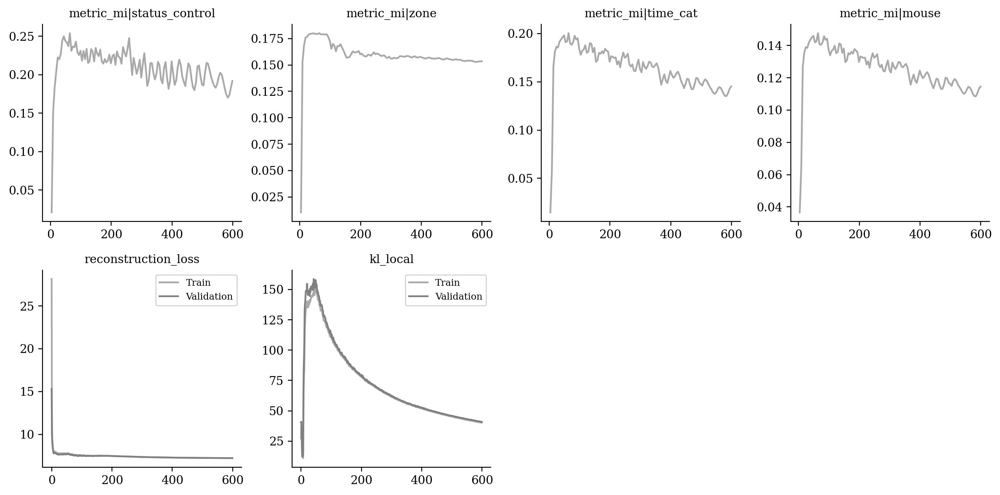

In [15]:
vae.plot_training_history(
    ignore_first=0,
    n_col=4,
    metrics_name=["metric_mi|status_control", "metric_mi|zone", "metric_mi|time_cat", "metric_mi|mouse",
                 "reconstruction_loss", "kl_local"]
)

In [16]:
from tardis._disentanglementmanager import DisentanglementManager as DM

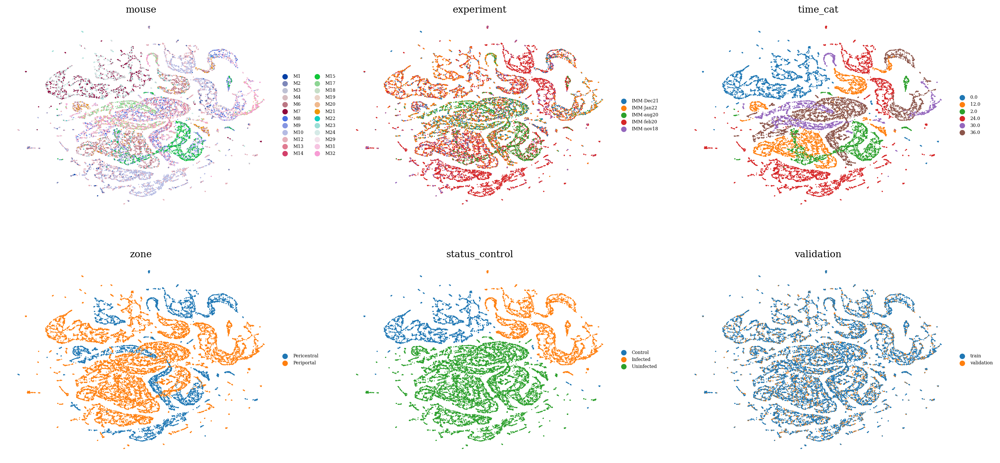

In [17]:
sublatent = DM.configurations.get_by_obs_key("status_control").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

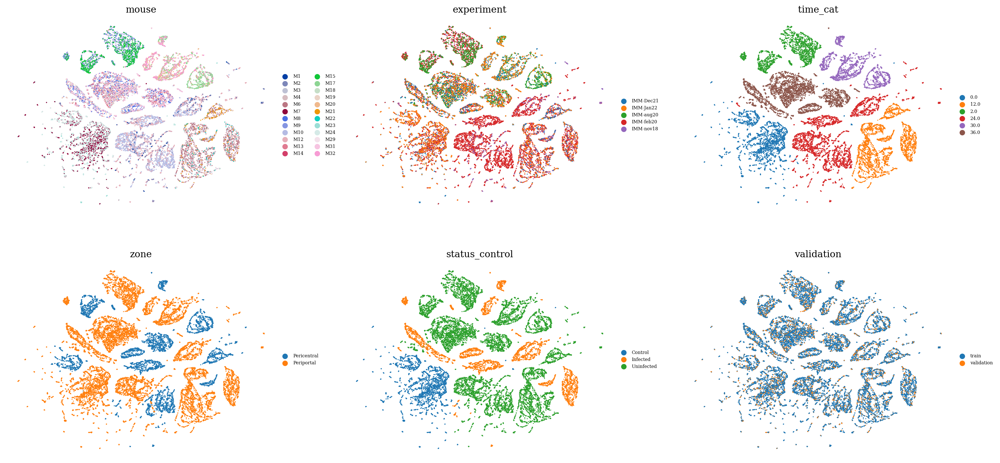

In [18]:
sublatent = DM.configurations.get_by_obs_key("time_cat").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

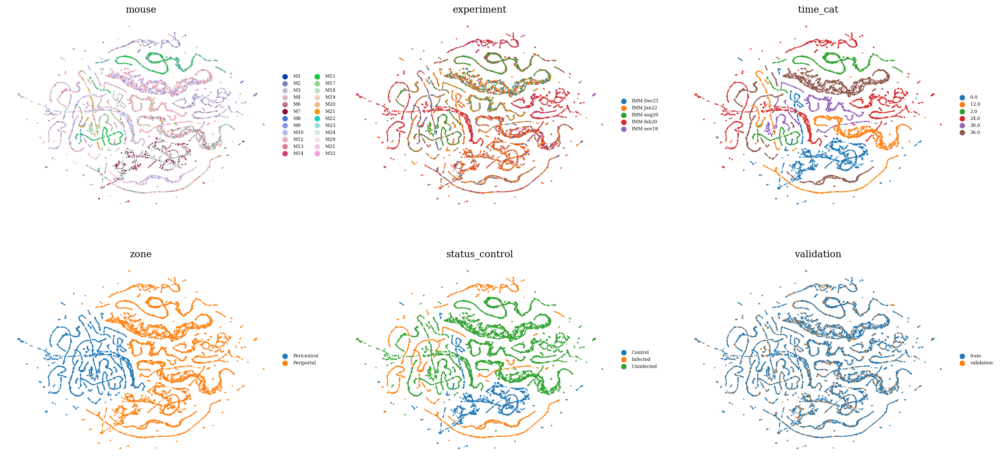

In [19]:
sublatent = DM.configurations.get_by_obs_key("zone").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

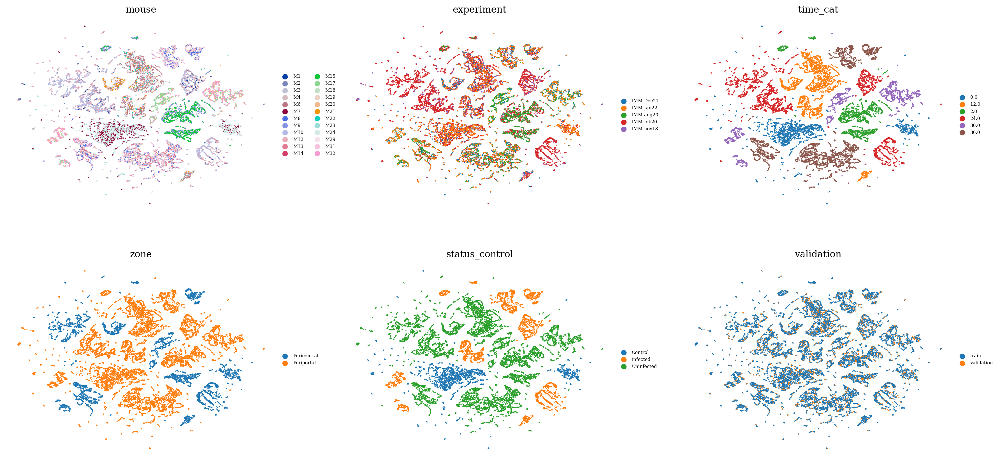

In [20]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

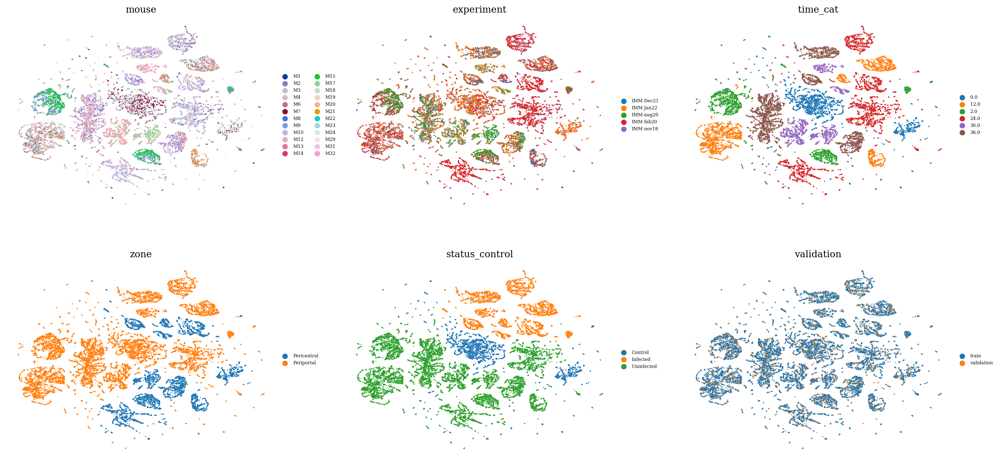

In [21]:
latent = ad.AnnData(X=vae.get_latent_representation(), obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

In [22]:
data = vae.get_latent_representation()

import sklearn
factors_indices = sorted([[indice, config.obs_key] for config in DM.configurations.items for indice in config.reserved_latent_indices])
factors = np.vstack([sklearn.preprocessing.LabelEncoder().fit_transform(
    adata.obs[j].copy().astype(str).values.flatten()
) for i, j in factors_indices]).T

data = data[:, [i for i, j in factors_indices]]

maxMIG = vae.get_MI_precalculated(data=data, factors=factors, variation="maxMIG", discretization_bins=256)
maxMIG_mean = np.mean(maxMIG)
maxMIG_mean

0.5443852878575507

In [23]:
data = vae.get_latent_representation()

import sklearn
factors_indices = sorted([[indice, config.obs_key] for config in DM.configurations.items for indice in config.reserved_latent_indices])
factors = np.vstack([sklearn.preprocessing.LabelEncoder().fit_transform(
    adata.obs[j].copy().astype(str).values.flatten()
) for i, j in factors_indices]).T

data = data[:, [i for i, j in factors_indices]]

maxMIG = vae.get_MI_precalculated(data=data[vae.validation_indices, :], factors=factors[vae.validation_indices, :], variation="maxMIG", discretization_bins=256)
maxMIG_mean = np.mean(maxMIG)
maxMIG_mean

0.5235083929096449

In [24]:
vae.get_MI_normalized_training("zone")

{('validation', 'reserved'): 0.9974276664669274,
 ('validation', 'unreserved'): 0.5105067880094051,
 ('train', 'reserved'): 0.9960701473773603,
 ('train', 'unreserved'): 0.47991452174169763}

In [25]:
vae.get_MI_normalized_training("status_control")

{('validation', 'reserved'): 0.9960552614645453,
 ('validation', 'unreserved'): 0.6890984483802525,
 ('train', 'reserved'): 0.9951105015356839,
 ('train', 'unreserved'): 0.6671545442651718}

In [26]:
vae.get_MI_normalized_training("time_cat")

{('validation', 'reserved'): 0.994054536619239,
 ('validation', 'unreserved'): 0.6328202341567458,
 ('train', 'reserved'): 0.994683101816119,
 ('train', 'unreserved'): 0.5996576571396506}